# * Data gathering

In [14]:
import pandas as pd
import numpy as np

filepath = r"C:\Users\shiva\OneDrive\Desktop\weather.csv"  # csv file downloaded from IMD(India Meteorological Department) 
df = pd.read_csv(filepath)                                 # contains weather data of Jaipur city for the past 25 years.

df.head()

,date,temperature_2m_mean (°C),temperature_2m_max (°C),temperature_2m_min (°C),precipitation_hours (h),precipitation_sum (mm),wind_speed_10m_max (km/h),wind_direction_10m_dominant (°),shortwave_radiation_sum (MJ/m²),et0_fao_evapotranspiration (mm),wind_speed_10m_min (km/h),wind_speed_10m_mean (km/h),cloud_cover_mean (%),cloud_cover_max (%),cloud_cover_min (%)
0,01-01-2000,14.2,21.2,8.1,0,0.0,11.2,93,15.57,2.80,4.2,7.9,0,0,0
1,02-01-2000,13.7,20.8,7.1,0,0.0,8.9,90,15.71,2.73,2.2,6.7,1,11,0
2,03-01-2000,13.5,20.8,6.7,0,0.0,8.3,75,15.84,2.63,0.8,5.1,0,0,0
3,04-01-2000,13.5,20.9,7.1,0,0.0,8.3,89,15.80,2.75,0.8,5.8,0,0,0
4,05-01-2000,13.7,20.9,6.9,0,0.0,8.4,71,15.58,2.75,0.8,6.1,0,0,0


# * Check if the datatypes of all columns are correct or not.

In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9223 entries, 0 to 9222
Data columns (total 15 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   date                             9223 non-null   object 
 1   temperature_2m_mean (°C)         9223 non-null   float64
 2   temperature_2m_max (°C)          9223 non-null   float64
 3   temperature_2m_min (°C)          9223 non-null   float64
 4   precipitation_hours (h)          9223 non-null   int64  
 5   precipitation_sum (mm)           9223 non-null   float64
 6   wind_speed_10m_max (km/h)        9223 non-null   float64
 7   wind_direction_10m_dominant (°)  9223 non-null   int64  
 8   shortwave_radiation_sum (MJ/m²)  9223 non-null   float64
 9   et0_fao_evapotranspiration (mm)  9223 non-null   float64
 10  wind_speed_10m_min (km/h)        9223 non-null   float64
 11  wind_speed_10m_mean (km/h)       9223 non-null   float64
 12  cloud_cover_mean (%)

In [15]:
# changing the datatype of column 'date' from object to datetime
df['date'] = pd.to_datetime(df['date'], format="%d-%m-%Y", errors='coerce')

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9223 entries, 0 to 9222
Data columns (total 15 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   date                             9223 non-null   datetime64[ns]
 1   temperature_2m_mean (°C)         9223 non-null   float64       
 2   temperature_2m_max (°C)          9223 non-null   float64       
 3   temperature_2m_min (°C)          9223 non-null   float64       
 4   precipitation_hours (h)          9223 non-null   int64         
 5   precipitation_sum (mm)           9223 non-null   float64       
 6   wind_speed_10m_max (km/h)        9223 non-null   float64       
 7   wind_direction_10m_dominant (°)  9223 non-null   int64         
 8   shortwave_radiation_sum (MJ/m²)  9223 non-null   float64       
 9   et0_fao_evapotranspiration (mm)  9223 non-null   float64       
 10  wind_speed_10m_min (km/h)        9223 non-null   float64    

In [57]:
df.head()

,date,temperature_2m_mean (°C),temperature_2m_max (°C),temperature_2m_min (°C),precipitation_hours (h),precipitation_sum (mm),wind_speed_10m_max (km/h),wind_direction_10m_dominant (°),shortwave_radiation_sum (MJ/m²),et0_fao_evapotranspiration (mm),wind_speed_10m_min (km/h),wind_speed_10m_mean (km/h),cloud_cover_mean (%),cloud_cover_max (%),cloud_cover_min (%)
0,2000-01-01,14.2,21.2,8.1,0,0.0,11.2,93,15.57,2.80,4.2,7.9,0,0,0
1,2000-01-02,13.7,20.8,7.1,0,0.0,8.9,90,15.71,2.73,2.2,6.7,1,11,0
2,2000-01-03,13.5,20.8,6.7,0,0.0,8.3,75,15.84,2.63,0.8,5.1,0,0,0
3,2000-01-04,13.5,20.9,7.1,0,0.0,8.3,89,15.80,2.75,0.8,5.8,0,0,0
4,2000-01-05,13.7,20.9,6.9,0,0.0,8.4,71,15.58,2.75,0.8,6.1,0,0,0


Now all the columns have correct datatypes.

# * Handling null/missing values in the dataset (If any).

In [ ]:
# Check for missing values
#print(df.isnull().sum())

# Fill missing values
#df.fillna(method="ffill", inplace=True)         # ffill (forward fill) -> replaces a missing value with the last valid (previous) value.

# * Deriving some new columns which might help in the weather analysis. 

In [16]:
df["temperature_range"] = df["temperature_2m_max (°C)"] - df["temperature_2m_min (°C)"]
df["wind_speed_range"] = df["wind_speed_10m_max (km/h)"] - df["wind_speed_10m_min (km/h)"]
df["cloud_cover_range"] = df["cloud_cover_max (%)"] - df["cloud_cover_min (%)"]
df["wind_chill"] = df["temperature_2m_mean (°C)"] - (0.7 * df["wind_speed_10m_mean (km/h)"])
df["precipitation_intensity"] = df["precipitation_sum (mm)"] / (df["precipitation_hours (h)"] + 1)
df["weather_category"] = df["precipitation_sum (mm)"].apply(lambda x: "Rainy" if x > 0 else "Clear")

# * Data visulization

In [50]:
import matplotlib.pyplot as plt
import seaborn as sns

## 1) Temperature Trends Over Time

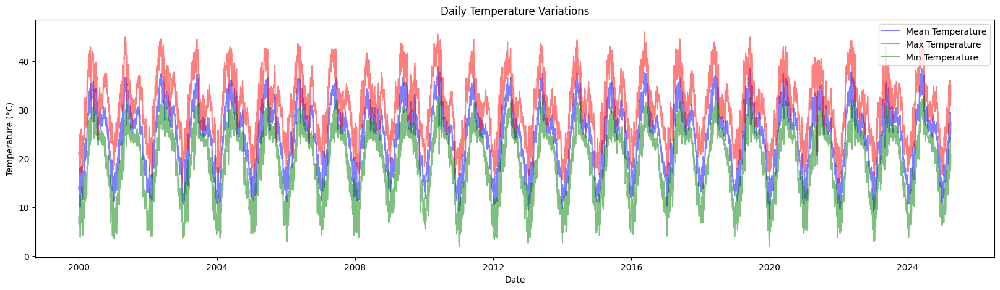

In [28]:
plt.figure(figsize=(20, 5))
plt.plot(df["date"], df["temperature_2m_mean (°C)"], label="Mean Temperature", color="blue", alpha=.5)
plt.plot(df["date"], df["temperature_2m_max (°C)"], label="Max Temperature", color="red", alpha=.5)
plt.plot(df["date"], df["temperature_2m_min (°C)"], label="Min Temperature", color="green", alpha=.5)
plt.xlabel("Date")
plt.ylabel("Temperature (°C)")
plt.title("Daily Temperature Variations")
plt.legend()
plt.show()

#### Key Takeways:
1) The temperature shows a strong repeating annual pattern, indicating clear summer and winter cycles.
2) Long-Term Stability with Possible Warming Trend:
   * _No sudden climate shift is visible, meaning Jaipur’s climate has been stable over the years._
   * _However, a gradual upward trend in peaks may suggest increasing max temperatures over time, hinting at possible warming effects._
3) The gap between max & min temperatures is substantial, especially in extreme seasons (Peak summer & winter).
4) Extreme Heat Events & Cooling Periods:
   * _Frequent sharp spikes in max temperatures (heat waves) are visible, requiring caution for public health & water management._
   * _Winters show deep dips in temperature, confirming Jaipur’s extreme climate shifts across seasons._
#### Useful in:
* Urban planning.
* Energy management (cooling/heating demand).
* Climate adaptation strategies. 

## 2) Monthly Temperature Distribution

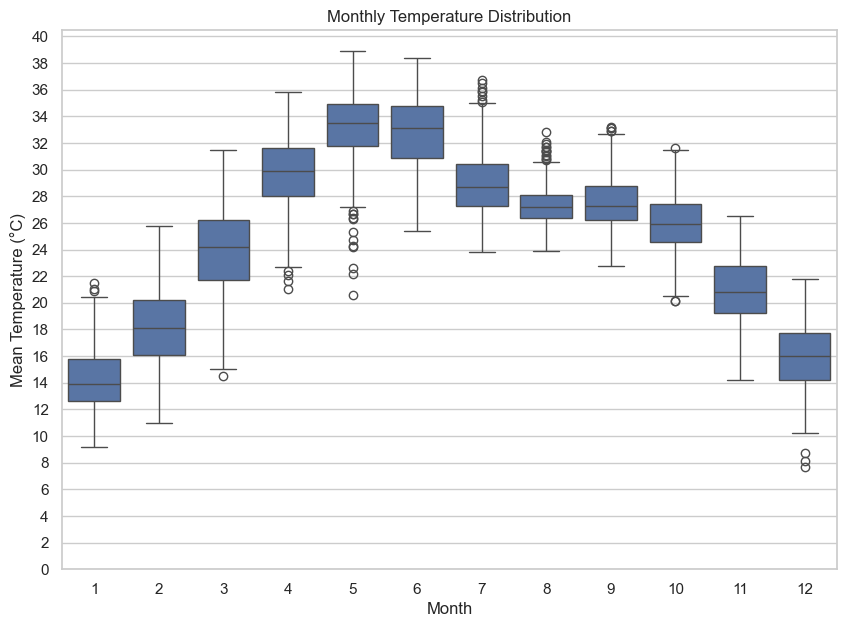

In [168]:
df["month"] = pd.to_datetime(df["date"]).dt.month
plt.figure(figsize=(10, 7))
sns.boxplot(x="month", y="temperature_2m_mean (°C)", data=df)
plt.xlabel("Month")
plt.ylabel("Mean Temperature (°C)")
plt.title("Monthly Temperature Distribution")
plt.yticks(np.arange(0, 41, 2))
plt.show()

#### Key Takeaways:
1) Jaipur experiences hot summers (April-June) with high variability.
2) Winters (Dec-Feb) are relatively stable but cold.
3) Monsoons (July-Sep) bring moderate and stable temperatures.
4) Extreme temperatures (hot & cold) occur occasionally, as shown by the outliers.
#### Useful in:
* Understanding seasonal trends.
* Predicting temperature fluctuations.
* Identifying extreme weather events.

## 3) Rainfall & Precipitation Analysis

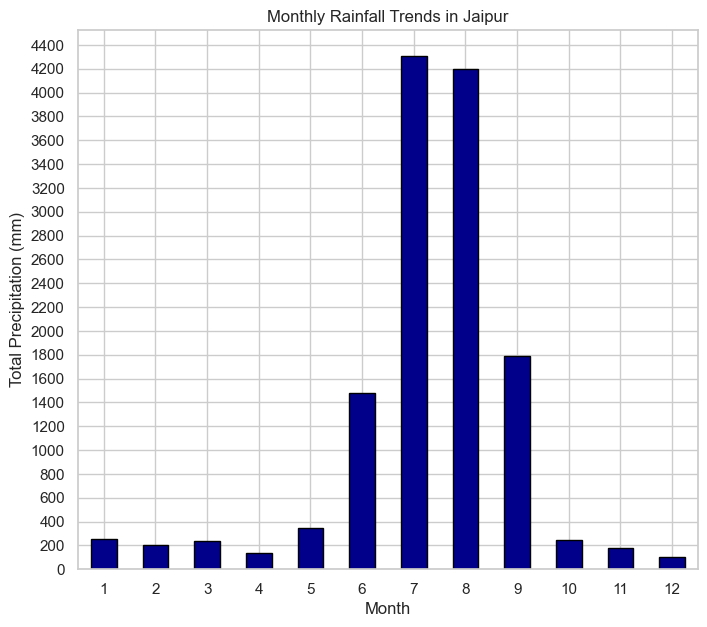

In [167]:
df.groupby("month")["precipitation_sum (mm)"].sum().plot(kind="bar", figsize=(8, 7), color="darkblue", edgecolor='black')
plt.xlabel("Month")
plt.ylabel("Total Precipitation (mm)")
plt.title("Monthly Rainfall Trends in Jaipur")
plt.yticks(np.arange(0, 4500, 200))
plt.xticks(rotation=0)
plt.show()

#### Key Takeways:
1) Monsoon Dominates Rainfall (June–September).
2) Minimal Rainfall in Other Months (October–May).
3) Sharp Rainfall Increase & Decrease:
   * _A sharp spike in rainfall occurs from May to June, marking the arrival of the monsoon._
   * _A sharp decline after September signals the withdrawal of monsoon and the start of dry months._
#### Useful in:
* Disaster preparedness.
* Urban planning.
* Sustainable water management.

## 4) Rainfall Intensity Distribution

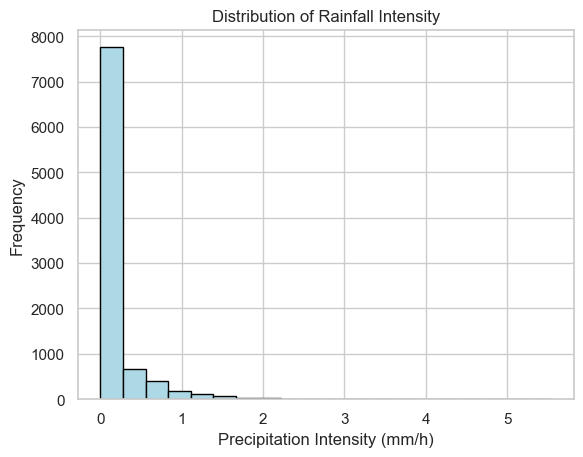

In [166]:
plt.hist(df["precipitation_intensity"], bins=20, color="lightblue", edgecolor="black")
plt.xlabel("Precipitation Intensity (mm/h)")
plt.ylabel("Frequency")
plt.title("Distribution of Rainfall Intensity")
plt.show()

#### Key Takeaways:
1) Jaipur's climate is predominantly dry, with low rainfall on most days.
2) When rain occurs, it is usually of low intensity.
3) The histogram is highly right-skewed, meaning most rainfall events are of low intensity.
#### Useful in:
* Water resource planning.
* Disaster management.
* Urban drainage system design.

## 5) Wind Speed Over Time

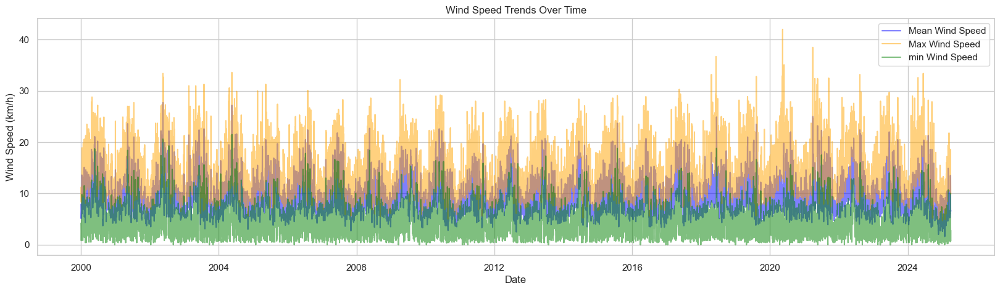

In [156]:
plt.figure(figsize=(20, 5))
plt.plot(df["date"], df["wind_speed_10m_mean (km/h)"], label="Mean Wind Speed", color="blue", alpha=.5)
plt.plot(df["date"], df["wind_speed_10m_max (km/h)"], label="Max Wind Speed", color="orange", alpha=.5)
plt.plot(df["date"], df["wind_speed_10m_min (km/h)"], label="min Wind Speed", color="green", alpha=.5)
plt.xlabel("Date")
plt.ylabel("Wind Speed (km/h)")
plt.title("Wind Speed Trends Over Time")
plt.legend()
plt.show()

#### Key Takeaways:
1) Wind speeds follow a seasonal trend, peaking at certain times of the year.
2) Extreme wind events (high spikes in max wind speed) occur but are not frequent.
3) Mean wind speed remains stable over time, indicating a consistent wind climate.
4) The max wind speed appears to increase slightly after 2020, which could indicate more frequent extreme wind events in recent years.
#### Useful in:
* Improving disaster preparedness by identifying wind speed trends linked to storms and extreme weather.
* Building safer infrastructure design.
* Enhancing early warning systems and evacuation strategies for high-risk areas.

## 6) Wind Chill vs. Temperature

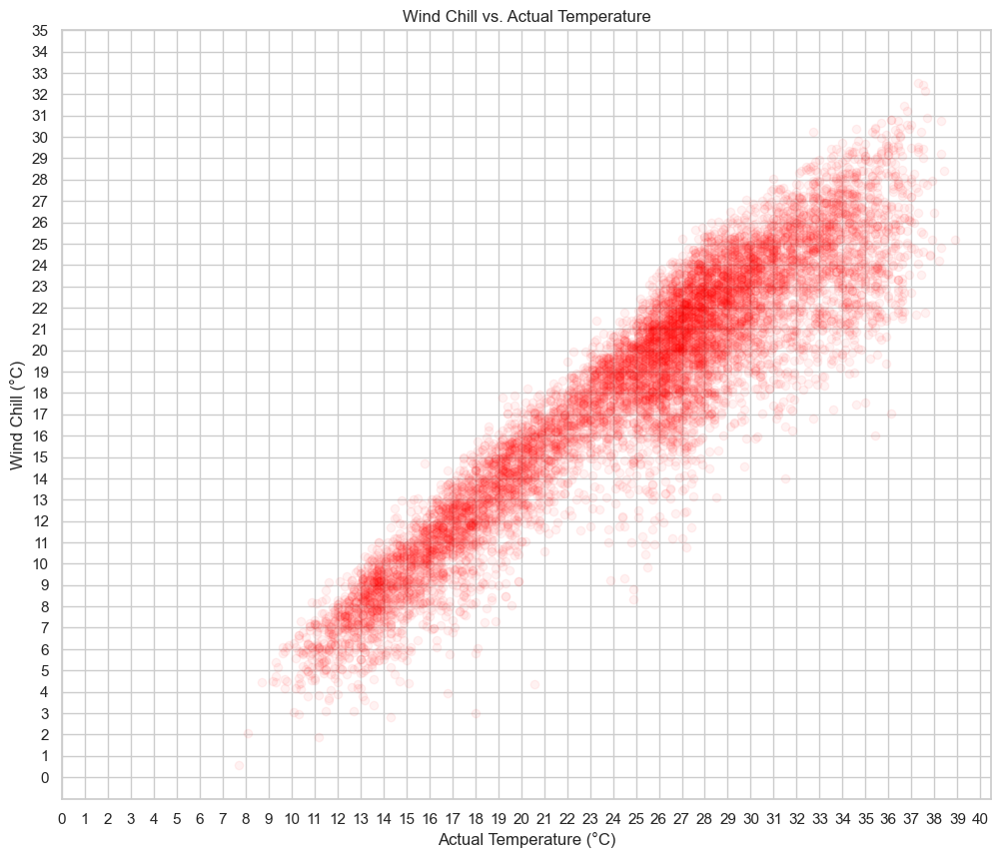

In [165]:
plt.figure(figsize=(12,10))
plt.scatter(df["temperature_2m_mean (°C)"], df["wind_chill"], color="red", alpha=0.05)
plt.xlabel("Actual Temperature (°C)")
plt.ylabel("Wind Chill (°C)")
plt.title("Wind Chill vs. Actual Temperature")
plt.xticks(np.arange(0, 41, 1))
plt.yticks(np.arange(0, 36, 1))
plt.show()

#### Key Takeaways:
1) Wind chill increases as actual temperature increases.
2) Wind chill is almost always lower (colder) than the actual temperature.
3) The cooling effect (Tempreture - Wind Chill) is greater at lower actual temperatures.
4) Variations in wind speed cause a range of wind chill values at the same actual temperature.
#### Usefull in:
* __Accurate Risk Assessment:__ Wind chill reveals the true danger of cold, which is often much higher than temperature alone suggests.

## 7) Percentage of Rainy vs. Clear Days

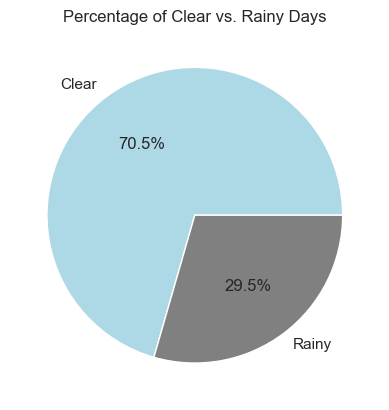

In [162]:
df["weather_category"].value_counts().plot(kind="pie", autopct="%1.1f%%", colors=["lightblue", "gray"])
plt.title("Percentage of Clear vs. Rainy Days")
plt.ylabel("")
plt.show()

## 8) Monthly Cloud Cover

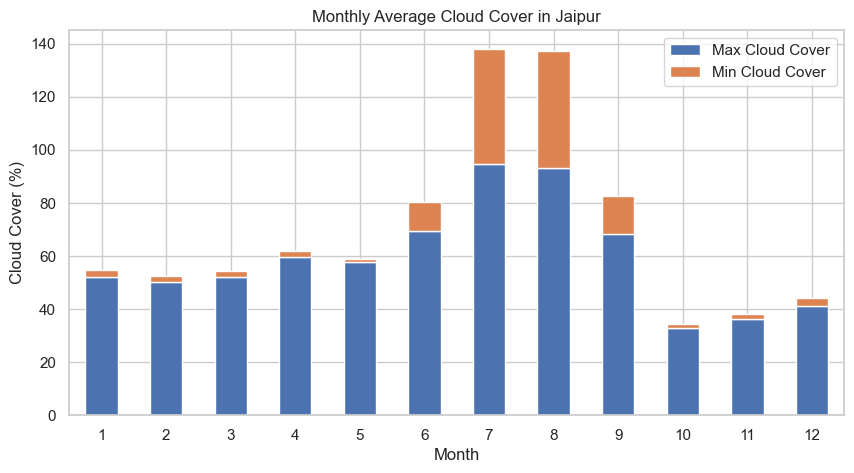

In [163]:
df.groupby("month")[["cloud_cover_max (%)", "cloud_cover_min (%)"]].mean().plot(kind="bar", stacked=True, figsize=(10,5))
plt.xlabel("Month")
plt.ylabel("Cloud Cover (%)")
plt.title("Monthly Average Cloud Cover in Jaipur")
plt.legend(["Max Cloud Cover", "Min Cloud Cover"])
plt.xticks(rotation=0)
plt.show()

#### Key Takeaways:
1) High Cloud Cover in Monsoon with notable difference between the maximum and minimum average cloud cover during monsoon.
2) Low Cloud Cover in Winter and Pre-Monsoon with significantly smaller difference between the maximum and minimum average cloud cover.
3) June and September appear to be transitional months, showing an increase towards the monsoon (June) and a decrease after the monsoon (September).
#### Useful in:
* Detailed meteorological data is essential for flight operations.
* Farmers can use this information to plan planting and harvesting schedules.
* Planning outdoor activities, tours, and events using this data to identify the suitable times.

## 9) Correlation Between Features

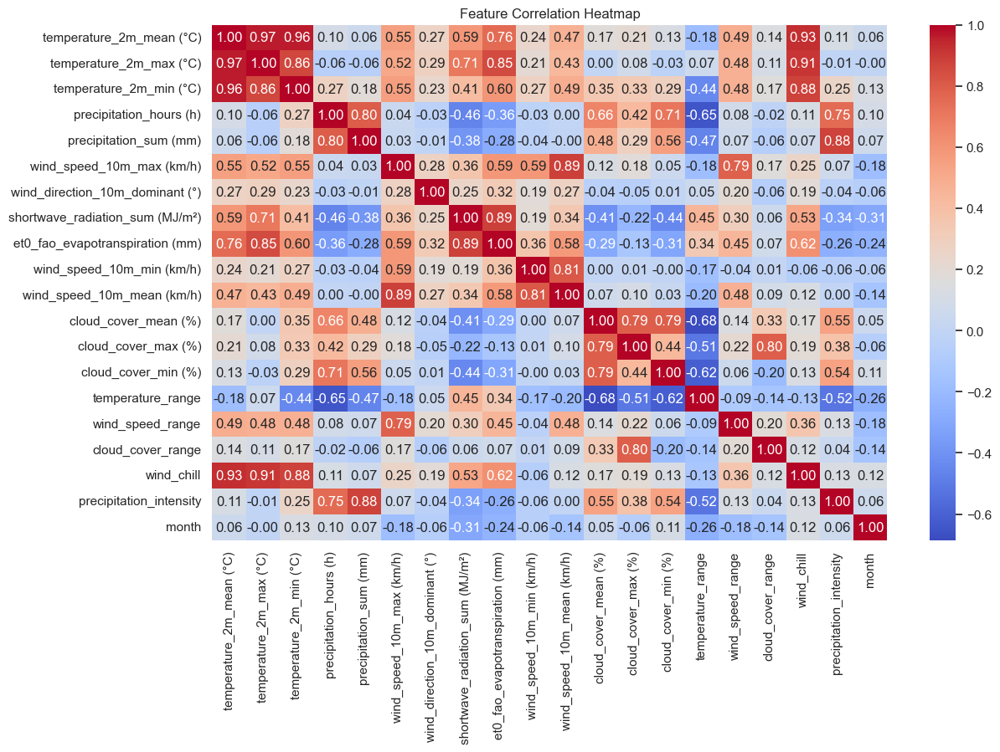

In [164]:
# Selecting only numeric columns
numeric_df = df.select_dtypes(include=["number"])

plt.figure(figsize=(13, 8))
sns.heatmap(numeric_df.corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Feature Correlation Heatmap")
plt.show()

#### Key Takeaways:
1) Temperature and evapotranspiration are positively correlated: Higher temperatures tend to be associated with higher potential evapotranspiration.
2) Cloud cover shows a moderate negative correlation with solar radiation: More cloud cover tends to reduce incoming shortwave radiation.
3) Wind direction shows relatively weak correlations with most other features.
4) Wind chill shows a strong positive correlation with wind speed and a negative correlation with temperature.
#### Useful in:
* Serving as a visual guide for understanding feature dependencies.
* Simplifying datasets.
* Improving model performance.
* Gaining deeper insights into the relationships within the data.

## 10) Relationships Between Key Weather Variables

<Figure size 1300x800 with 0 Axes>

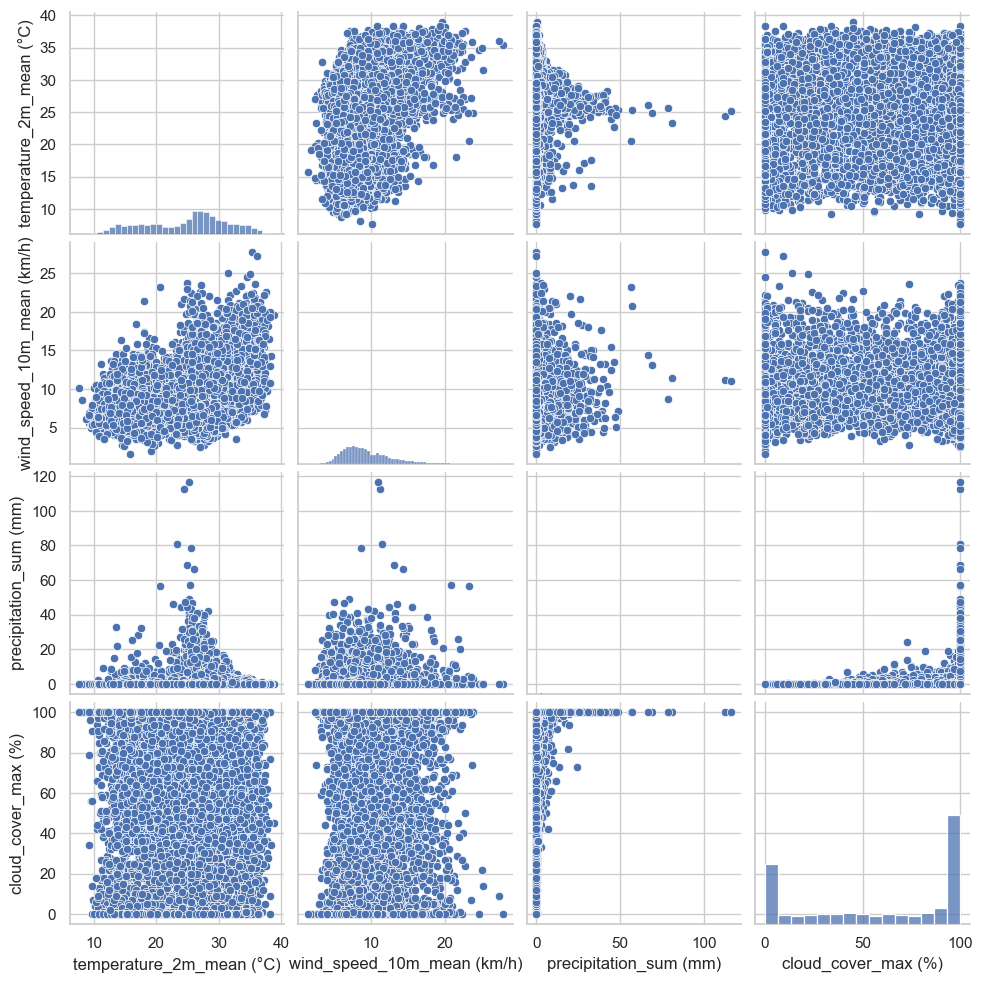

In [161]:
plt.figure(figsize=(13, 8))
sns.pairplot(df[["temperature_2m_mean (°C)", "wind_speed_10m_mean (km/h)", "precipitation_sum (mm)", "cloud_cover_max (%)"]])
plt.show()

#### Key Takeaways:
1) There's a clear positive relationship between total precipitation and maximum cloud cover. Higher amounts of precipitation tend to be associated with higher maximum cloud cover. This aligns with the understanding that clouds are necessary for precipitation.
 
2) Distributions of Individual Parameters:
   * ___Temperature:__ The histogram for mean temperature shows skewness towards higher temperatures, with a peak in the warmer range._
   * ___Wind Speed:__ The histogram for mean wind speed is skewed towards lower values, indicating that lower wind speeds are more frequent._
   * ___Precipitation:__ The histogram for total precipitation is heavily skewed towards very low precipitation amounts, with fewer occurrences of_ higher precipitation.
   * ___Cloud Cover:__ The histogram for maximum cloud cover shows peaks at both very low and very high cloud cover percentages, suggesting a bimodal distribution with a tendency towards extremes._
#### Useful in:
* Offering a multifaceted visual summary of your data's pairwise relationships and individual distributions
* Initial data exploration.
* Feature understanding.
* Informing subsequent analysis & Modeling steps.

# *Weather Forecasting

In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV, cross_val_score, train_test_split, KFold
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier, StackingRegressor, BaggingClassifier, VotingClassifier
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, classification_report, confusion_matrix, accuracy_score
from sklearn.linear_model import LinearRegression, Ridge, LogisticRegression
from xgboost import XGBRegressor, XGBClassifier
from lightgbm import LGBMRegressor, LGBMClassifier
from sklearn.tree import DecisionTreeRegressor
import warnings
warnings.filterwarnings("ignore")

# train_test 22yrs training + 3yrs testing


🏁 Starting processing for TARGET: temperature_2m_mean (°C)

🔧 Training RANDOM_FOREST for temperature_2m_mean (°C)...


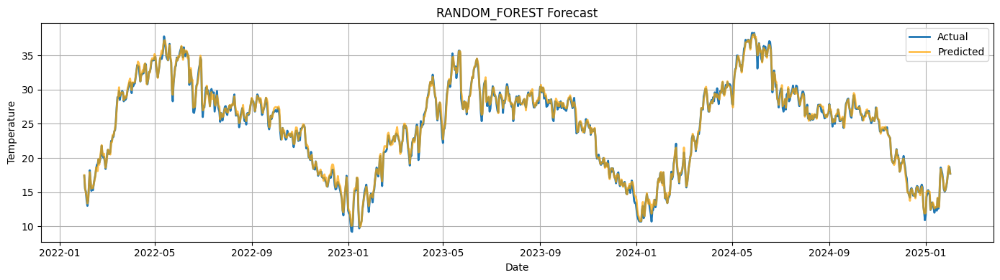

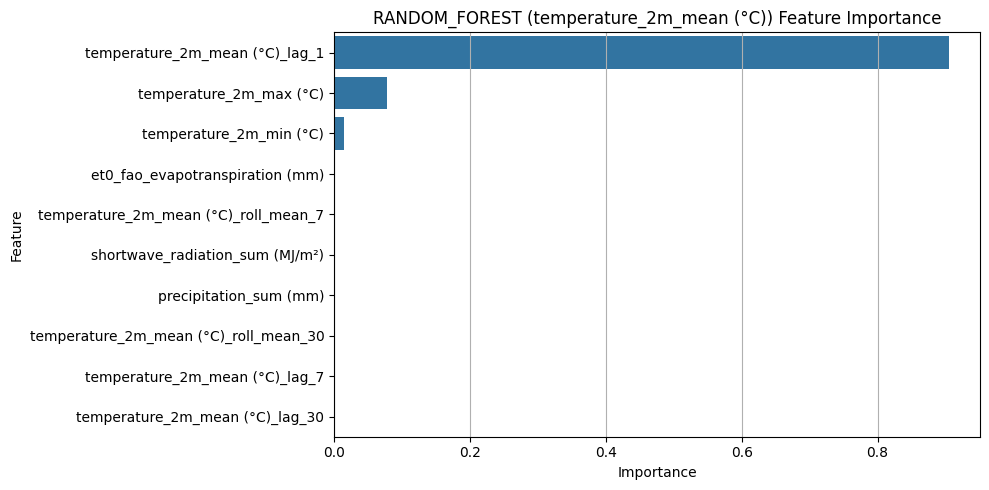


🔧 Training XGBOOST for temperature_2m_mean (°C)...


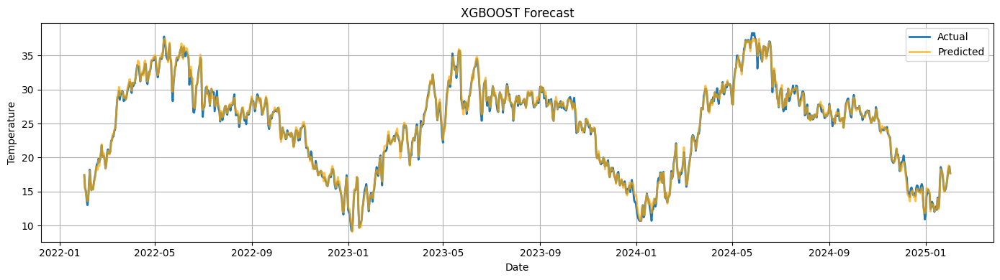

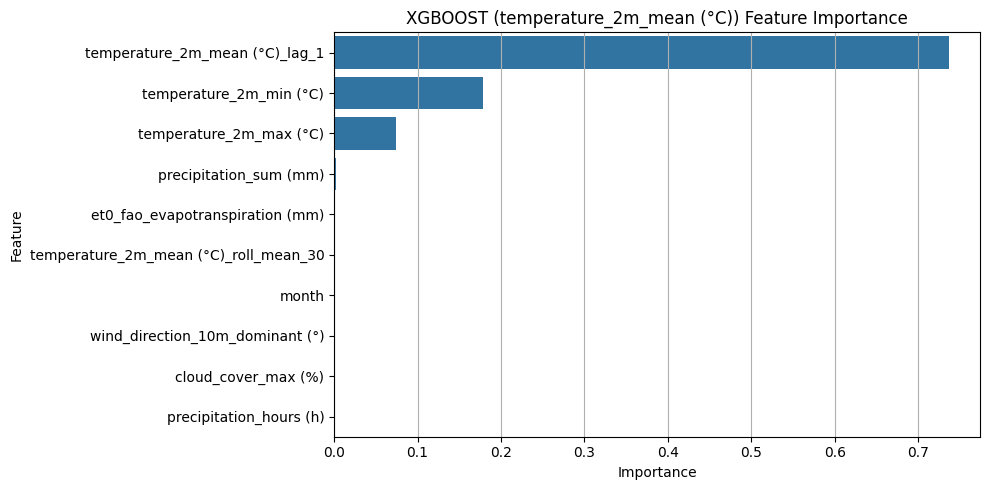


🔧 Training LIGHTGBM for temperature_2m_mean (°C)...
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3731
[LightGBM] [Info] Number of data points in the train set: 8037, number of used features: 21
[LightGBM] [Info] Start training from score 24.930036
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


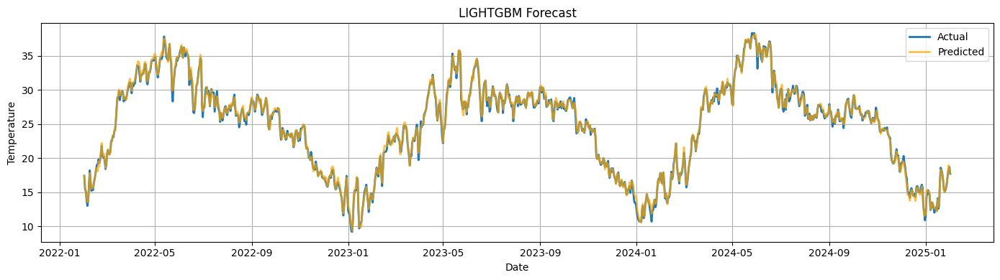

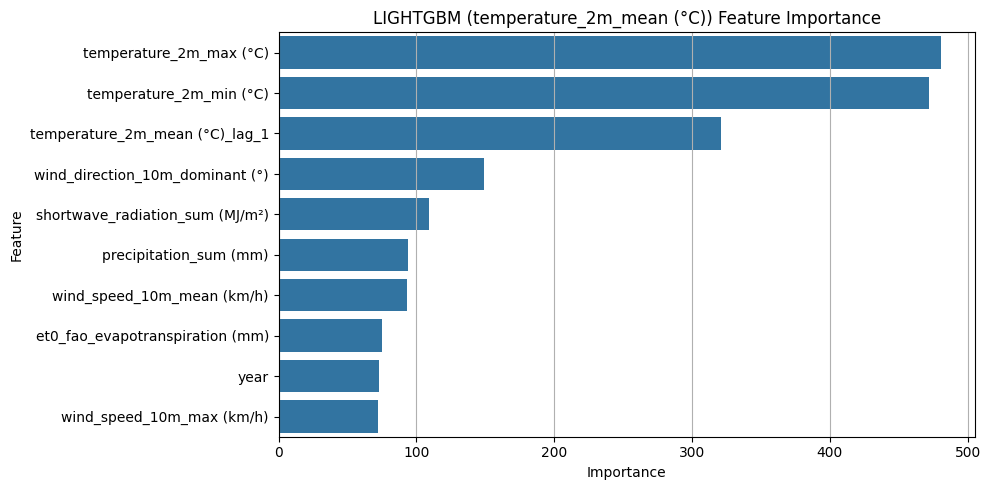


🔁 Training STACKED ENSEMBLE for temperature_2m_mean (°C)...


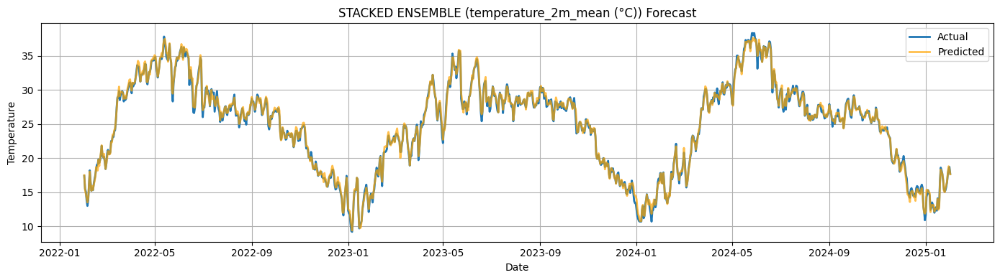


📊 Performance Comparison for temperature_2m_mean (°C)
              random_forest  xgboost  lightgbm  stacked_ensemble
RMSE                  0.428    0.422     0.391             0.414
MAE                   0.323    0.324     0.295             0.316
R²                    0.996    0.996     0.996             0.996
Accuracy (%)         98.692   98.691    98.807            98.721

🏁 Starting processing for TARGET: wind_speed_10m_mean (km/h)

🔧 Training RANDOM_FOREST for wind_speed_10m_mean (km/h)...


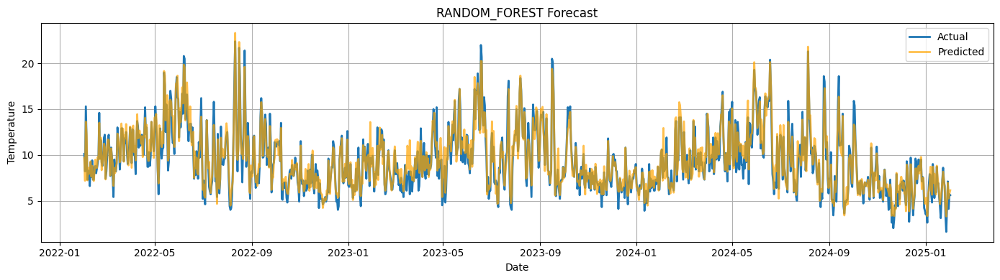

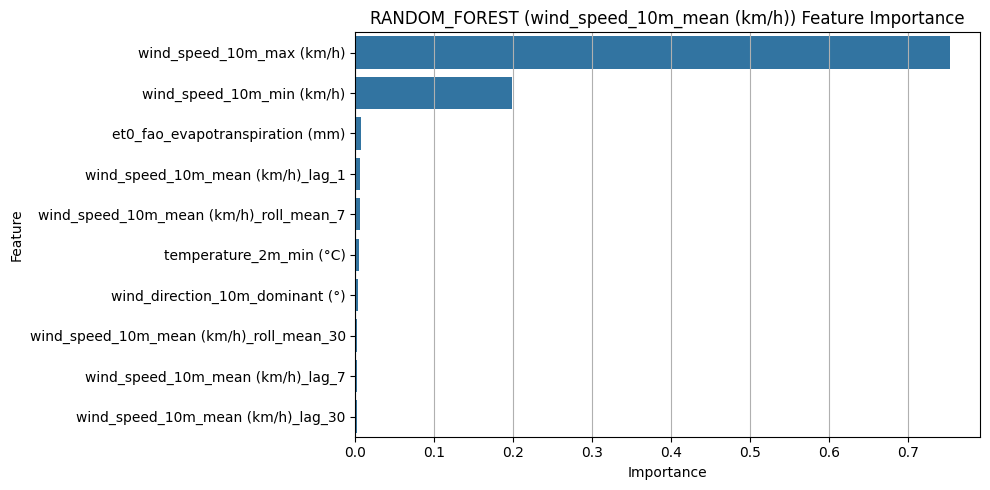


🔧 Training XGBOOST for wind_speed_10m_mean (km/h)...


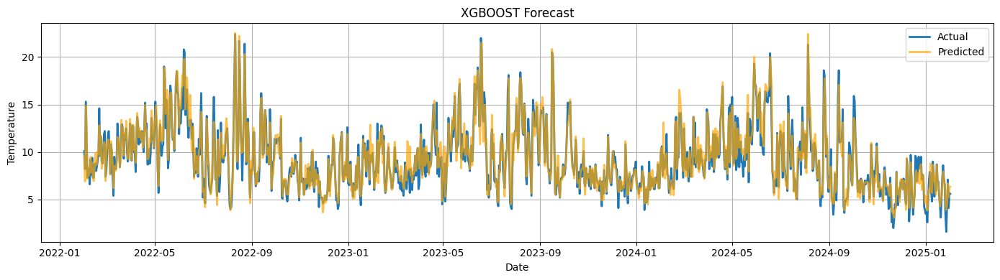

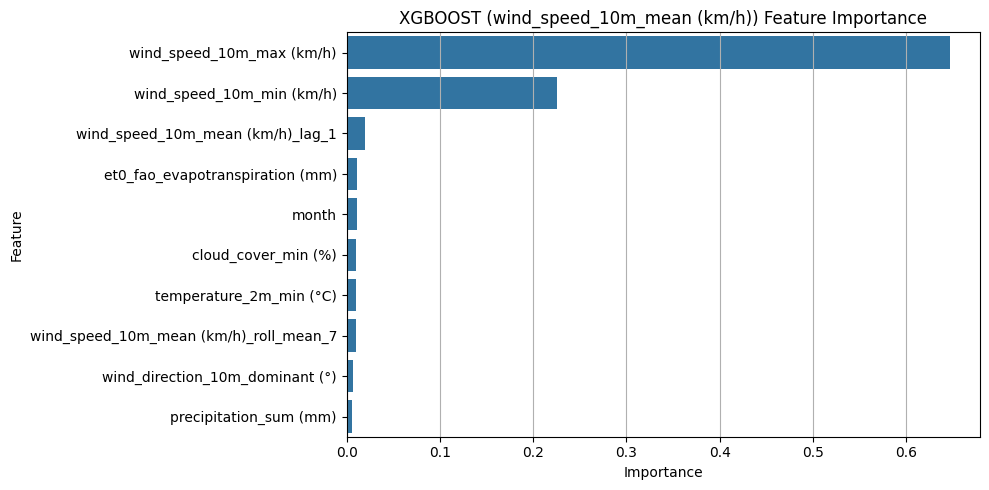


🔧 Training LIGHTGBM for wind_speed_10m_mean (km/h)...
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3613
[LightGBM] [Info] Number of data points in the train set: 8037, number of used features: 21
[LightGBM] [Info] Start training from score 9.595658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

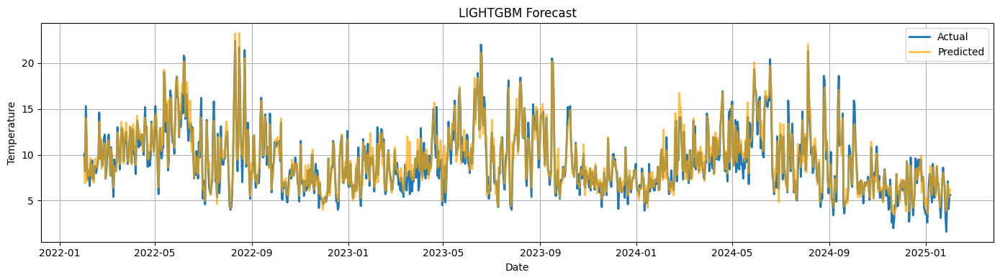

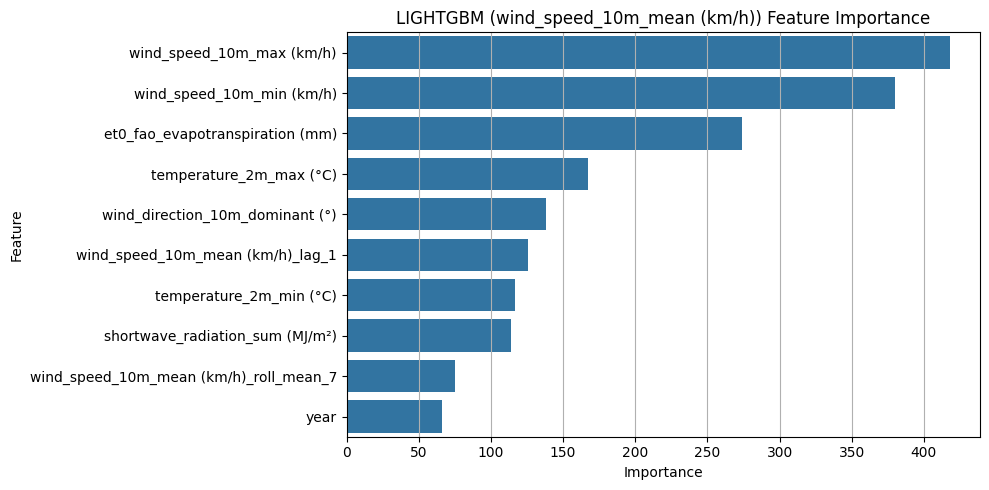


🔁 Training STACKED ENSEMBLE for wind_speed_10m_mean (km/h)...


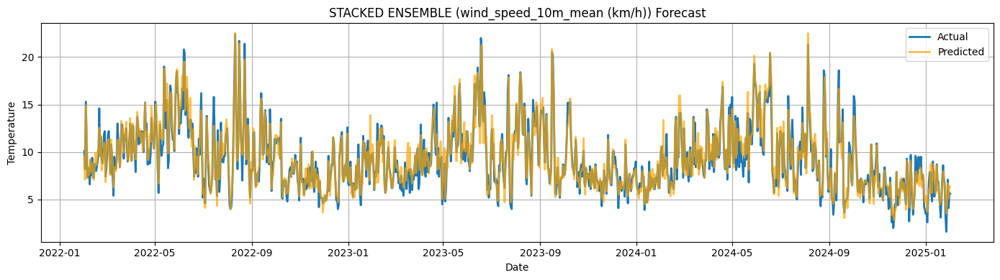


📊 Performance Comparison for wind_speed_10m_mean (km/h)
              random_forest  xgboost  lightgbm  stacked_ensemble
RMSE                  1.047    0.987     0.994             1.029
MAE                   0.768    0.734     0.730             0.763
R²                    0.906    0.917     0.915             0.909
Accuracy (%)         91.785   92.151    92.195            91.843

🏁 Starting processing for TARGET: cloud_cover_max (%)

🔧 Training RANDOM_FOREST for cloud_cover_max (%)...


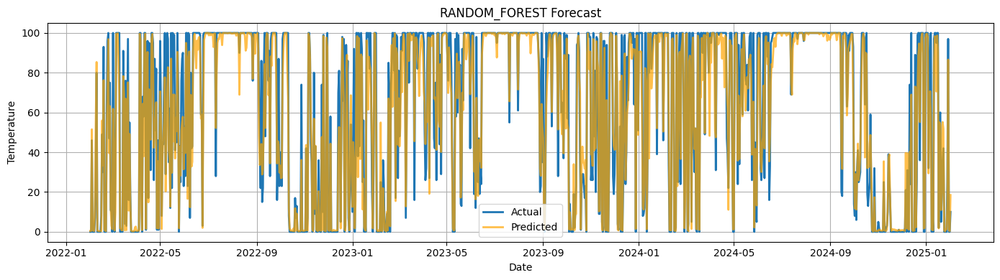

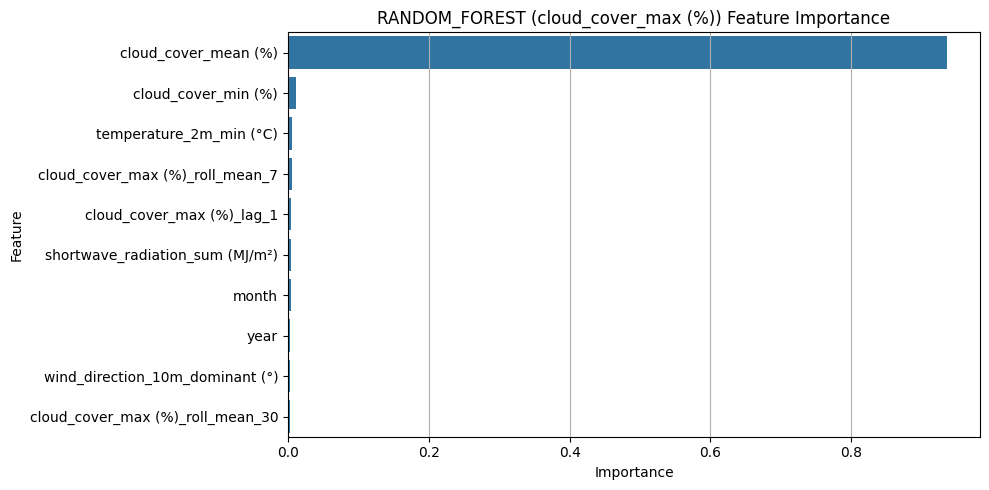


🔧 Training XGBOOST for cloud_cover_max (%)...


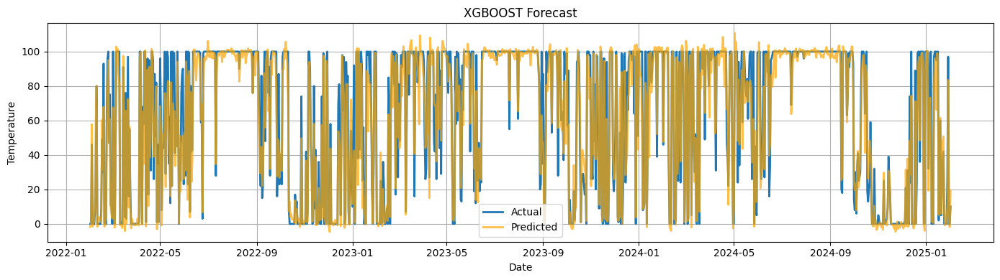

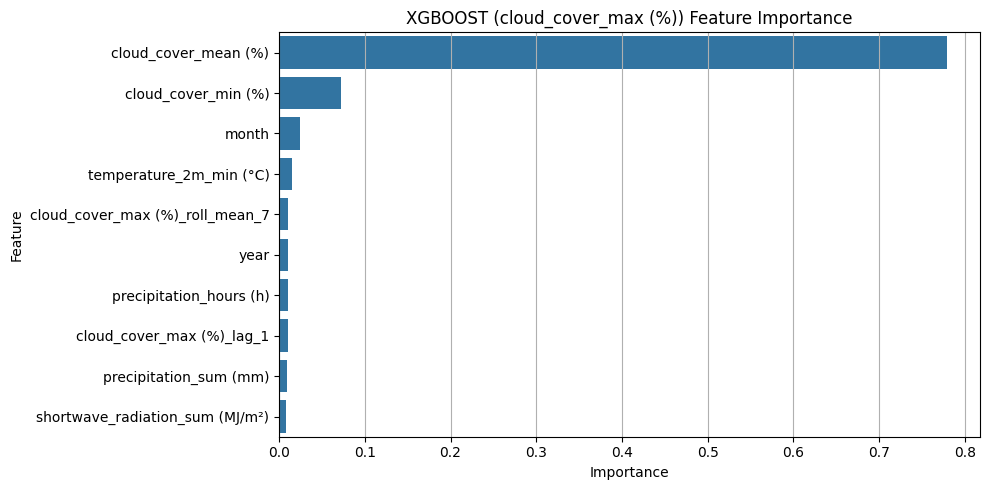


🔧 Training LIGHTGBM for cloud_cover_max (%)...
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3428
[LightGBM] [Info] Number of data points in the train set: 8037, number of used features: 21
[LightGBM] [Info] Start training from score 58.218863
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

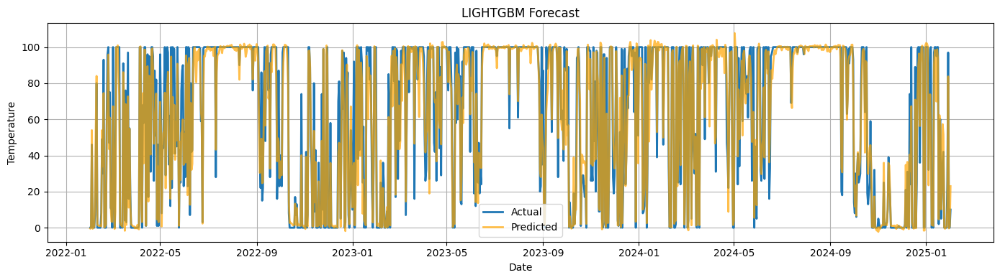

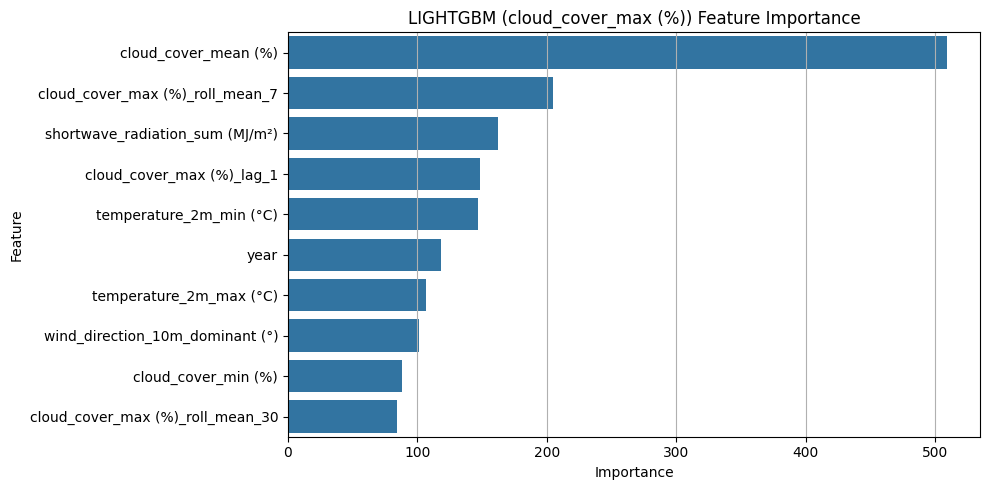


🔁 Training STACKED ENSEMBLE for cloud_cover_max (%)...


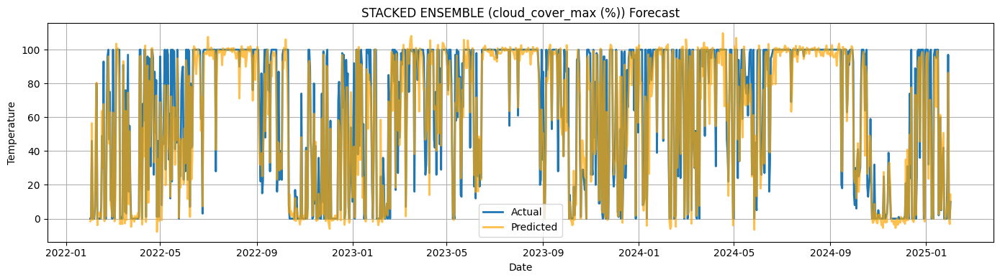


📊 Performance Comparison for cloud_cover_max (%)
              random_forest  xgboost  lightgbm  stacked_ensemble
RMSE                 11.739   11.295    11.124            12.078
MAE                   6.941    6.953     6.639             7.471
R²                    0.918    0.924     0.926             0.913
Accuracy (%)         89.357   89.339    89.820            88.544

✅ ALL TARGETS COMPLETED

📈 Results for temperature_2m_mean (°C)
              random_forest  xgboost  lightgbm  stacked_ensemble
RMSE                  0.428    0.422     0.391             0.414
MAE                   0.323    0.324     0.295             0.316
R²                    0.996    0.996     0.996             0.996
Accuracy (%)         98.692   98.691    98.807            98.721

📈 Results for wind_speed_10m_mean (km/h)
              random_forest  xgboost  lightgbm  stacked_ensemble
RMSE                  1.047    0.987     0.994             1.029
MAE                   0.768    0.734     0.730             0.76

In [87]:
# --------------------------- DATA FUNCTIONS ---------------------------
def load_weather_data(filepath):
    df = pd.read_csv(filepath, index_col=0)
    df.index = pd.to_datetime(df.index, dayfirst=True)
    df = df.asfreq('D')  # daily frequency
    df = df.sort_index()
    return df

def create_features(df, target, lags=[1, 7, 30], windows=[7, 30]):
    df_feat = df.copy()
    for lag in lags:
        df_feat[f'{target}_lag_{lag}'] = df_feat[target].shift(lag)
    for win in windows:
        df_feat[f'{target}_roll_mean_{win}'] = df_feat[target].rolling(win).mean()
    df_feat['day'] = df_feat.index.day
    df_feat['month'] = df_feat.index.month
    df_feat['year'] = df_feat.index.year
    return df_feat.dropna()

def train_test_split_time_series(df, target, train_years=22, test_years=3):
    # Get the date range for training and testing splits
    start_date = df.index.min()
    end_date = df.index.max()

    # Calculate the split dates
    train_end_date = start_date + pd.DateOffset(years=train_years)
    test_start_date = train_end_date + pd.DateOffset(days=1)
    test_end_date = test_start_date + pd.DateOffset(years=test_years)

    # Split the dataset based on the dates
    df_train = df[(df.index >= start_date) & (df.index <= train_end_date)]
    df_test = df[(df.index >= test_start_date) & (df.index <= test_end_date)]

    # Split features and target for both train and test sets
    X_train = df_train.drop(columns=[target])
    X_test = df_test.drop(columns=[target])
    y_train = df_train[target]
    y_test = df_test[target]

    return X_train, X_test, y_train, y_test, df_test.index

# --------------------------- EVALUATION & PLOTTING ---------------------------
def evaluate_model(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mean_actual = np.mean(y_true)
    return {
        'RMSE': np.sqrt(mean_squared_error(y_true, y_pred)),
        'MAE': mae,
        'R²': r2_score(y_true, y_pred),
        'Accuracy (%)': 100 * (1 - mae / mean_actual)
    }

def plot_predictions(dates, y_true, y_pred, model_name):
    plt.figure(figsize=(14, 4))
    plt.plot(dates, y_true, label='Actual', linewidth=2)
    plt.plot(dates, y_pred, label='Predicted', linewidth=2, color='orange', alpha=0.7)
    plt.title(f'{model_name} Forecast')
    plt.xlabel('Date')
    plt.ylabel('Temperature')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def plot_feature_importance(model, feature_names, model_name):
    importances = model.feature_importances_
    feat_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
    feat_df = feat_df.sort_values(by='Importance', ascending=False)

    plt.figure(figsize=(10, 5))
    sns.barplot(data=feat_df.head(10), x='Importance', y='Feature')
    plt.title(f'{model_name} Feature Importance')
    plt.tight_layout()
    plt.grid(axis='x')
    plt.show()

# --------------------------- MODEL TRAINING ---------------------------
def train_and_evaluate(df, target, model_type):
    df_feat = create_features(df, target)
    X_train, X_test, y_train, y_test, test_dates = train_test_split_time_series(df_feat, target)

    if model_type == 'random_forest':
        model = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)
    elif model_type == 'xgboost':
        model = XGBRegressor(n_estimators=100, max_depth=5, random_state=42)
    elif model_type == 'lightgbm':
        model = LGBMRegressor(n_estimators=100, max_depth=5, random_state=42)
    else:
        raise ValueError("Invalid model type")

    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    metrics = evaluate_model(y_test, y_pred)
    plot_predictions(test_dates, y_test, y_pred, model_type.upper())
    return model, metrics, X_train.columns

# --------------------------- STACKED ENSEMBLING ---------------------------
def stacking_predictions(models, meta_model, X_train, y_train, X_test):
    train_meta_features = np.column_stack([model.predict(X_train) for model in models])
    meta_model.fit(train_meta_features, y_train)
    test_meta_features = np.column_stack([model.predict(X_test) for model in models])
    return meta_model.predict(test_meta_features)

# --------------------------- PIPELINE ---------------------------
# --------------------------- TARGET VARIABLES ---------------------------
target_columns = [
    "temperature_2m_mean (°C)",
    "wind_speed_10m_mean (km/h)",
    "cloud_cover_max (%)"
]

# --------------------------- PIPELINE ---------------------------
filepath = r"C:\\Users\\shiva\\OneDrive\\Desktop\\weather.csv"
df = load_weather_data(filepath)

all_results = {}

for target in target_columns:
    print(f"\n{'='*60}")
    print(f"🏁 Starting processing for TARGET: {target}")
    print(f"{'='*60}")
    
    model_results = {}
    models = {}
    features = {}

    # Train base models
    for model_type in ['random_forest', 'xgboost', 'lightgbm']:
        print(f"\n🔧 Training {model_type.upper()} for {target}...")
        model, metrics, feature_names = train_and_evaluate(df, target, model_type)
        model_results[model_type] = metrics
        models[model_type] = model
        features[model_type] = feature_names
        plot_feature_importance(model, feature_names, f"{model_type.upper()} ({target})")

    # Create features and split again for stacking
    print(f"\n🔁 Training STACKED ENSEMBLE for {target}...")
    df_feat = create_features(df, target)
    X_train, X_test, y_train, y_test, test_dates = train_test_split_time_series(df_feat, target)

    # Define meta-model
    meta_model = Ridge(alpha=1.0)

    # Stack predictions
    y_stack = stacking_predictions(list(models.values()), meta_model, X_train, y_train, X_test)
    stacked_metrics = evaluate_model(y_test, y_stack)
    model_results['stacked_ensemble'] = stacked_metrics
    plot_predictions(test_dates, y_test, y_stack, f'STACKED ENSEMBLE ({target})')

    # Save all results for this target
    print(f"\n📊 Performance Comparison for {target}")
    perf_df = pd.DataFrame(model_results)
    print(perf_df.round(3))

    all_results[target] = perf_df.round(3)

# --------------------------- FINAL RESULTS ---------------------------
print(f"\n{'='*60}")
print("✅ ALL TARGETS COMPLETED")
print(f"{'='*60}")

for target, perf_df in all_results.items():
    print(f"\n📈 Results for {target}")
    print(perf_df)


# Precipitation_sum forecast (using Classification)


Starting CLASSIFICATION with ENSEMBLE for TARGET: precipitation_sum (mm)

Training RANDOM_FOREST...

Confusion Matrix:
 [[749   0   0   0]
 [  0 169  18   0]
 [  0  35  59   4]
 [  0   2  30  31]]

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       749
           1       0.82      0.90      0.86       187
           2       0.55      0.60      0.58        98
           3       0.89      0.49      0.63        63

    accuracy                           0.92      1097
   macro avg       0.81      0.75      0.77      1097
weighted avg       0.92      0.92      0.92      1097



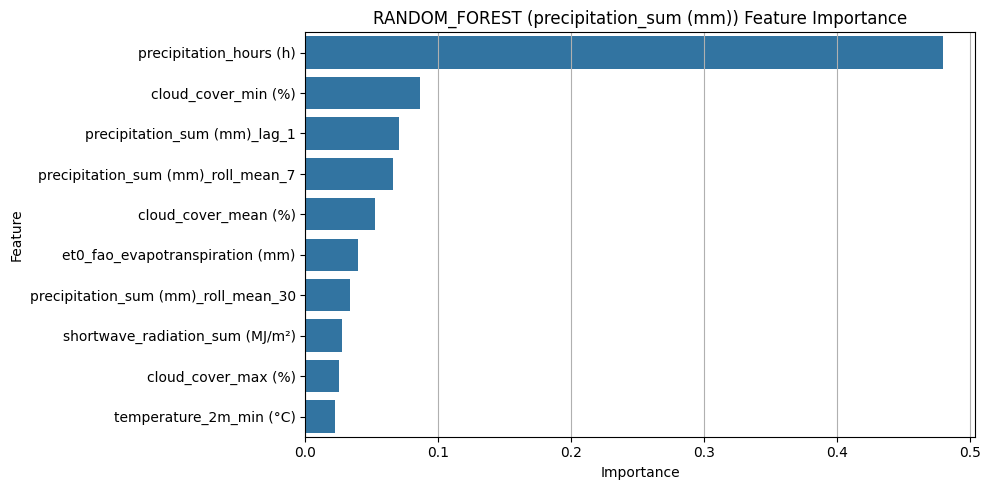


Training XGBOOST...

Confusion Matrix:
 [[749   0   0   0]
 [  0 166  21   0]
 [  0  37  51  10]
 [  0   1  24  38]]

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       749
           1       0.81      0.89      0.85       187
           2       0.53      0.52      0.53        98
           3       0.79      0.60      0.68        63

    accuracy                           0.92      1097
   macro avg       0.78      0.75      0.76      1097
weighted avg       0.91      0.92      0.91      1097



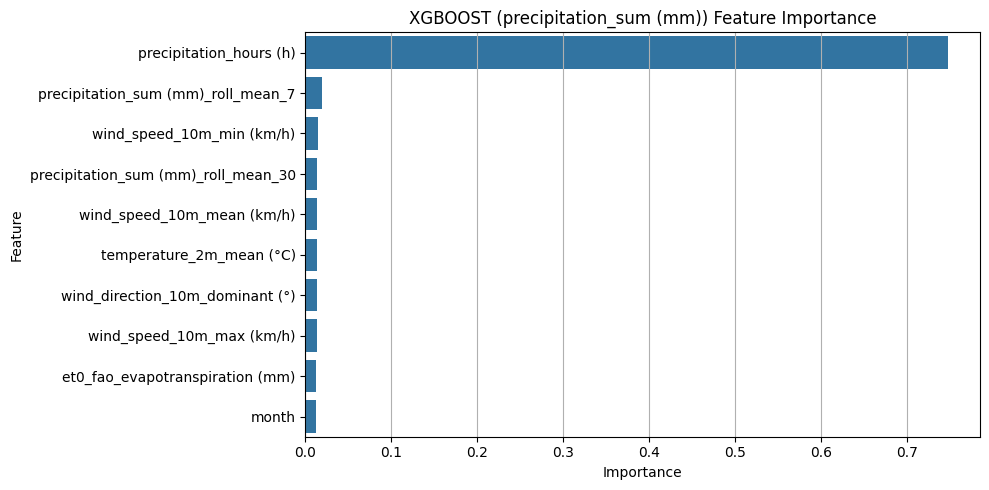


Training LIGHTGBM...

Confusion Matrix:
 [[749   0   0   0]
 [  0 165  21   1]
 [  0  37  54   7]
 [  0   1  31  31]]

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       749
           1       0.81      0.88      0.85       187
           2       0.51      0.55      0.53        98
           3       0.79      0.49      0.61        63

    accuracy                           0.91      1097
   macro avg       0.78      0.73      0.75      1097
weighted avg       0.91      0.91      0.91      1097



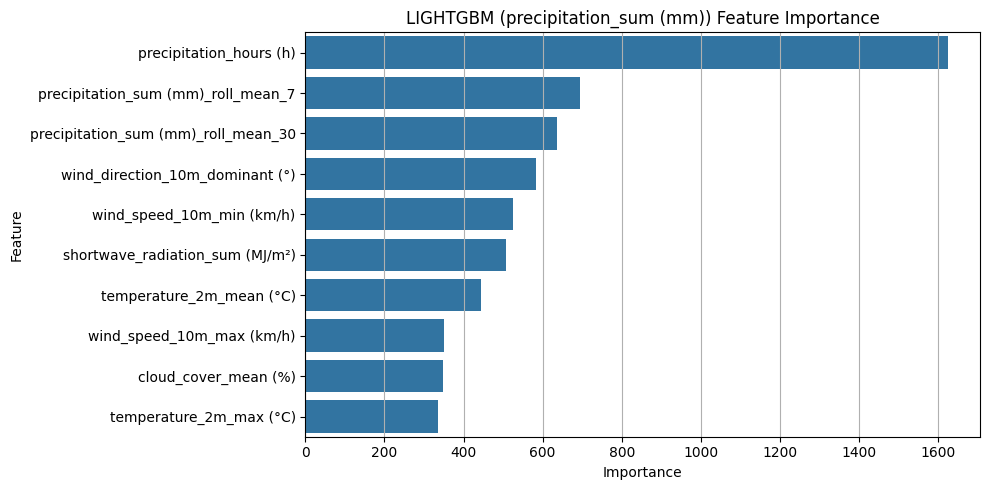


Training BAGGING CLASSIFIER...

Confusion Matrix:
 [[749   0   0   0]
 [  0 169  18   0]
 [  0  35  60   3]
 [  0   2  32  29]]

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       749
           1       0.82      0.90      0.86       187
           2       0.55      0.61      0.58        98
           3       0.91      0.46      0.61        63

    accuracy                           0.92      1097
   macro avg       0.82      0.74      0.76      1097
weighted avg       0.92      0.92      0.92      1097


Training VOTING CLASSIFIER...

Confusion Matrix:
 [[749   0   0   0]
 [  0 168  19   0]
 [  0  36  56   6]
 [  0   2  27  34]]

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       749
           1       0.82      0.90      0.85       187
           2       0.55      0.57      0.56        98
           3       0.85      0.54      0.

In [22]:
def encode_precipitation_category(series):
    conditions = [
        (series == 0),
        (series > 0) & (series <= 2),
        (series > 2) & (series <= 10),
        (series > 10)
    ]
    choices = [0, 1, 2, 3]
    return np.select(conditions, choices)

def evaluate_classifier(y_true, y_pred):
    acc = accuracy_score(y_true, y_pred)
    print("\nConfusion Matrix:\n", confusion_matrix(y_true, y_pred))
    print("\nClassification Report:\n", classification_report(y_true, y_pred))
    return {'Accuracy (%)': round(acc * 100, 2)}

def train_and_evaluate_classifier_with_ensemble(df, target):
    df = df.copy()
    df[target] = encode_precipitation_category(df[target])  # Encode precipitation as class labels
    df_feat = create_features(df, target)
    X_train, X_test, y_train, y_test, test_dates = train_test_split_time_series(df_feat, target)

    model_results = {}
    models = {}
    features = {}

    classifiers = {
        'random_forest': RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42),
        'xgboost': XGBClassifier(n_estimators=100, max_depth=5, use_label_encoder=False, eval_metric='mlogloss', random_state=42),
        'lightgbm': LGBMClassifier(n_estimators=100, max_depth=5, random_state=42)
    }

    # Base model training
    for model_type, clf in classifiers.items():
        print(f"\nTraining {model_type.upper()}...")
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        metrics = evaluate_classifier(y_test, y_pred)
        model_results[model_type] = metrics
        models[model_type] = clf
        features[model_type] = X_train.columns
        plot_feature_importance(clf, X_train.columns, f"{model_type.upper()} ({target})")

    #ENSEMBLES:-
    # Bagging
    print(f"\nTraining BAGGING CLASSIFIER...")
    bagging_clf = BaggingClassifier(estimator=models['random_forest'], n_estimators=10, random_state=42)
    bagging_clf.fit(X_train, y_train)
    y_bag = bagging_clf.predict(X_test)
    bagging_metrics = evaluate_classifier(y_test, y_bag)
    model_results['bagging'] = bagging_metrics

    # Voting
    print(f"\nTraining VOTING CLASSIFIER...")
    voting_clf = VotingClassifier(estimators=[
        ('rf', models['random_forest']),
        ('xgb', models['xgboost']),
        ('lgb', models['lightgbm'])
    ], voting='hard')
    voting_clf.fit(X_train, y_train)
    y_vote = voting_clf.predict(X_test)
    voting_metrics = evaluate_classifier(y_test, y_vote)
    model_results['voting'] = voting_metrics

    # Stacking (Logistic Regression as meta)
    print(f"\nTraining STACKED ENSEMBLE CLASSIFIER...")
    meta_model = LogisticRegression(max_iter=200)
    y_stack_pred = stacking_classifier_predictions(list(models.values()), meta_model, X_train, y_train, X_test)
    stacked_metrics = evaluate_classifier(y_test, y_stack_pred)
    model_results['stacked_ensemble'] = stacked_metrics

    # Final comparison
    print(f"\nClassification Performance Comparison for {target}")
    perf_df = pd.DataFrame(model_results)
    print(perf_df.round(2))


# Stacked ensemble classification 
def stacking_classifier_predictions(models, meta_model, X_train, y_train, X_test):
    # Get predictions from base models
    train_meta_features = np.column_stack([model.predict(X_train) for model in models])
    test_meta_features = np.column_stack([model.predict(X_test) for model in models])

    # Fit the meta-model on training predictions
    meta_model.fit(train_meta_features, y_train)

    # Predict using stacked ensembl
    return meta_model.predict(test_meta_features)

# PIPELINE
filepath = r"C:\\Users\\shiva\\OneDrive\\Desktop\\weather.csv"
df = load_weather_data(filepath)

target = "precipitation_sum (mm)"
print(f"\n{'='*60}")
print(f"Starting CLASSIFICATION with ENSEMBLE for TARGET: {target}")
print(f"{'='*60}")

train_and_evaluate_classifier_with_ensemble(df, target)


# Forecasting using validation_set


Starting processing for TARGET: temperature_2m_max (°C)

Training RANDOM_FOREST for temperature_2m_max (°C)...


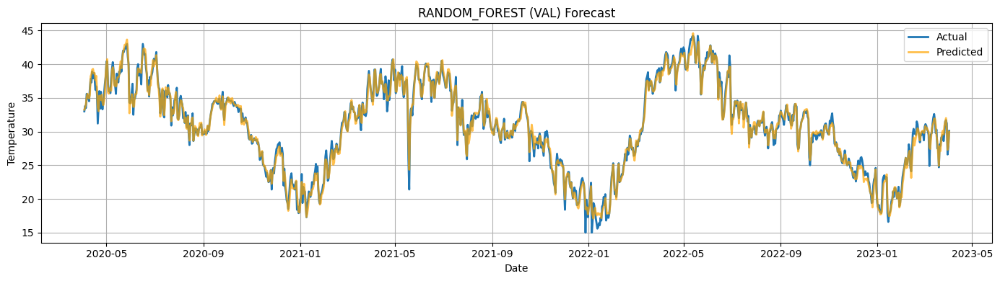

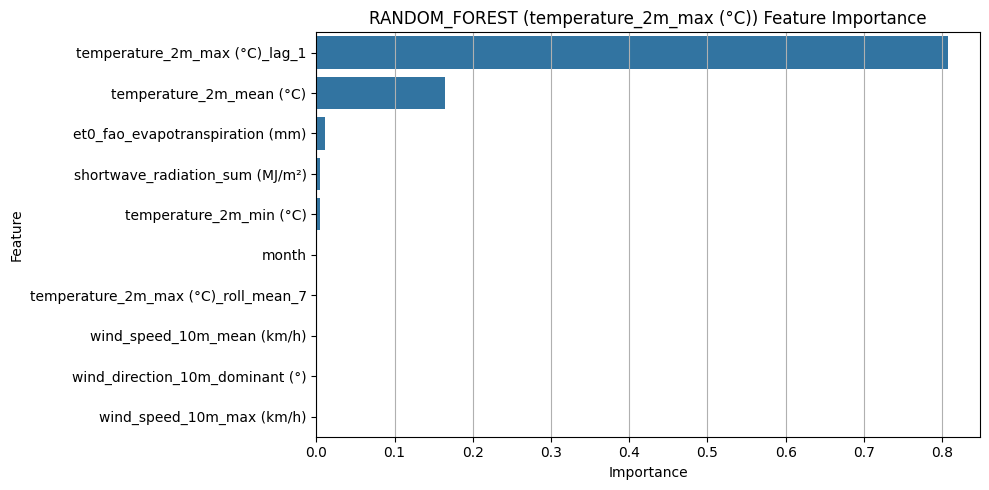


Training XGBOOST for temperature_2m_max (°C)...


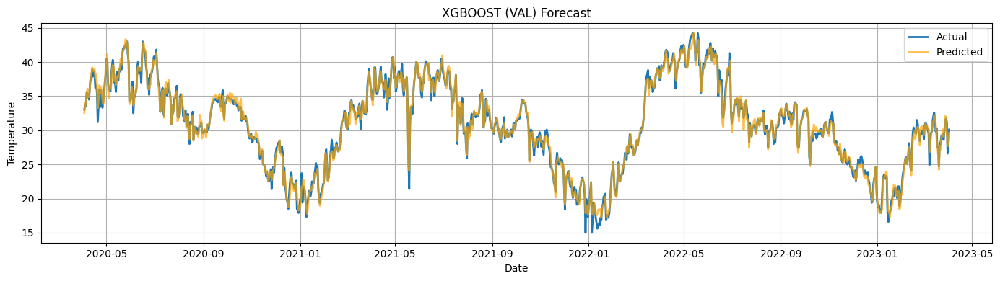

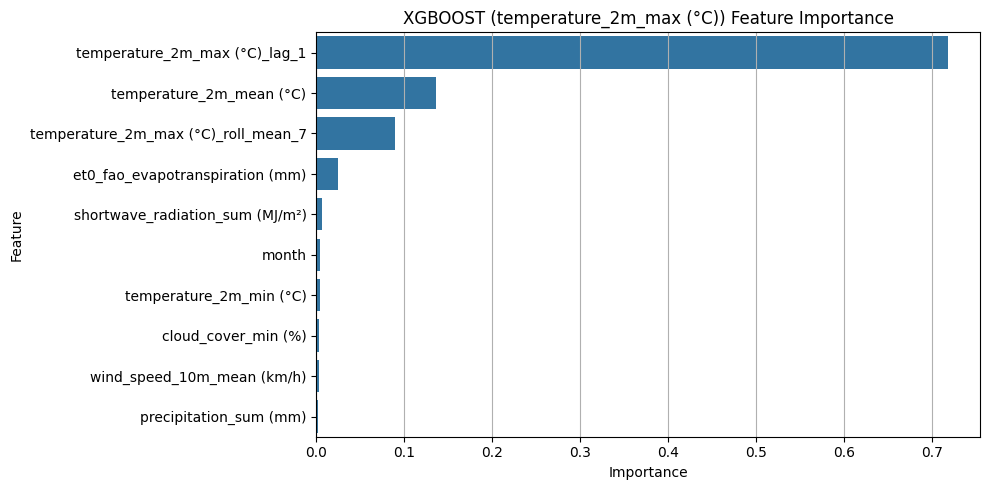


Training LIGHTGBM for temperature_2m_max (°C)...


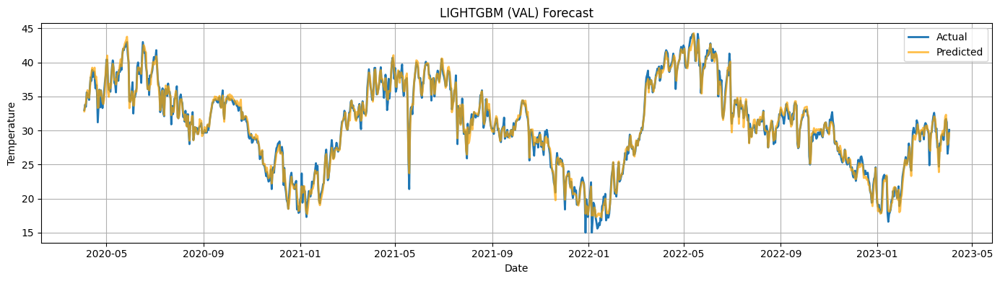

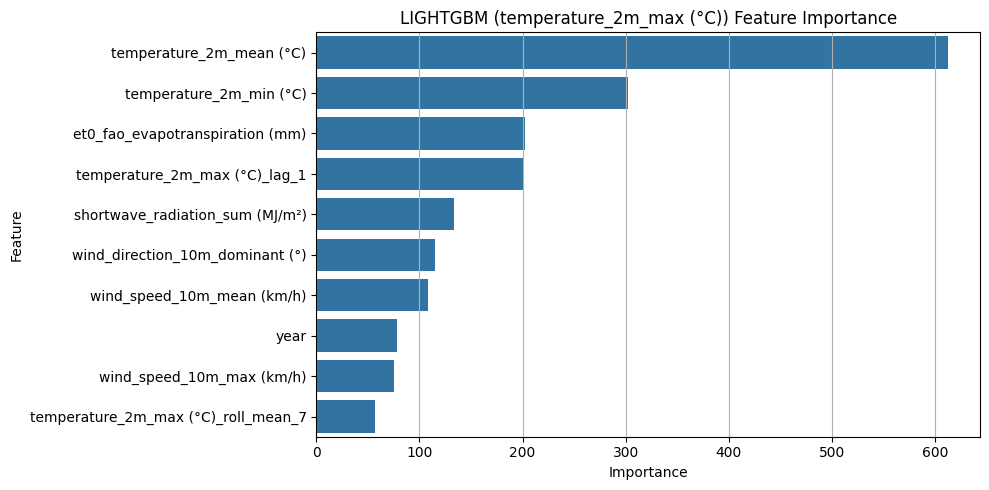

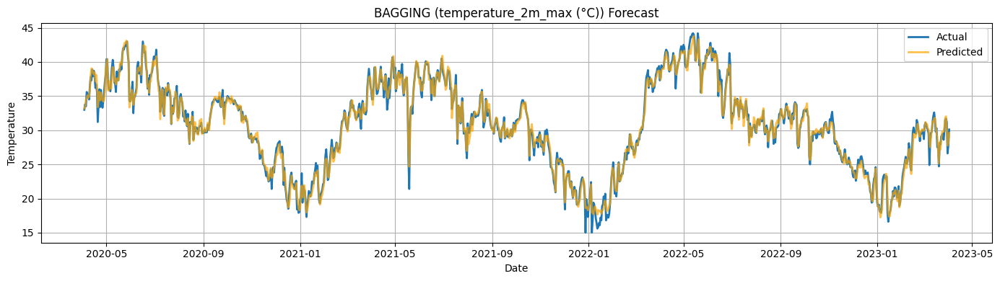

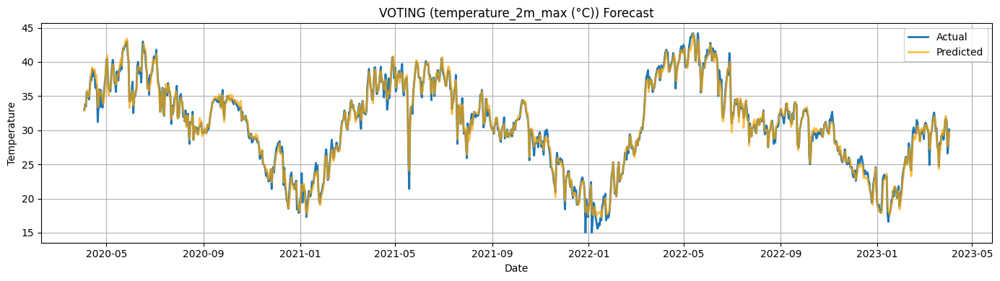


Training STACKED ENSEMBLE for temperature_2m_max (°C)...


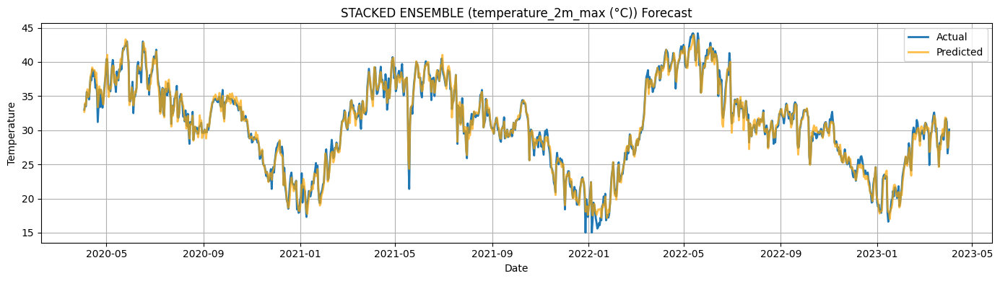


Validation Performance Comparison for temperature_2m_max (°C)
              random_forest  xgboost  lightgbm  bagging  voting  \
RMSE                  0.742    0.698     0.697    0.756   0.677   
MAE                   0.564    0.526     0.537    0.582   0.514   
R²                    0.986    0.988     0.988    0.986   0.989   
Accuracy (%)         98.171   98.294    98.260   98.112  98.333   

              stacked_ensemble  
RMSE                     0.712  
MAE                      0.533  
R²                       0.987  
Accuracy (%)            98.271  

FINAL TEST SET EVALUATION for temperature_2m_max (°C)
RMSE             0.742
MAE              0.571
R²               0.985
Accuracy (%)    98.141
dtype: float64
Bagging test metrics: {'RMSE': 0.7657700037414218, 'MAE': 0.5836849315068494, 'R²': 0.9845027370738088, 'Accuracy (%)': 98.1006615077384}
Voting test metrics: {'RMSE': 0.7005027330980823, 'MAE': 0.5310446469956793, 'R²': 0.9870318516916092, 'Accuracy (%)': 98.27195549396063

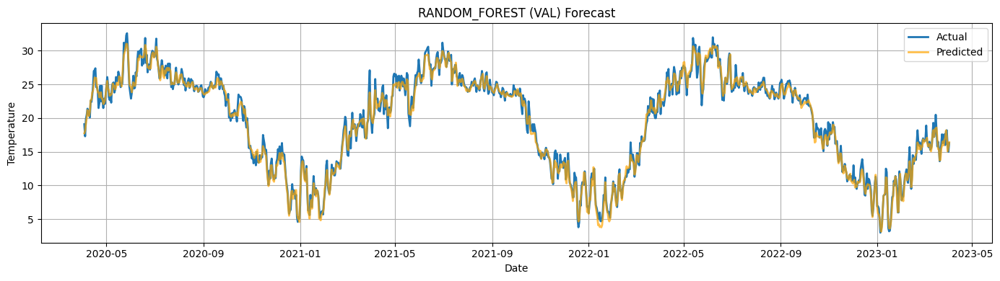

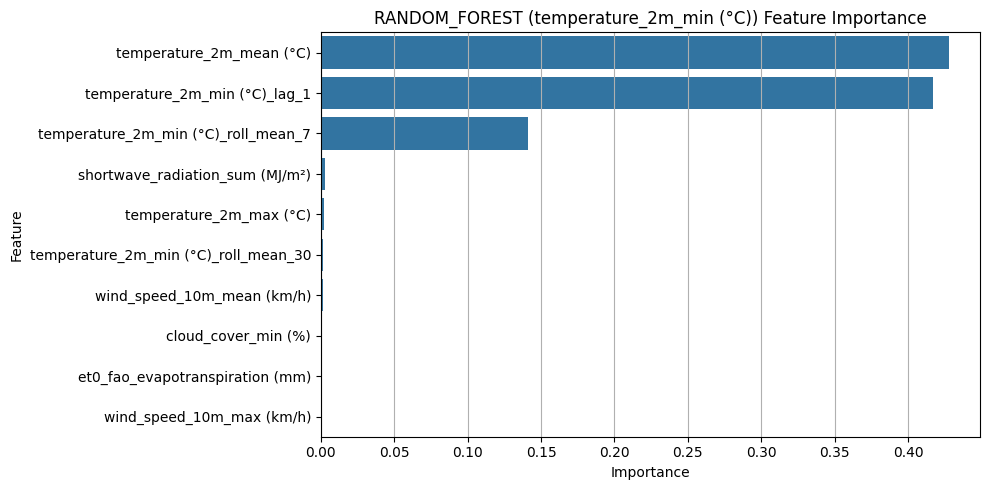


Training XGBOOST for temperature_2m_min (°C)...


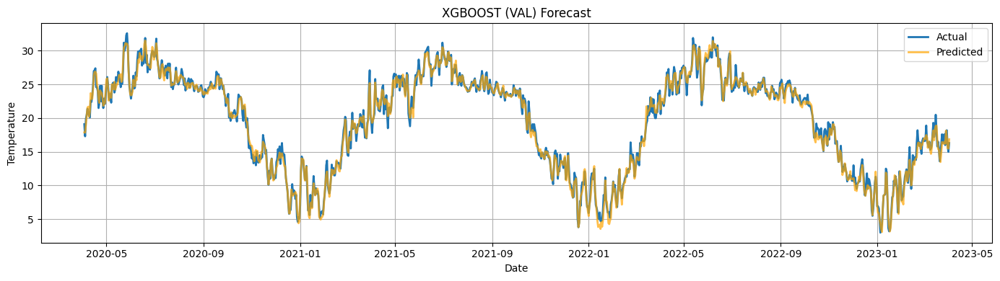

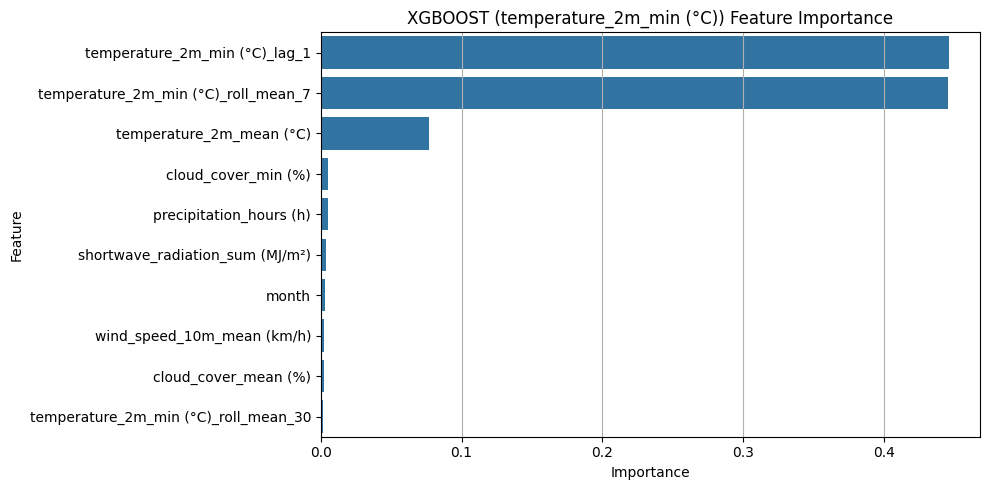


Training LIGHTGBM for temperature_2m_min (°C)...


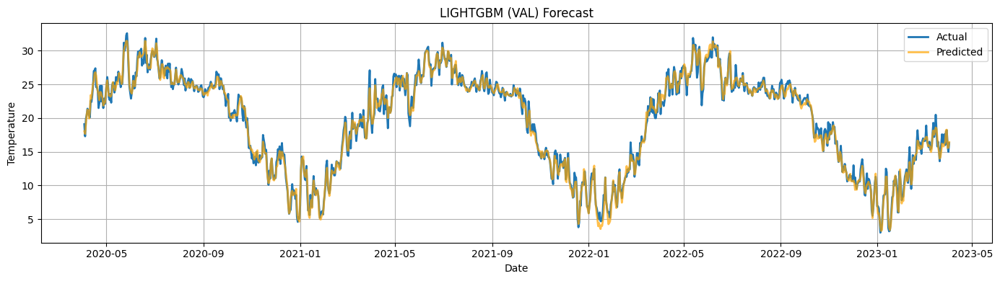

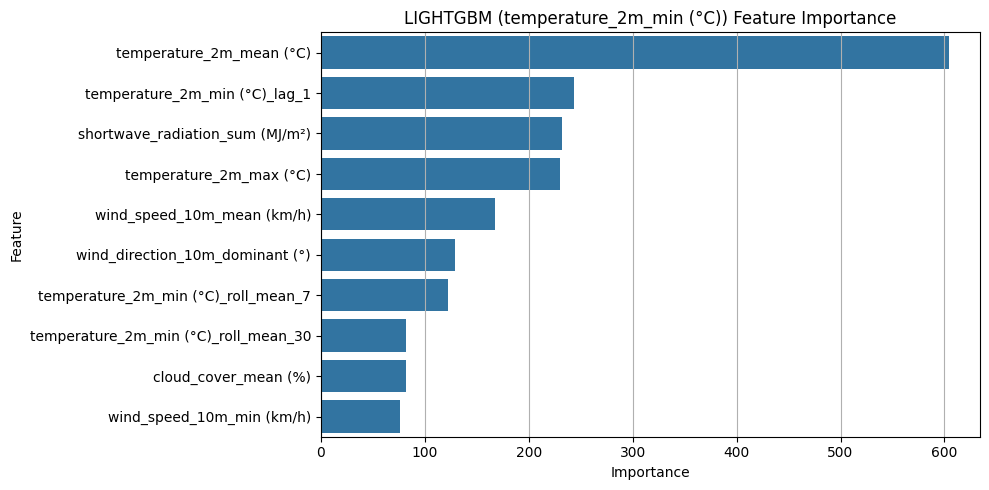

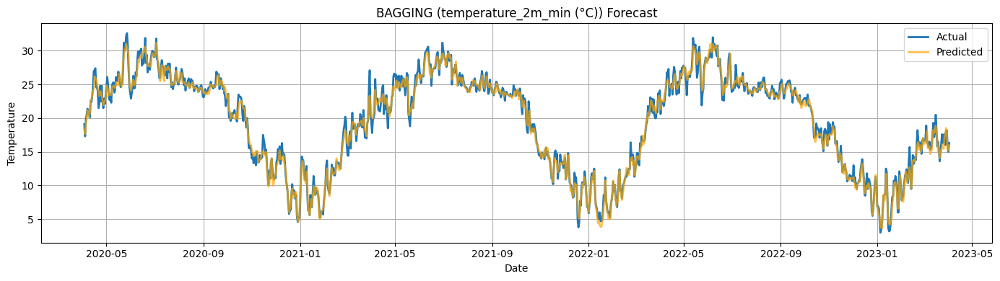

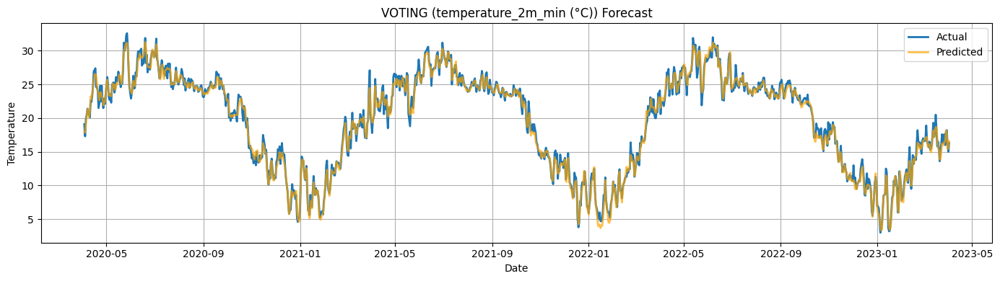


Training STACKED ENSEMBLE for temperature_2m_min (°C)...


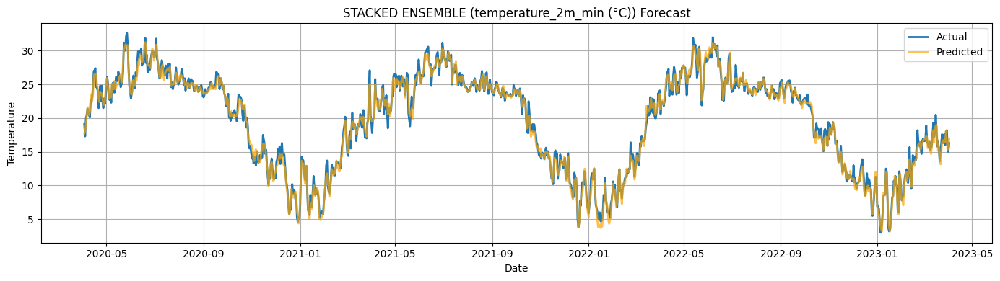


Validation Performance Comparison for temperature_2m_min (°C)
              random_forest  xgboost  lightgbm  bagging  voting  \
RMSE                  0.843    0.778     0.788    0.859   0.773   
MAE                   0.667    0.603     0.613    0.668   0.603   
R²                    0.986    0.988     0.987    0.985   0.988   
Accuracy (%)         96.594   96.922    96.867   96.587  96.921   

              stacked_ensemble  
RMSE                     0.808  
MAE                      0.630  
R²                       0.987  
Accuracy (%)            96.783  

FINAL TEST SET EVALUATION for temperature_2m_min (°C)
RMSE             0.780
MAE              0.604
R²               0.986
Accuracy (%)    96.922
dtype: float64
Bagging test metrics: {'RMSE': 0.8136952746575341, 'MAE': 0.6170410958904109, 'R²': 0.9844413744322627, 'Accuracy (%)': 96.85578668155802}
Voting test metrics: {'RMSE': 0.7311613375763627, 'MAE': 0.5676740523609798, 'R²': 0.9874375577387932, 'Accuracy (%)': 97.1073428854983

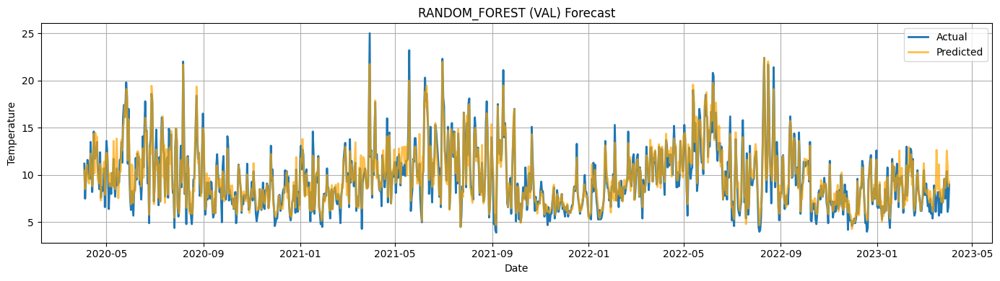

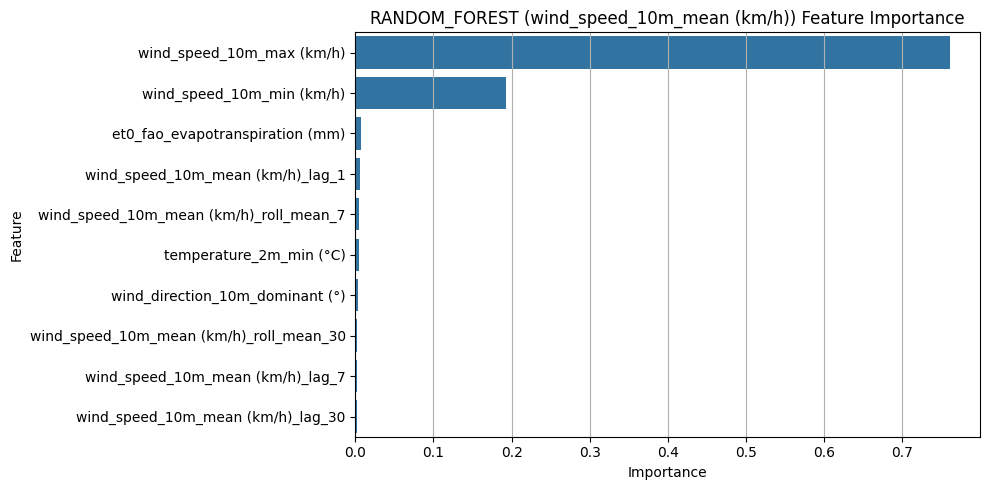


Training XGBOOST for wind_speed_10m_mean (km/h)...


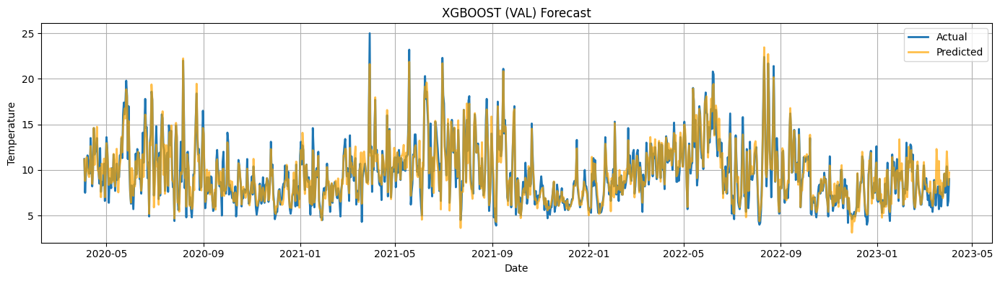

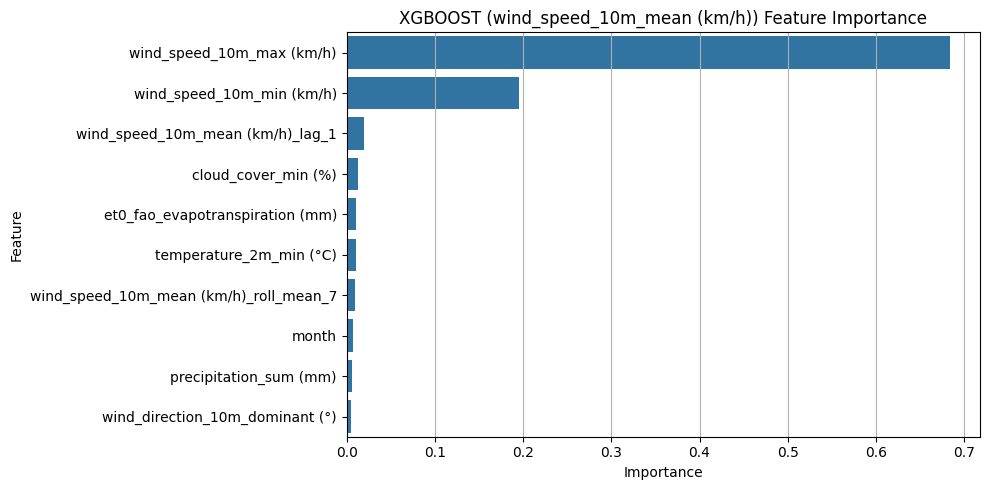


Training LIGHTGBM for wind_speed_10m_mean (km/h)...


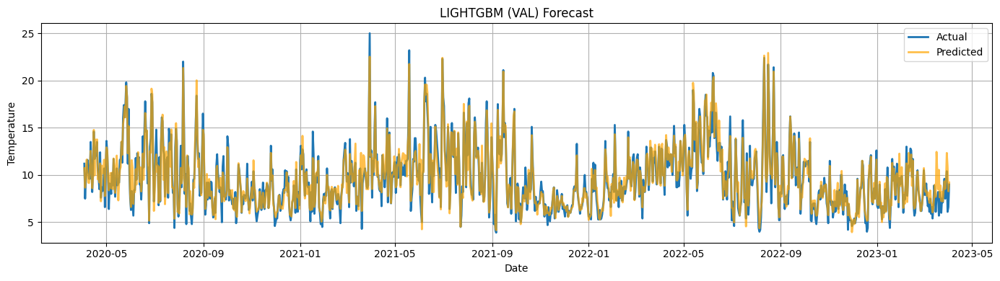

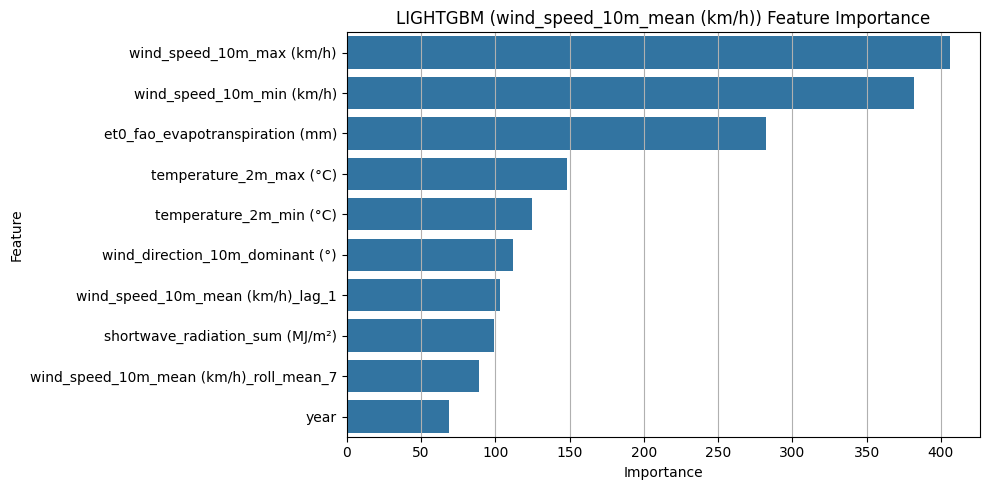

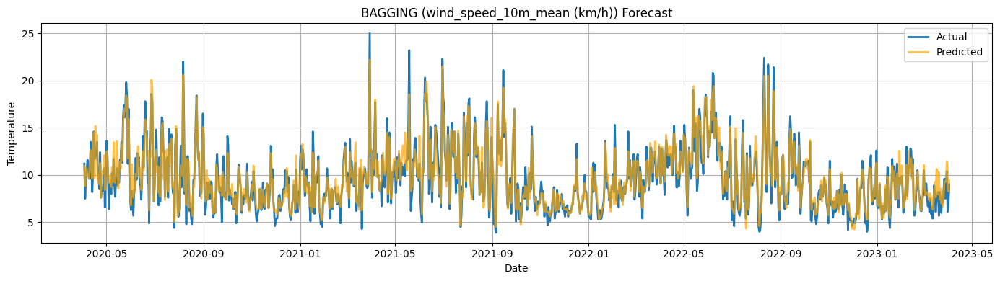

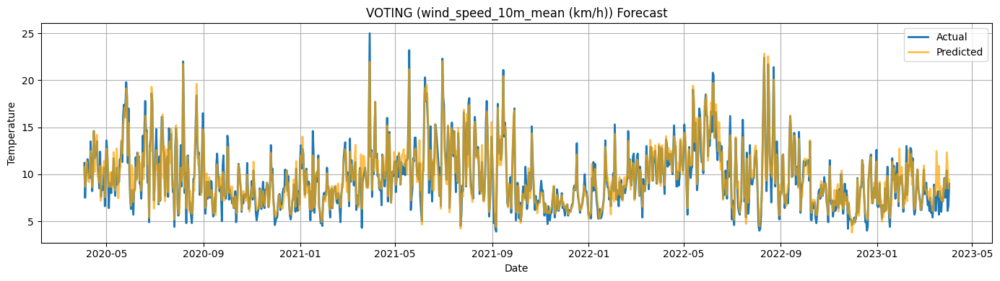


Training STACKED ENSEMBLE for wind_speed_10m_mean (km/h)...


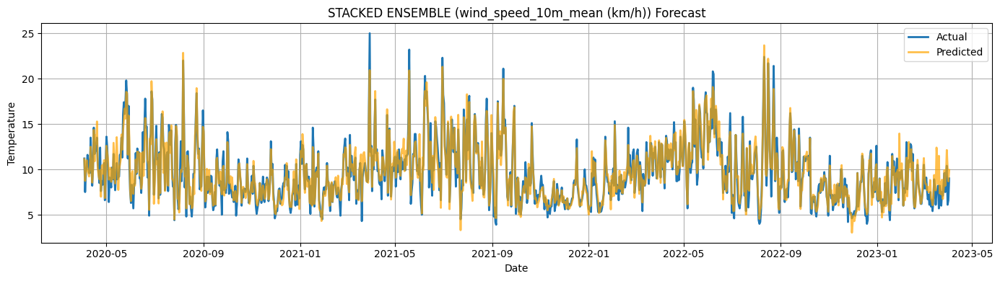


Validation Performance Comparison for wind_speed_10m_mean (km/h)
              random_forest  xgboost  lightgbm  bagging  voting  \
RMSE                  1.037    0.965     0.979    1.074   0.968   
MAE                   0.764    0.716     0.723    0.801   0.717   
R²                    0.901    0.914     0.911    0.894   0.914   
Accuracy (%)         92.060   92.556    92.480   91.675  92.540   

              stacked_ensemble  
RMSE                     1.019  
MAE                      0.757  
R²                       0.904  
Accuracy (%)            92.127  

FINAL TEST SET EVALUATION for wind_speed_10m_mean (km/h)
RMSE             1.021
MAE              0.755
R²               0.913
Accuracy (%)    91.683
dtype: float64
Bagging test metrics: {'RMSE': 1.0901760571652812, 'MAE': 0.808, 'R²': 0.9007385571385458, 'Accuracy (%)': 91.09541062801932}
Voting test metrics: {'RMSE': 1.0016097001104607, 'MAE': 0.729300230472944, 'R²': 0.9162115130319592, 'Accuracy (%)': 91.96272390934105}

Star

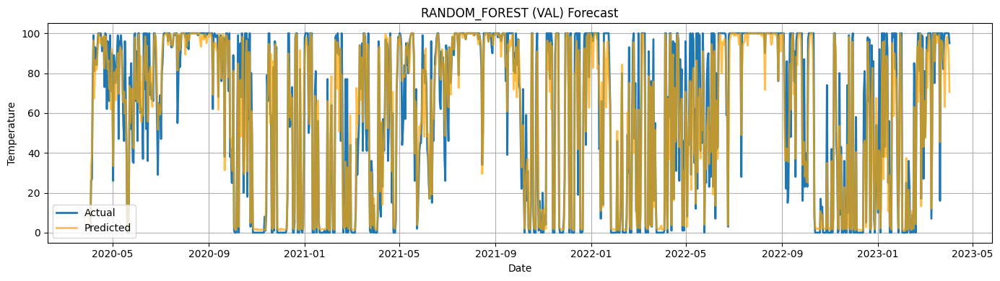

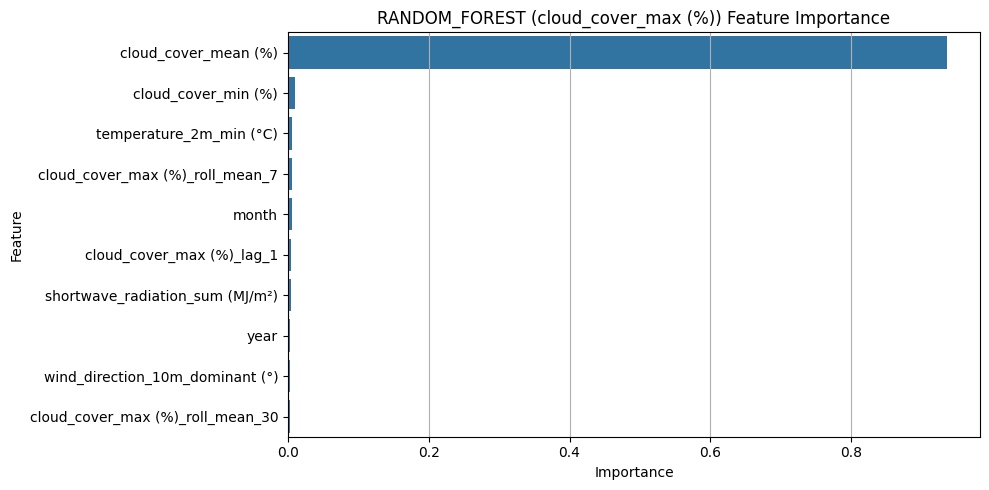


Training XGBOOST for cloud_cover_max (%)...


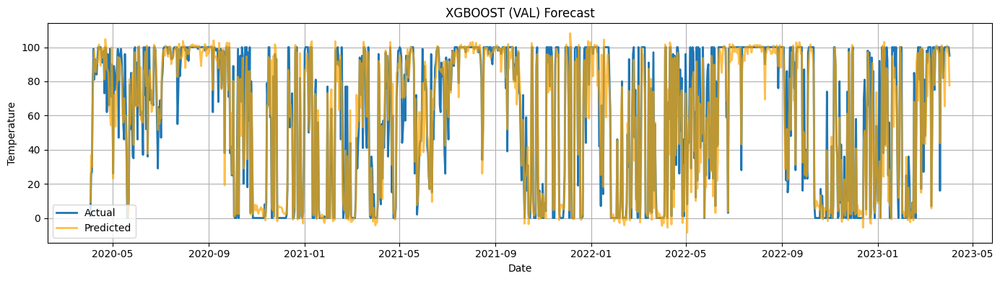

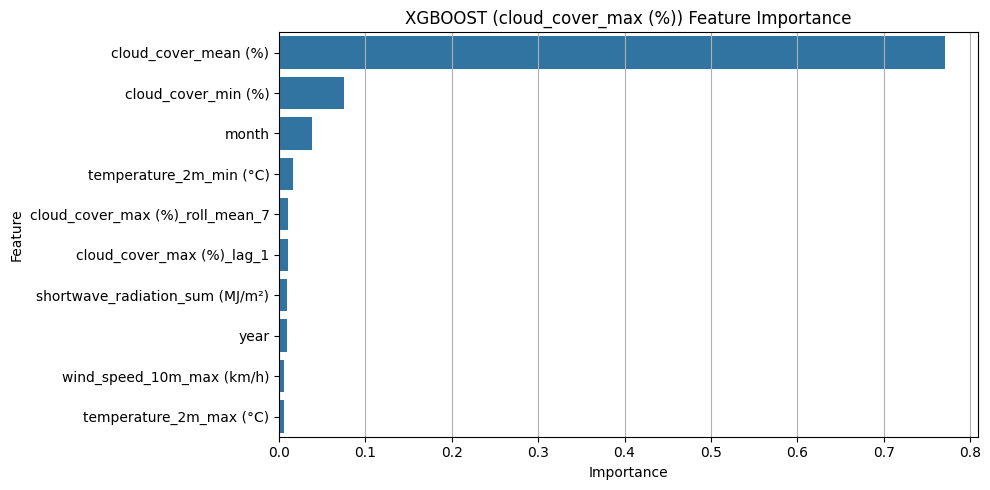


Training LIGHTGBM for cloud_cover_max (%)...


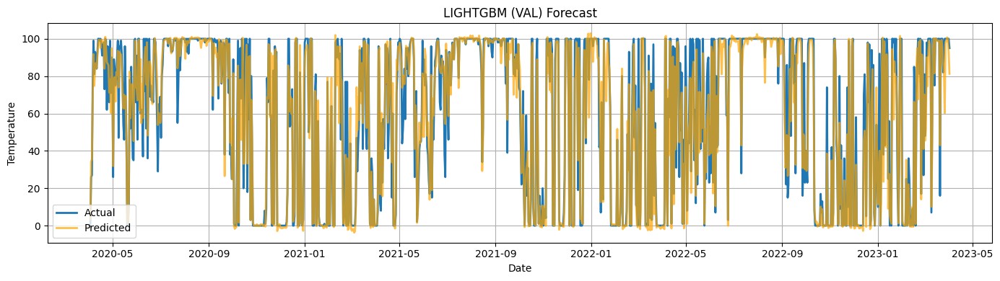

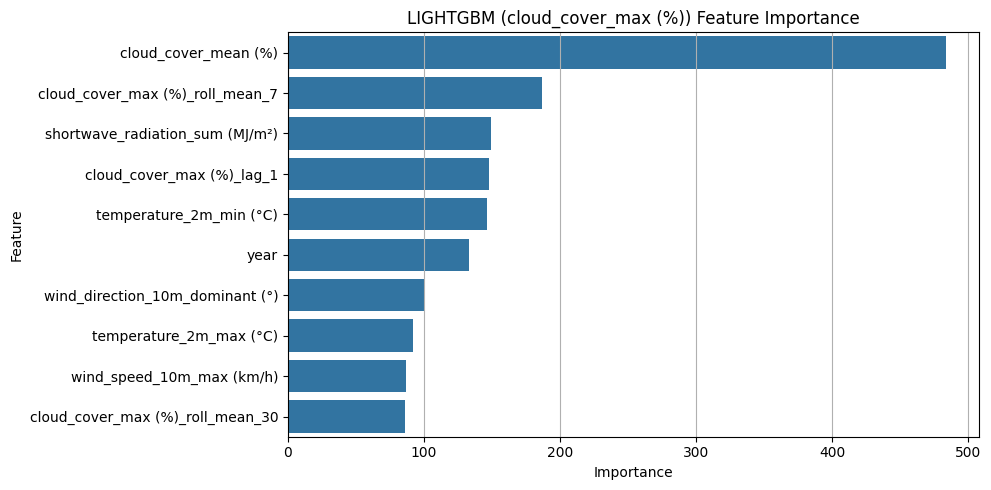

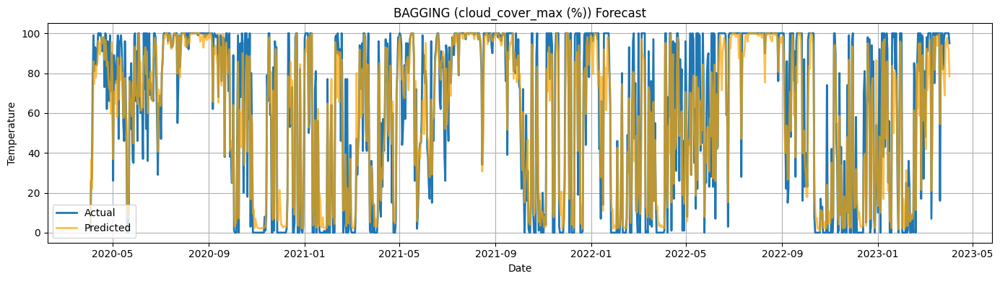

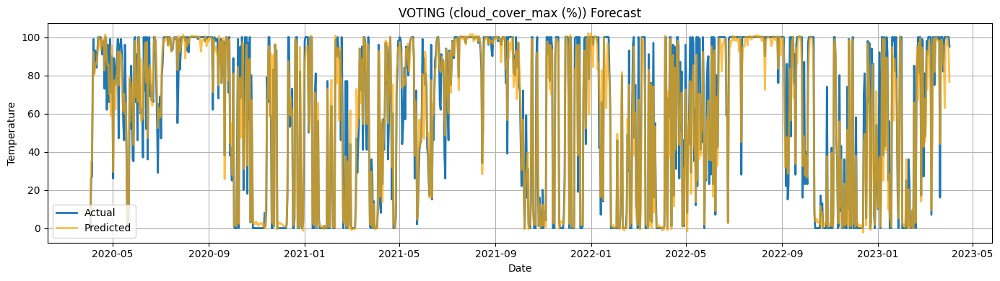


Training STACKED ENSEMBLE for cloud_cover_max (%)...


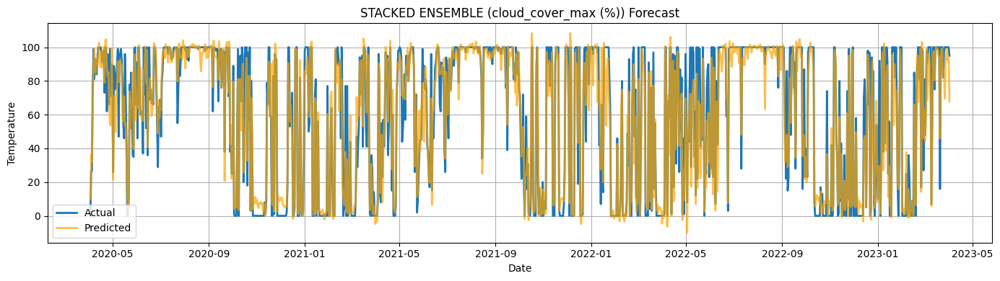


Validation Performance Comparison for cloud_cover_max (%)
              random_forest  xgboost  lightgbm  bagging  voting  \
RMSE                 11.428   11.529    10.975   13.333  11.037   
MAE                   7.064    7.582     6.712    9.286   6.856   
R²                    0.921    0.920     0.927    0.893   0.926   
Accuracy (%)         88.567   87.729    89.137   84.972  88.904   

              stacked_ensemble  
RMSE                    12.395  
MAE                      8.412  
R²                       0.907  
Accuracy (%)            86.385  

FINAL TEST SET EVALUATION for cloud_cover_max (%)
RMSE            12.326
MAE              8.125
R²               0.905
Accuracy (%)    88.131
dtype: float64
Bagging test metrics: {'RMSE': 14.37141092776887, 'MAE': 10.17945205479452, 'R²': 0.8713125744734729, 'Accuracy (%)': 85.12877984350298}
Voting test metrics: {'RMSE': 10.757990037930739, 'MAE': 6.466807217837726, 'R²': 0.9278893229577839, 'Accuracy (%)': 90.55260407648434}

Startin

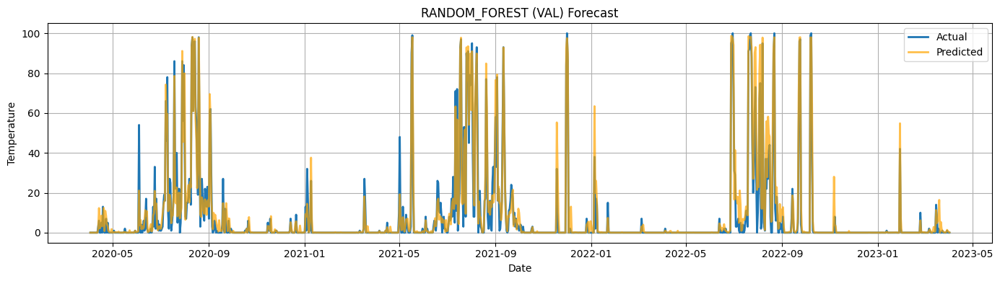

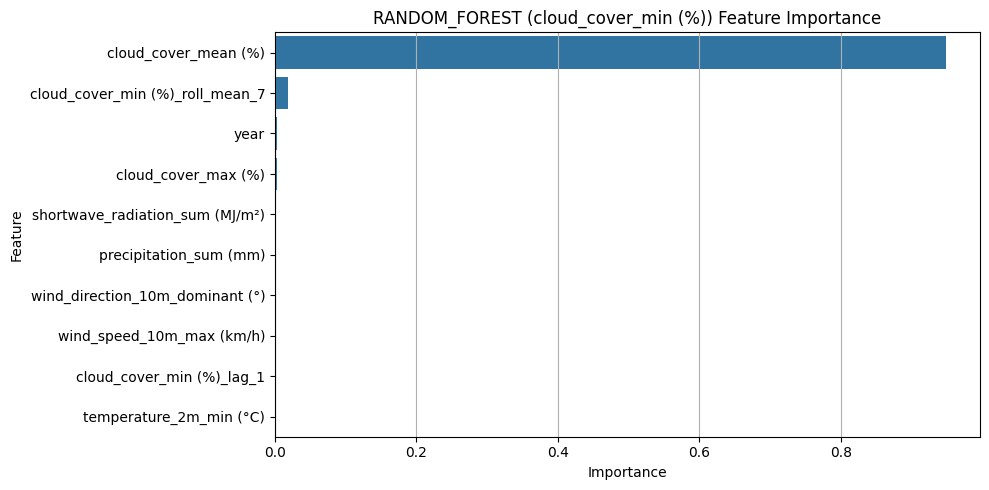


Training XGBOOST for cloud_cover_min (%)...


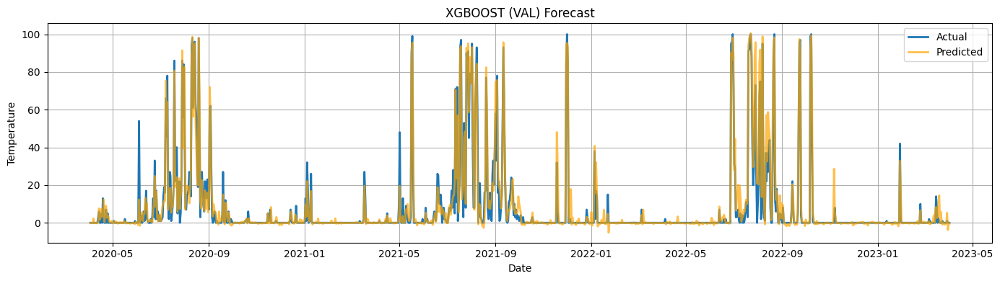

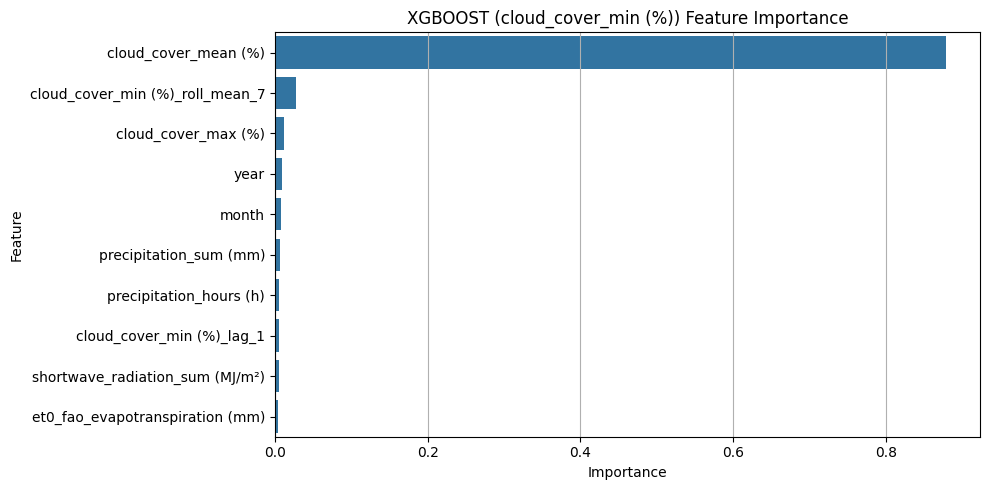


Training LIGHTGBM for cloud_cover_min (%)...


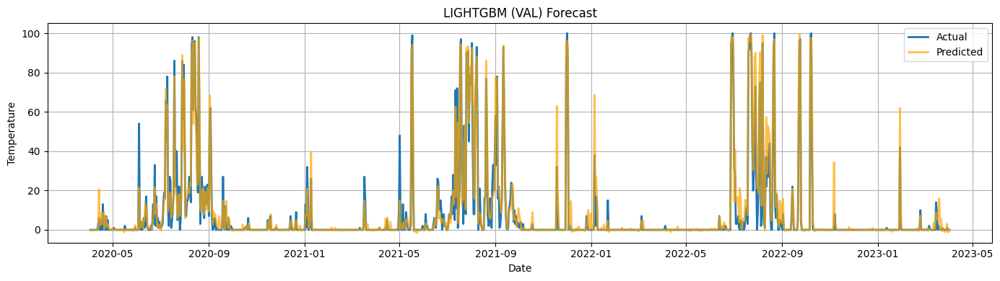

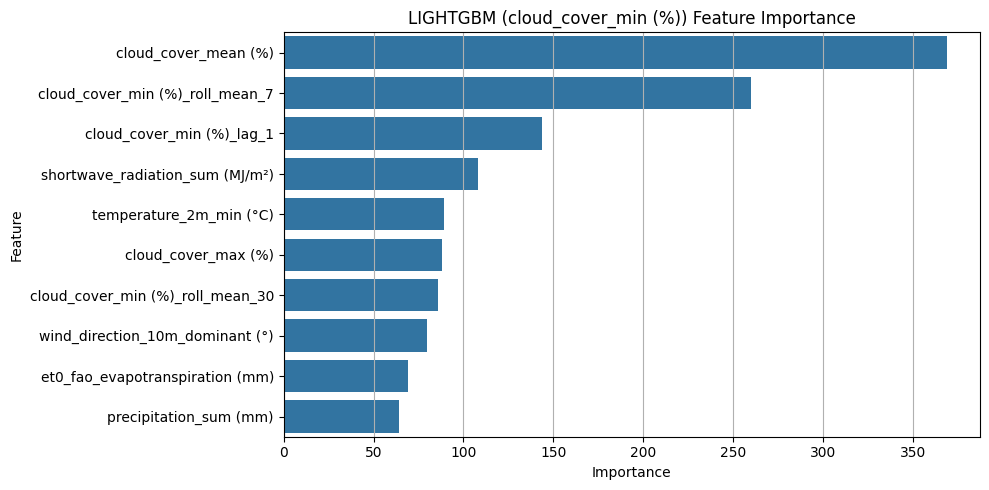

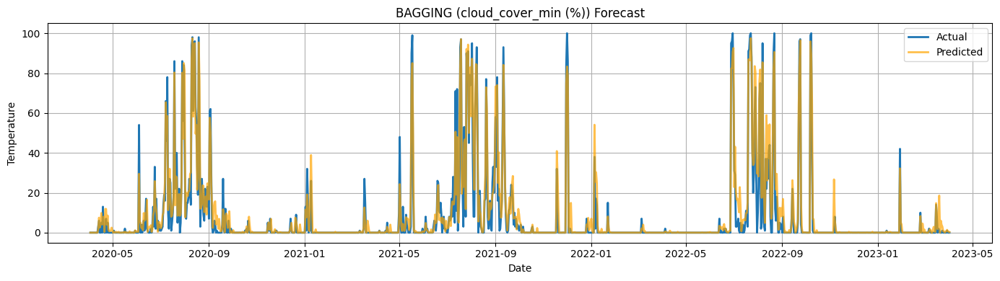

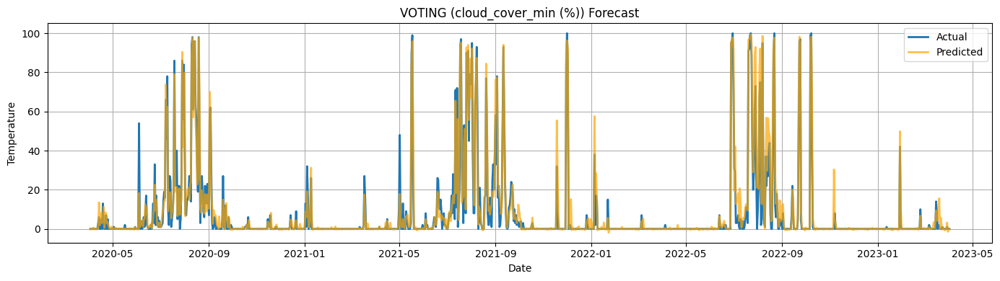


Training STACKED ENSEMBLE for cloud_cover_min (%)...


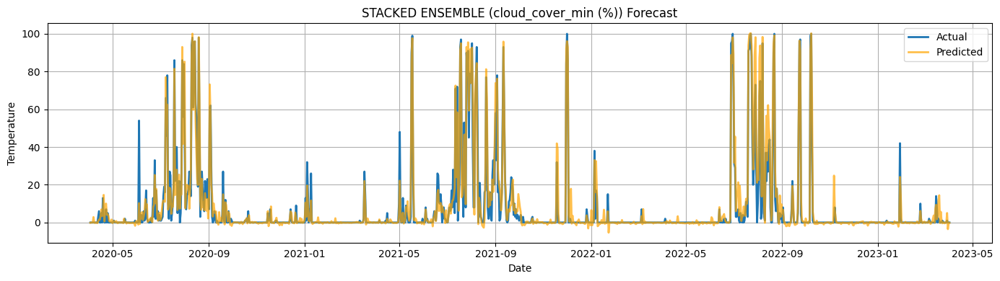


Validation Performance Comparison for cloud_cover_min (%)
              random_forest  xgboost  lightgbm  bagging  voting  \
RMSE                  5.783    5.830     5.858    6.171   5.671   
MAE                   2.534    2.682     2.582    2.902   2.511   
R²                    0.919    0.918     0.917    0.908   0.922   
Accuracy (%)         67.965   66.088    67.362   63.310  68.250   

              stacked_ensemble  
RMSE                     6.014  
MAE                      2.805  
R²                       0.913  
Accuracy (%)            64.532  

FINAL TEST SET EVALUATION for cloud_cover_min (%)
RMSE             7.721
MAE              3.407
R²               0.887
Accuracy (%)    62.688
dtype: float64
Bagging test metrics: {'RMSE': 8.023149724818134, 'MAE': 3.6364383561643834, 'R²': 0.8781123552288674, 'Accuracy (%)': 60.177017701770176}
Voting test metrics: {'RMSE': 7.370215694136373, 'MAE': 3.14639749271196, 'R²': 0.897143844524413, 'Accuracy (%)': 65.54350180498454}

ALL TARG

In [30]:
def load_weather_data(filepath):
    df = pd.read_csv(filepath, index_col=0)
    df.index = pd.to_datetime(df.index, dayfirst=True)
    df = df.asfreq('D')
    df = df.sort_index()
    return df


def create_features(df, target, lags=[1, 7, 30], windows=[7, 30]):
    df_feat = df.copy()
    for lag in lags:
        df_feat[f'{target}_lag_{lag}'] = df_feat[target].shift(lag)
    for win in windows:
        df_feat[f'{target}_roll_mean_{win}'] = df_feat[target].rolling(win).mean()
    df_feat['day'] = df_feat.index.day
    df_feat['month'] = df_feat.index.month
    df_feat['year'] = df_feat.index.year
    return df_feat.dropna()


def split_train_val_test(df, target, years_train=20, years_val=3, years_test=2):
    total_days = (years_train + years_val + years_test) * 365
    df = df.iloc[-total_days:]

    train_days = years_train * 365
    val_days = years_val * 365
    test_days = years_test * 365

    df_train = df.iloc[:train_days]
    df_val = df.iloc[train_days:train_days + val_days]
    df_test = df.iloc[train_days + val_days:]

    X_train = df_train.drop(columns=[target])
    y_train = df_train[target]
    X_val = df_val.drop(columns=[target])
    y_val = df_val[target]
    X_test = df_test.drop(columns=[target])
    y_test = df_test[target]

    return X_train, y_train, X_val, y_val, X_test, y_test, df_test.index


def evaluate_model(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mean_actual = np.mean(y_true)
    return {
        'RMSE': np.sqrt(mean_squared_error(y_true, y_pred)),
        'MAE': mae,
        'R²': r2_score(y_true, y_pred),
        'Accuracy (%)': 100 * (1 - mae / mean_actual)
    }


def plot_predictions(dates, y_true, y_pred, model_name):
    plt.figure(figsize=(14, 4))
    plt.plot(dates, y_true, label='Actual', linewidth=2)
    plt.plot(dates, y_pred, label='Predicted', linewidth=2, color='orange', alpha=0.7)
    plt.title(f'{model_name} Forecast')
    plt.xlabel('Date')
    plt.ylabel('Temperature')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


def plot_feature_importance(model, feature_names, model_name):
    importances = model.feature_importances_
    feat_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
    feat_df = feat_df.sort_values(by='Importance', ascending=False)

    plt.figure(figsize=(10, 5))
    sns.barplot(data=feat_df.head(10), x='Importance', y='Feature')
    plt.title(f'{model_name} Feature Importance')
    plt.tight_layout()
    plt.grid(axis='x')
    plt.show()


def train_and_evaluate(df, target, model_type):
    df_feat = create_features(df, target)
    X_train, y_train, X_val, y_val, X_test, y_test, test_dates = split_train_val_test(df_feat, target)

    if model_type == 'random_forest':
        model = RandomForestRegressor(n_estimators=100, max_depth=10, min_samples_split=5, random_state=42)
    elif model_type == 'xgboost':
        model = XGBRegressor(n_estimators=100, max_depth=5, alpha=0.1, lambda_=0.5, gamma=0.1, random_state=42)
    elif model_type == 'lightgbm':
        model = LGBMRegressor(n_estimators=100, max_depth=5, lambda_l1=0.1, lambda_l2=0.5, random_state=42, verbose=-1)
    else:
        raise ValueError("Invalid model type")

    model.fit(X_train, y_train)
    y_val_pred = model.predict(X_val)
    val_metrics = evaluate_model(y_val, y_val_pred)
    plot_predictions(y_val.index, y_val, y_val_pred, f'{model_type.upper()} (VAL)')
    return model, val_metrics, X_train.columns, (X_train, y_train, X_val, y_val, X_test, y_test, test_dates)


def stacking_predictions(models, meta_model, X_train, y_train, X_val, y_val, X_test):
    train_meta = np.column_stack([model.predict(X_train) for model in models])
    val_meta = np.column_stack([model.predict(X_val) for model in models])
    test_meta = np.column_stack([model.predict(X_test) for model in models])

    meta_model.fit(train_meta, y_train)
    return meta_model.predict(val_meta), meta_model.predict(test_meta)


# PIPELINE

target_columns = [
    "temperature_2m_max (°C)",
    "temperature_2m_min (°C)",
    "wind_speed_10m_mean (km/h)",
    "cloud_cover_max (%)",
    "cloud_cover_min (%)"
]

filepath = r"C:\\Users\\shiva\\OneDrive\\Desktop\\weather.csv"
df = load_weather_data(filepath)

all_results = {}

for target in target_columns:
    print(f"\n{'='*60}")
    print(f"Starting processing for TARGET: {target}")
    print(f"{'='*60}")

    model_results = {}
    models = {}
    features = {}

    for model_type in ['random_forest', 'xgboost', 'lightgbm']:
        print(f"\nTraining {model_type.upper()} for {target}...")
        model, val_metrics, feature_names, data_split = train_and_evaluate(df, target, model_type)
        model_results[model_type] = val_metrics
        models[model_type] = model
        features[model_type] = feature_names
        plot_feature_importance(model, feature_names, f"{model_type.upper()} ({target})")

    X_train, y_train, X_val, y_val, X_test, y_test, test_dates = data_split

    # Bagging Ensemble
    bagging_model = BaggingRegressor(
        estimator=DecisionTreeRegressor(random_state=42),
        n_estimators=10,
        max_samples=0.8,
        max_features=0.8,
        random_state=42,
        n_jobs=-1
    )
    bagging_model.fit(X_train, y_train)
    y_val_bag = bagging_model.predict(X_val)
    model_results['bagging'] = evaluate_model(y_val, y_val_bag)
    plot_predictions(y_val.index, y_val, y_val_bag, f'BAGGING ({target})')

    # Voting Ensemble
    voting_model = VotingRegressor(
        estimators=[
            ('rf', models['random_forest']),
            ('xgb', models['xgboost']),
            ('lgb', models['lightgbm'])
        ],
        n_jobs=-1
    )
    voting_model.fit(X_train, y_train)
    y_val_vote = voting_model.predict(X_val)
    model_results['voting'] = evaluate_model(y_val, y_val_vote)
    plot_predictions(y_val.index, y_val, y_val_vote, f'VOTING ({target})')

    # Stacked Ensemble
    print(f"\nTraining STACKED ENSEMBLE for {target}...")
    meta_model = Ridge(alpha=1.0)
    y_val_stack, y_test_stack = stacking_predictions(
        list(models.values()), meta_model, X_train, y_train, X_val, y_val, X_test
    )
    model_results['stacked_ensemble'] = evaluate_model(y_val, y_val_stack)
    plot_predictions(y_val.index, y_val, y_val_stack, f'STACKED ENSEMBLE ({target})')

    print(f"\nValidation Performance Comparison for {target}")
    perf_df = pd.DataFrame(model_results)
    print(perf_df.round(3))
    all_results[target] = perf_df.round(3)

    print(f"\nFINAL TEST SET EVALUATION for {target}")
    final_metrics = evaluate_model(y_test, y_test_stack)
    print(pd.Series(final_metrics).round(3))
    print("Bagging test metrics:", evaluate_model(y_test, bagging_model.predict(X_test)))
    print("Voting test metrics:", evaluate_model(y_test, voting_model.predict(X_test)))

print(f"\n{'='*60}")
print("ALL TARGETS COMPLETED")
print(f"{'='*60}")

for target, perf_df in all_results.items():
    print(f"\nValidation Results for {target}")
    print(perf_df)


# Validation and cross-validation


🏁 Starting processing for TARGET: temperature_2m_mean (°C)

🔧 Training RANDOM_FOREST for temperature_2m_mean (°C) with CV...
Fitting 5 folds for each of 27 candidates, totalling 135 fits


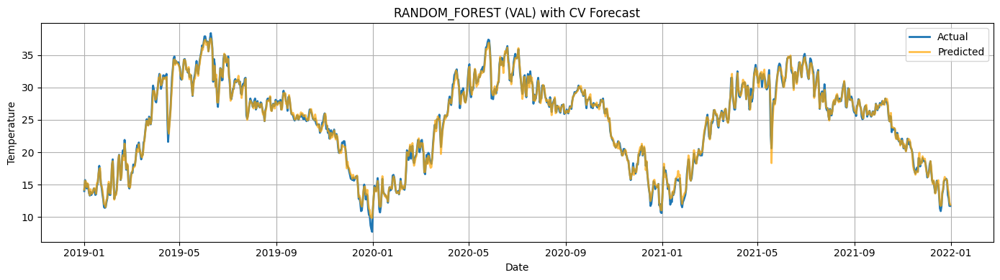

Test Metrics for RANDOM_FOREST (CV):
RMSE             0.430
MAE              0.321
R²               0.996
Accuracy (%)    98.679
dtype: float64


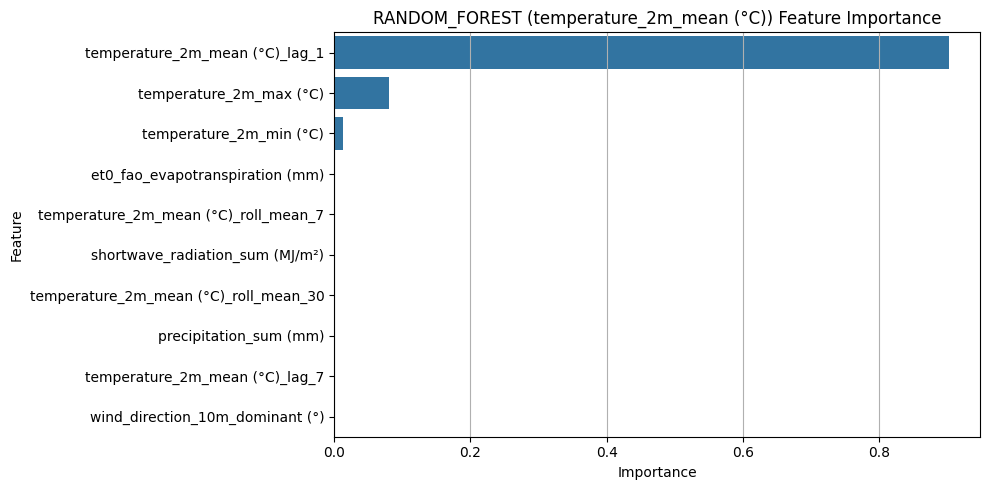


🔧 Training XGBOOST for temperature_2m_mean (°C) with CV...
Fitting 5 folds for each of 243 candidates, totalling 1215 fits


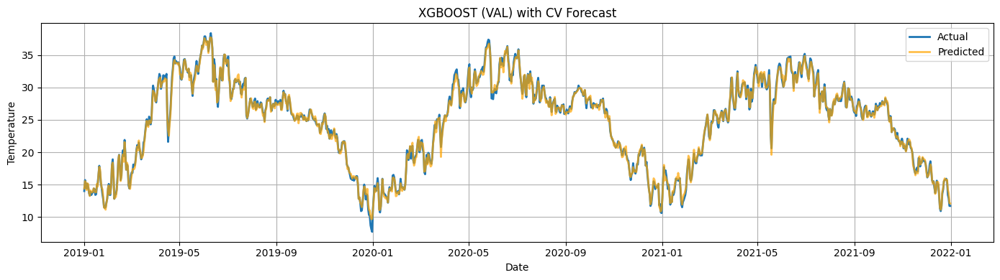

Test Metrics for XGBOOST (CV):
RMSE             0.416
MAE              0.319
R²               0.996
Accuracy (%)    98.688
dtype: float64


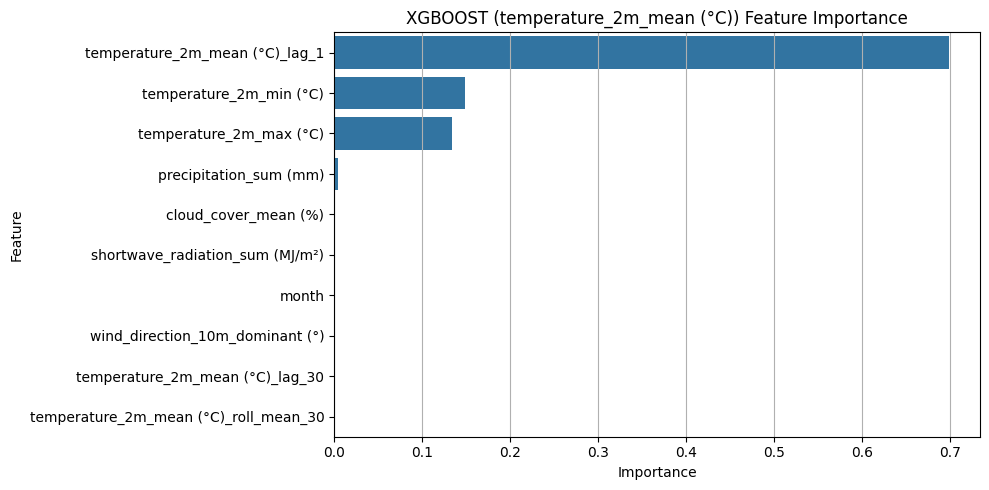


🔧 Training LIGHTGBM for temperature_2m_mean (°C) with CV...
Fitting 5 folds for each of 81 candidates, totalling 405 fits
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3605
[LightGBM] [Info] Number of data points in the train set: 6910, number of used features: 21
[LightGBM] [Info] Start training from score 25.030883
[LightGBM] [Warning] No further splits wi

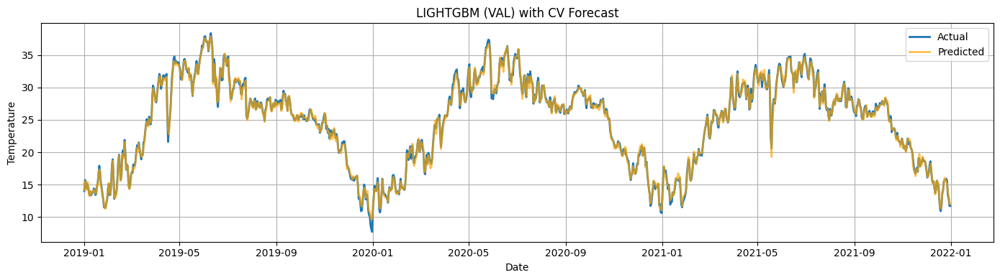

[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
Test Metrics for LIGHTGBM (CV):
RMSE             0.388
MAE              0.294
R²               0.997
Accuracy (%)    98.792
dtype: float64


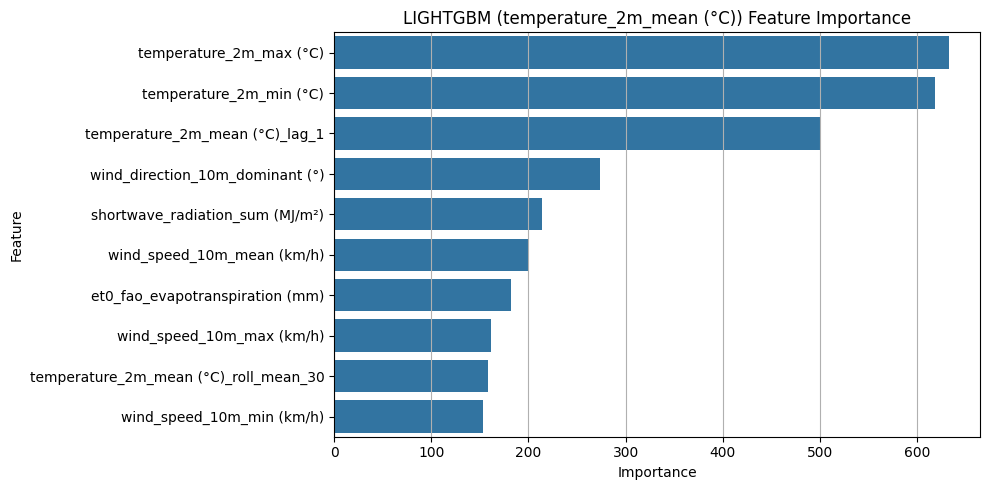


🔁 Training STACKED ENSEMBLE for temperature_2m_mean (°C) with CV...
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1


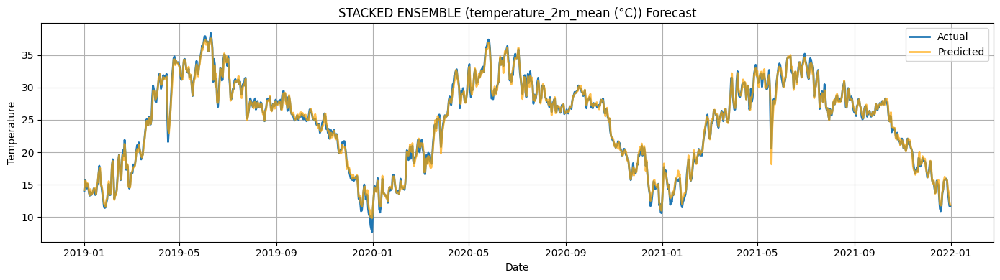


📊 Validation Performance Comparison for temperature_2m_mean (°C)
              random_forest  xgboost  lightgbm  stacked_ensemble
RMSE                  0.474    0.443     0.423             0.491
MAE                   0.352    0.345     0.330             0.361
R²                    0.995    0.996     0.996             0.995
Accuracy (%)         98.572   98.600    98.659            98.534

🧪 FINAL TEST SET EVALUATION for temperature_2m_mean (°C)
RMSE             0.443
MAE              0.331
R²               0.996
Accuracy (%)    98.637
dtype: float64

🏁 Starting processing for TARGET: wind_speed_10m_mean (km/h)

🔧 Training RANDOM_FOREST for wind_speed_10m_mean (km/h) with CV...
Fitting 5 folds for each of 27 candidates, totalling 135 fits


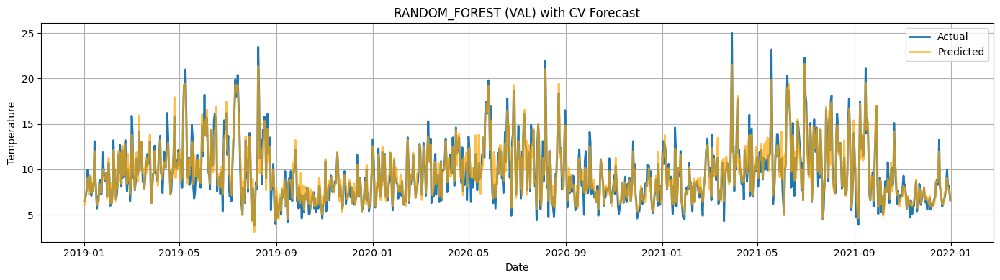

Test Metrics for RANDOM_FOREST (CV):
RMSE             1.057
MAE              0.777
R²               0.902
Accuracy (%)    91.577
dtype: float64


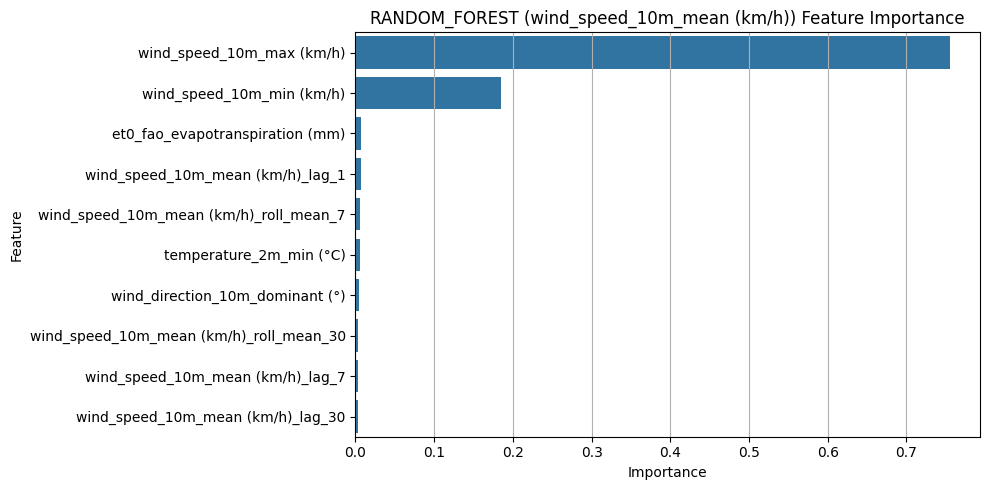


🔧 Training XGBOOST for wind_speed_10m_mean (km/h) with CV...
Fitting 5 folds for each of 243 candidates, totalling 1215 fits


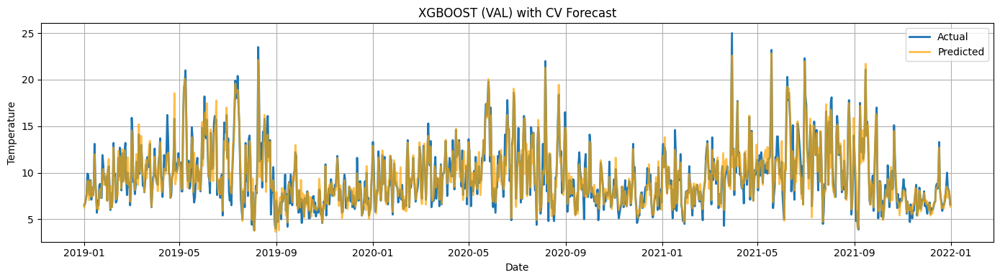

Test Metrics for XGBOOST (CV):
RMSE             0.987
MAE              0.725
R²               0.914
Accuracy (%)    92.142
dtype: float64


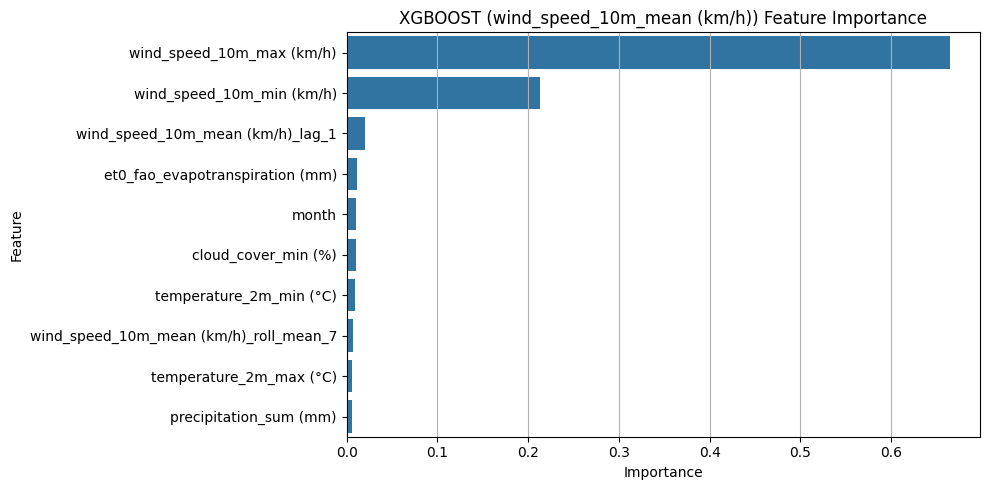


🔧 Training LIGHTGBM for wind_speed_10m_mean (km/h) with CV...
Fitting 5 folds for each of 81 candidates, totalling 405 fits
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Warning] lambda_l2 is set=0.3, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Warning] lambda_l2 is set=0.3, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3489
[LightGBM] [Info] Number of data points in the train set: 6910, number of used features: 21
[LightGBM] [Info] Start training from score 9.604935
[LightGBM] [Warning] No further splits w

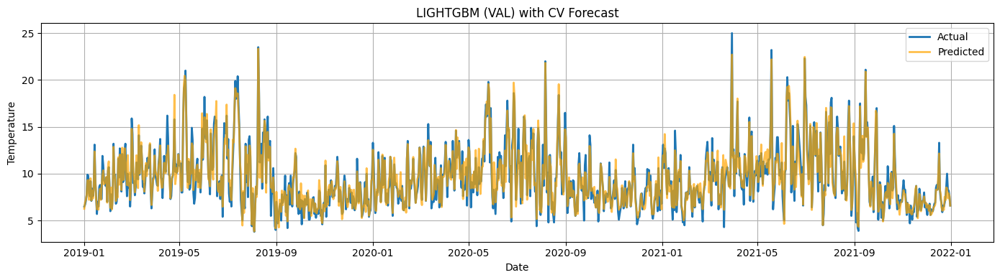

[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Warning] lambda_l2 is set=0.3, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3
Test Metrics for LIGHTGBM (CV):
RMSE             0.979
MAE              0.711
R²               0.916
Accuracy (%)    92.293
dtype: float64


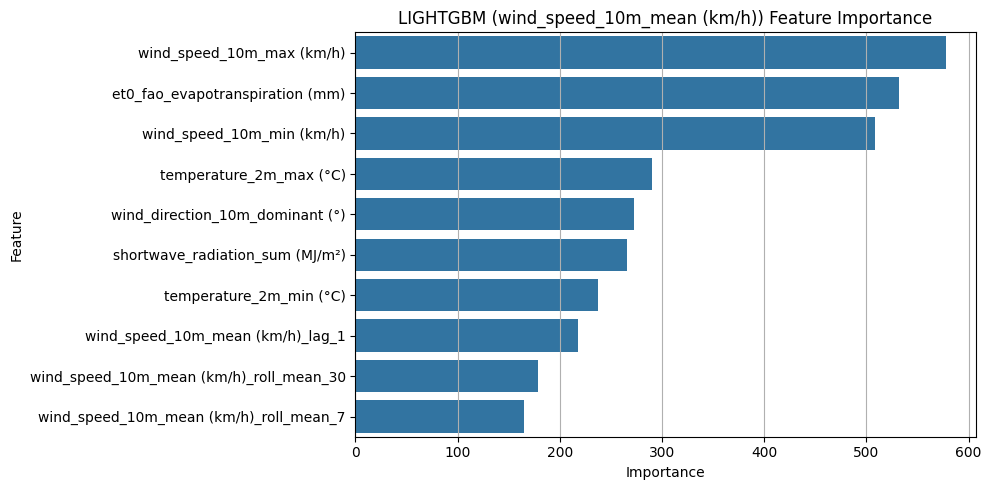


🔁 Training STACKED ENSEMBLE for wind_speed_10m_mean (km/h) with CV...
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Warning] lambda_l2 is set=0.3, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Warning] lambda_l2 is set=0.3, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Warning] lambda_l2 is set=0.3, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3


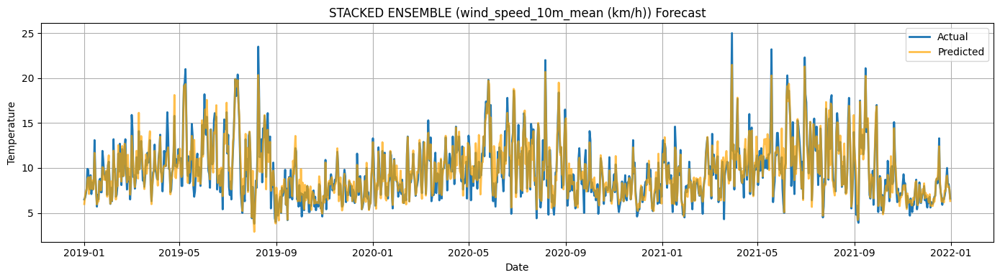


📊 Validation Performance Comparison for wind_speed_10m_mean (km/h)
              random_forest  xgboost  lightgbm  stacked_ensemble
RMSE                  1.000    0.967     0.915             1.059
MAE                   0.730    0.710     0.683             0.766
R²                    0.905    0.911     0.920             0.893
Accuracy (%)         92.390   92.594    92.877            92.015

🧪 FINAL TEST SET EVALUATION for wind_speed_10m_mean (km/h)
RMSE             1.086
MAE              0.799
R²               0.896
Accuracy (%)    91.342
dtype: float64

🏁 Starting processing for TARGET: cloud_cover_max (%)

🔧 Training RANDOM_FOREST for cloud_cover_max (%) with CV...
Fitting 5 folds for each of 27 candidates, totalling 135 fits


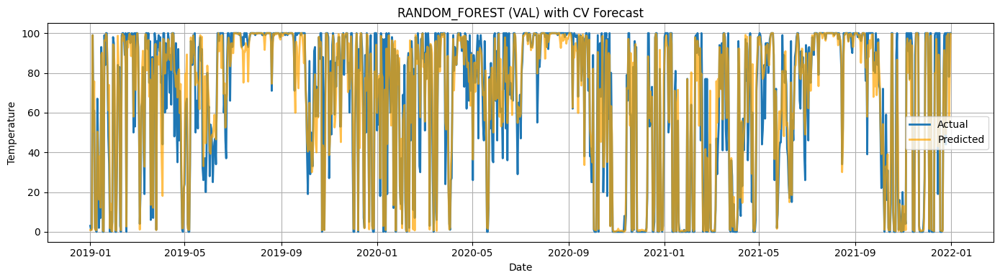

Test Metrics for RANDOM_FOREST (CV):
RMSE            11.672
MAE              7.143
R²               0.920
Accuracy (%)    88.971
dtype: float64


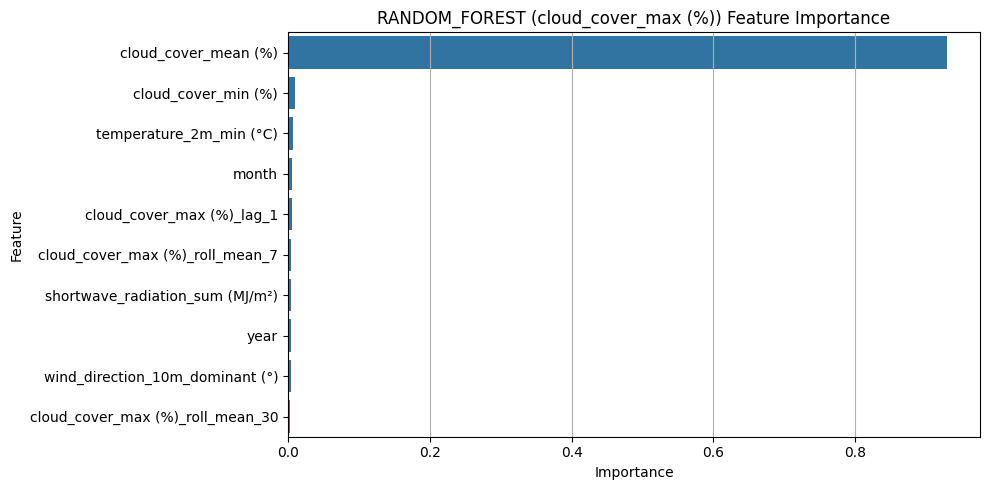


🔧 Training XGBOOST for cloud_cover_max (%) with CV...
Fitting 5 folds for each of 243 candidates, totalling 1215 fits


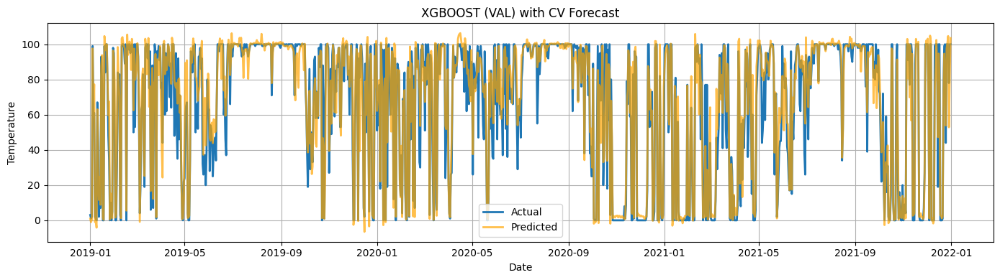

Test Metrics for XGBOOST (CV):
RMSE            11.161
MAE              7.033
R²               0.927
Accuracy (%)    89.141
dtype: float64


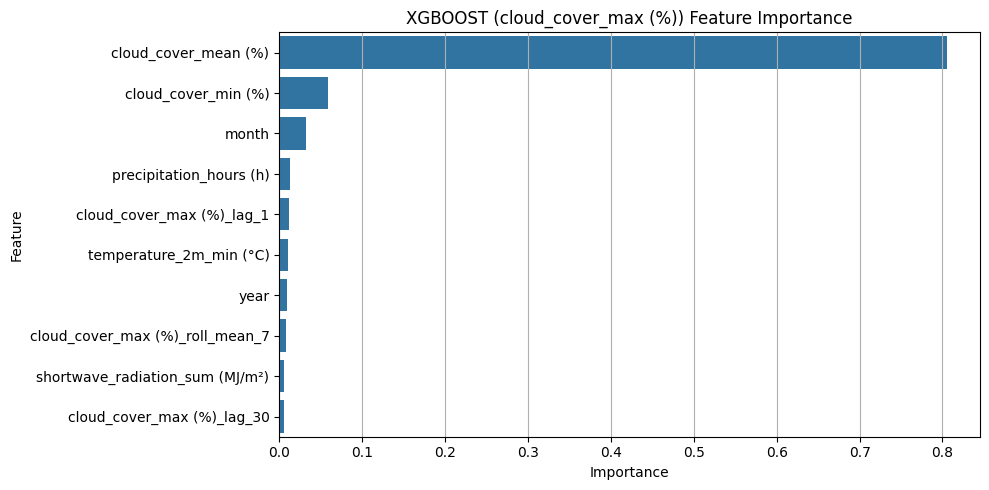


🔧 Training LIGHTGBM for cloud_cover_max (%) with CV...
Fitting 5 folds for each of 81 candidates, totalling 405 fits
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.3, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.3, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000813 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3311
[LightGBM] [Info] Number of data points in the train set: 6910, number of used features: 21
[LightGBM] [Info] Start training from score 56.749783
[LightGBM] [Warning] No further splits with po

In [ ]:


# --------------------------- MODEL TRAINING WITH CUSTOM DATA SPLIT ---------------------------
def split_train_val_test_custom(df, target, train_years=18, val_years=3, test_years=4):
    # Determine the split based on years
    train_end = df.index.year.min() + train_years
    val_end = train_end + val_years
    test_end = val_end + test_years
    
    # Split data based on the years
    df_train = df[df.index.year <= train_end]
    df_val = df[(df.index.year > train_end) & (df.index.year <= val_end)]
    df_test = df[(df.index.year > val_end) & (df.index.year <= test_end)]
    
    X_train = df_train.drop(columns=[target])
    y_train = df_train[target]
    
    X_val = df_val.drop(columns=[target])
    y_val = df_val[target]
    
    X_test = df_test.drop(columns=[target])
    y_test = df_test[target]
    
    test_dates = df_test.index
    
    return X_train, y_train, X_val, y_val, X_test, y_test, test_dates

# --------------------------- MODEL TRAINING WITH CROSS-VALIDATION ---------------------------
def train_and_evaluate_with_cv(df, target, model_type):
    df_feat = create_features(df, target)
    X_train, y_train, X_val, y_val, X_test, y_test, test_dates = split_train_val_test_custom(df_feat, target)

    # Hyperparameter grid for tuning
    if model_type == 'random_forest':
        param_grid = {
            'n_estimators': [50, 100, 150],
            'max_depth': [5, 10, 15],
            'min_samples_split': [2, 5, 10]
        }
        model = RandomForestRegressor(random_state=42)

    elif model_type == 'xgboost':
        param_grid = {
            'n_estimators': [50, 100, 150],
            'max_depth': [3, 5, 7],
            'alpha': [0.1, 0.3, 0.5],
            'lambda_': [0.1, 0.3, 0.5],
            'gamma': [0.0, 0.1, 0.2]
        }
        model = XGBRegressor(random_state=42)

    elif model_type == 'lightgbm':
        param_grid = {
            'n_estimators': [50, 100, 150],
            'max_depth': [3, 5, 7],
            'lambda_l1': [0.0, 0.1, 0.5],
            'lambda_l2': [0.1, 0.3, 0.5]
        }
        model = LGBMRegressor(random_state=42)

    else:
        raise ValueError("Invalid model type")

    # Perform GridSearchCV with cross-validation
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
    grid_search.fit(X_train, y_train)

    # Get the best model from the grid search
    best_model = grid_search.best_estimator_
    
    # Evaluate on validation set
    y_val_pred = best_model.predict(X_val)
    val_metrics = evaluate_model(y_val, y_val_pred)
    plot_predictions(y_val.index, y_val, y_val_pred, f'{model_type.upper()} (VAL) with CV')

    # Evaluate on test set
    y_test_pred = best_model.predict(X_test)
    test_metrics = evaluate_model(y_test, y_test_pred)
    print(f"Test Metrics for {model_type.upper()} (CV):")
    print(pd.Series(test_metrics).round(3))

    return best_model, val_metrics, X_train.columns, (X_train, y_train, X_val, y_val, X_test, y_test, test_dates)

# --------------------------- STACKED ENSEMBLING WITH CROSS-VALIDATION ---------------------------
def stacking_predictions_with_cv(models, meta_model, X_train, y_train, X_val, y_val, X_test):
    train_meta = np.column_stack([model.predict(X_train) for model in models])
    val_meta = np.column_stack([model.predict(X_val) for model in models])
    test_meta = np.column_stack([model.predict(X_test) for model in models])

    # Train the meta-model (Ridge regression)
    meta_model.fit(train_meta, y_train)
    y_val_stack = meta_model.predict(val_meta)
    y_test_stack = meta_model.predict(test_meta)

    return y_val_stack, y_test_stack

# --------------------------- PIPELINE WITH CUSTOM DATA SPLIT ---------------------------
target_columns = [
    "temperature_2m_mean (°C)",
    "wind_speed_10m_mean (km/h)",
    "cloud_cover_max (%)"
]

filepath = r"C:\\Users\\shiva\\OneDrive\\Desktop\\weather.csv"
df = load_weather_data(filepath)

all_results = {}

for target in target_columns:
    print(f"\n{'='*60}")
    print(f"🏁 Starting processing for TARGET: {target}")
    print(f"{'='*60}")
    
    model_results = {}
    models = {}
    features = {}

    # Train base models with cross-validation
    for model_type in ['random_forest', 'xgboost', 'lightgbm']:
        print(f"\n🔧 Training {model_type.upper()} for {target} with CV...")
        model, val_metrics, feature_names, data_split = train_and_evaluate_with_cv(df, target, model_type)
        model_results[model_type] = val_metrics
        models[model_type] = model
        features[model_type] = feature_names
        plot_feature_importance(model, feature_names, f"{model_type.upper()} ({target})")

    # Stacking with Ridge as meta model
    print(f"\n🔁 Training STACKED ENSEMBLE for {target} with CV...")
    X_train, y_train, X_val, y_val, X_test, y_test, test_dates = data_split
    meta_model = Ridge(alpha=1.0)

    y_val_stack, y_test_stack = stacking_predictions_with_cv(
        list(models.values()), meta_model, X_train, y_train, X_val, y_val, X_test
    )

    stacked_val_metrics = evaluate_model(y_val, y_val_stack)
    model_results['stacked_ensemble'] = stacked_val_metrics
    plot_predictions(y_val.index, y_val, y_val_stack, f'STACKED ENSEMBLE ({target})')

    # Save performance metrics
    print(f"\n📊 Validation Performance Comparison for {target}")
    perf_df = pd.DataFrame(model_results)
    print(perf_df.round(3))
    all_results[target] = perf_df.round(3)

    # Final test set evaluation (only for reporting, not tuning)
    print(f"\n🧪 FINAL TEST SET EVALUATION for {target}")
    final_metrics = evaluate_model(y_test, y_test_stack)
    print(pd.Series(final_metrics).round(3))

# --------------------------- FINAL RESULTS ---------------------------
print(f"\n{'='*60}")
print("✅ ALL TARGETS COMPLETED")
print(f"{'='*60}")

for target, perf_df in all_results.items():
    print(f"\n📈 Validation Results for {target}")
    print(perf_df)


# train and test with 3 types of ensembling


processing started for temperature_2m_max (°C)

Training RANDOM_FOREST for temperature_2m_max (°C)...


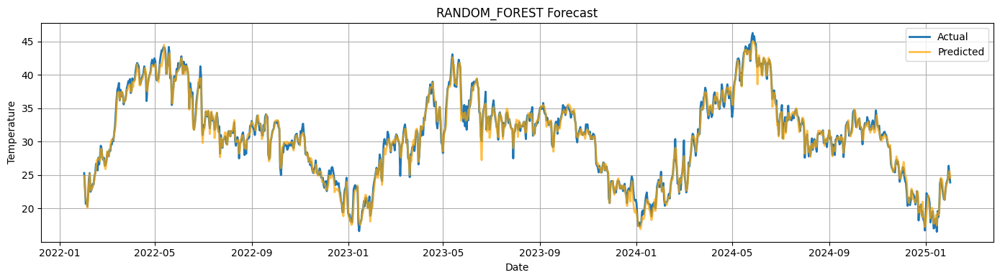

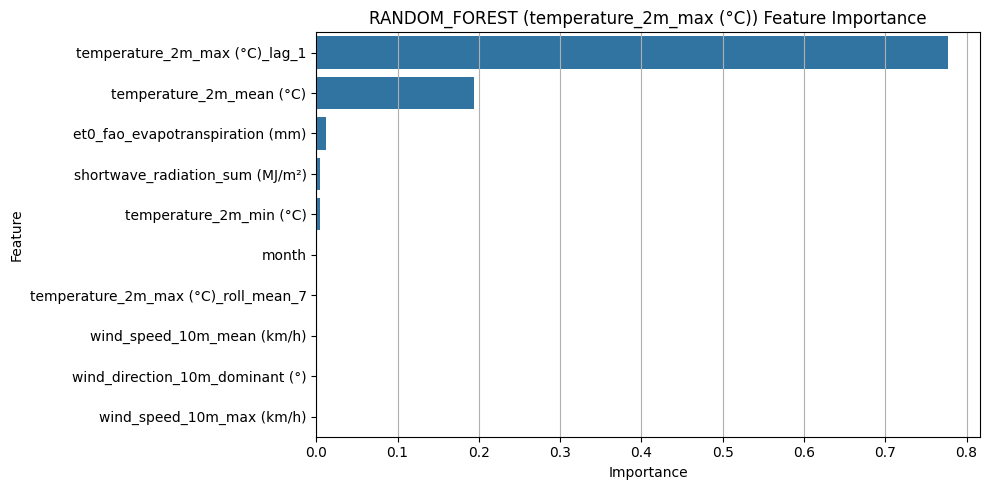


Training XGBOOST for temperature_2m_max (°C)...


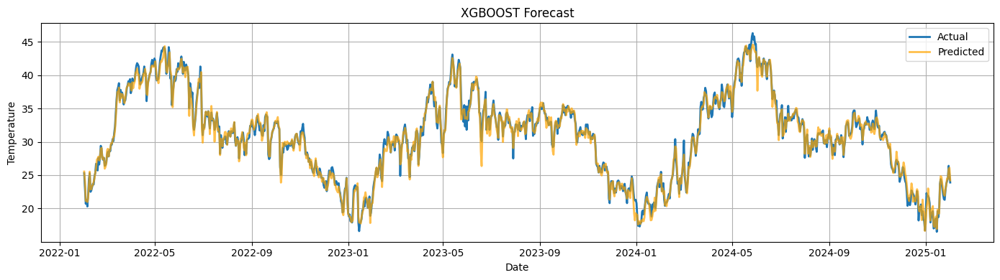

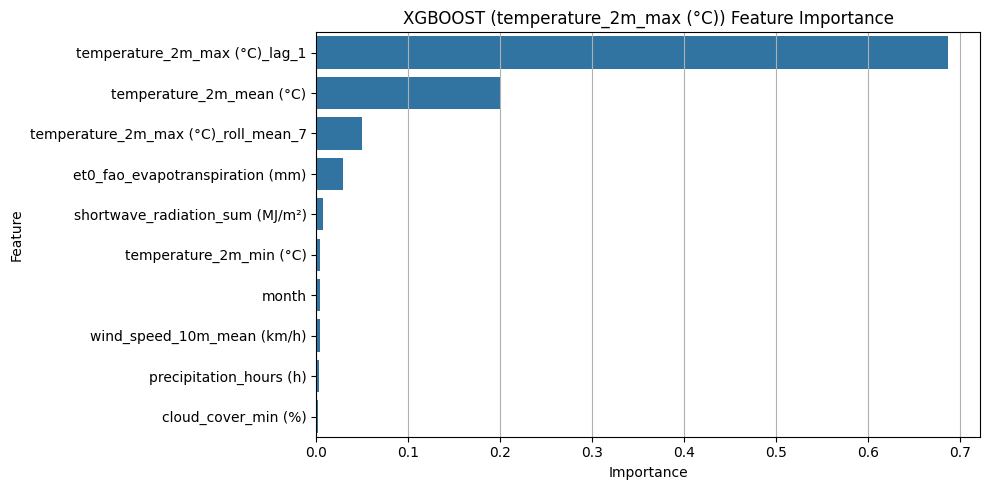


Training LIGHTGBM for temperature_2m_max (°C)...


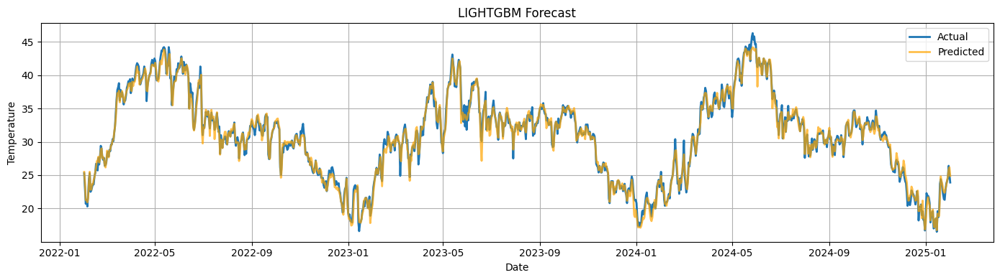

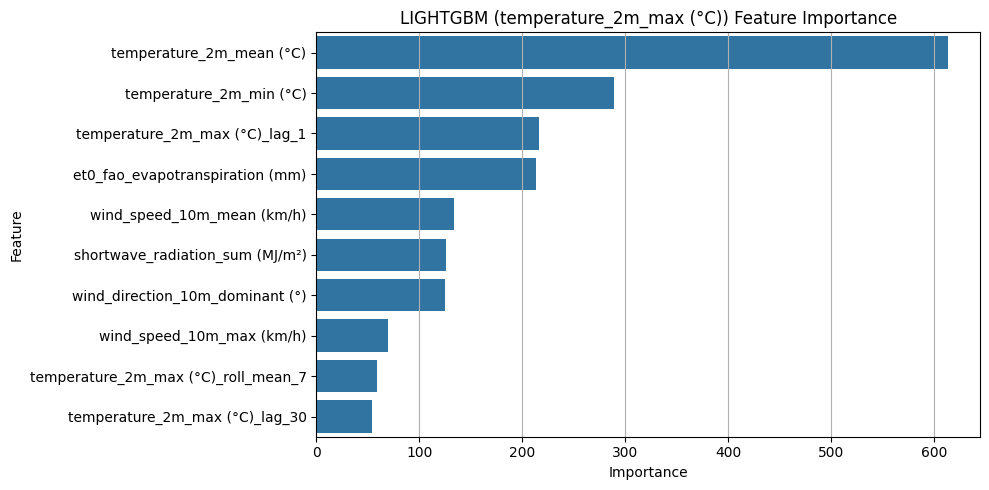


Training BAGGING Ensemble...

Training VOTING Ensemble...


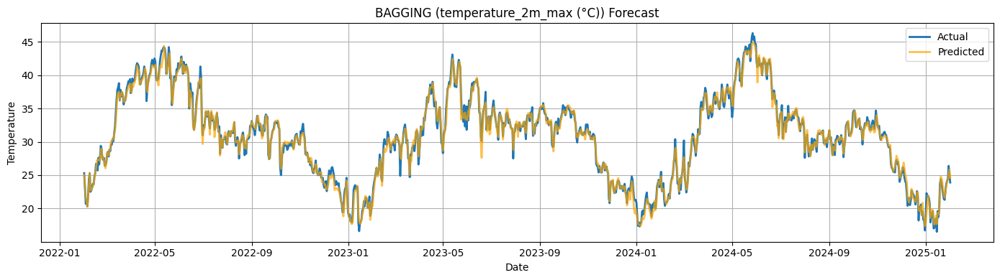

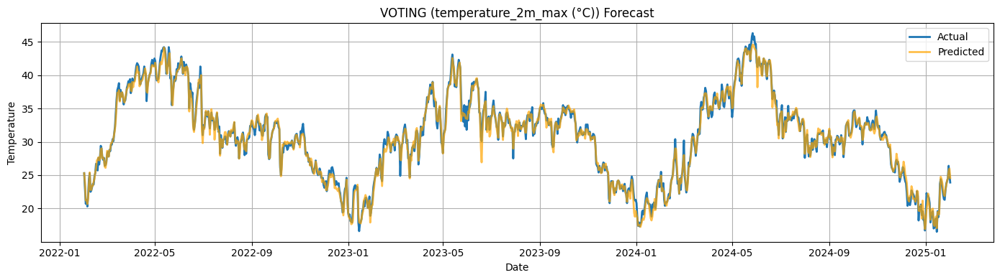


Training STACKED ENSEMBLE for temperature_2m_max (°C):


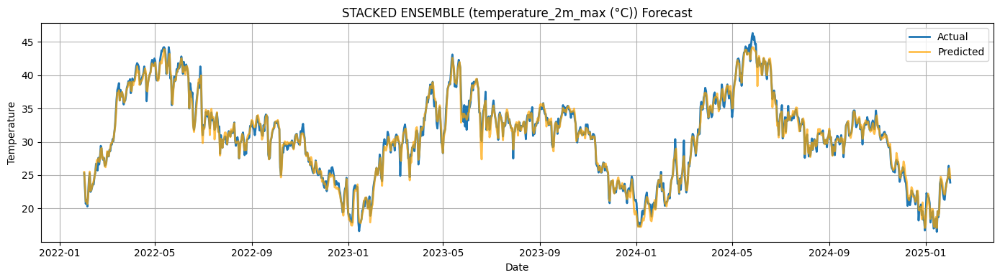


Performance for temperature_2m_max (°C)
              random_forest  xgboost  lightgbm  bagging  voting  \
RMSE                  0.723    0.727     0.708    0.722   0.688   
MAE                   0.552    0.552     0.533    0.551   0.517   
R²                    0.987    0.987     0.987    0.987   0.988   
Accuracy (%)         98.211   98.210    98.273   98.213  98.325   

              stacked_ensemble  
RMSE                     0.672  
MAE                      0.505  
R²                       0.989  
Accuracy (%)            98.363  

processing started for temperature_2m_min (°C)

Training RANDOM_FOREST for temperature_2m_min (°C)...


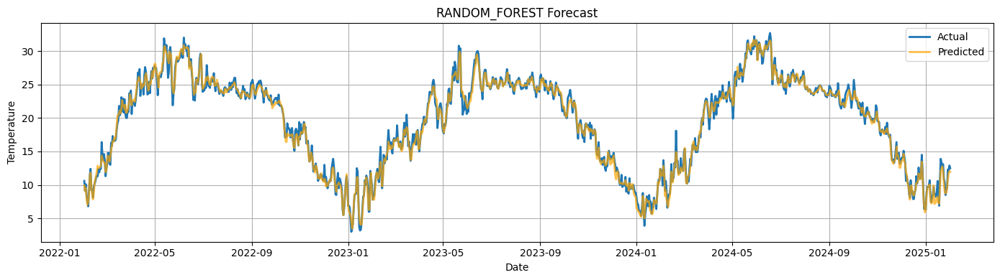

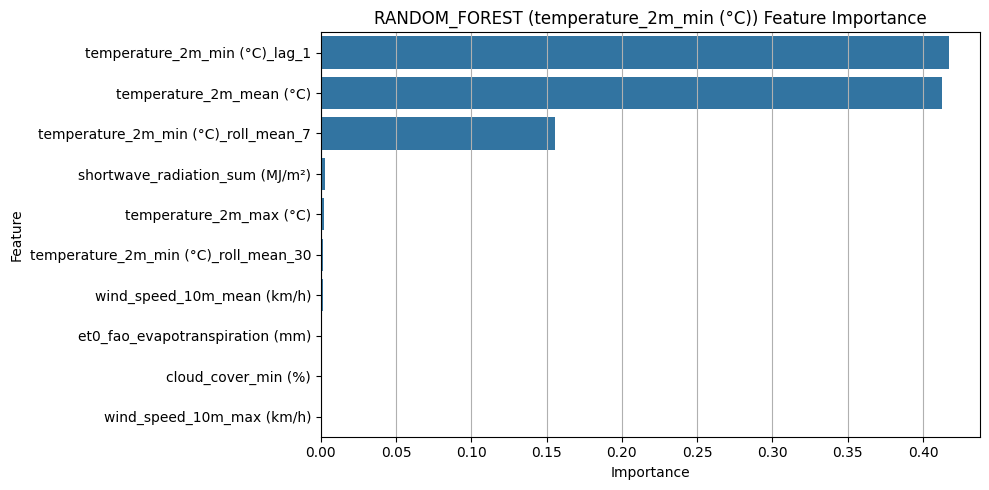


Training XGBOOST for temperature_2m_min (°C)...


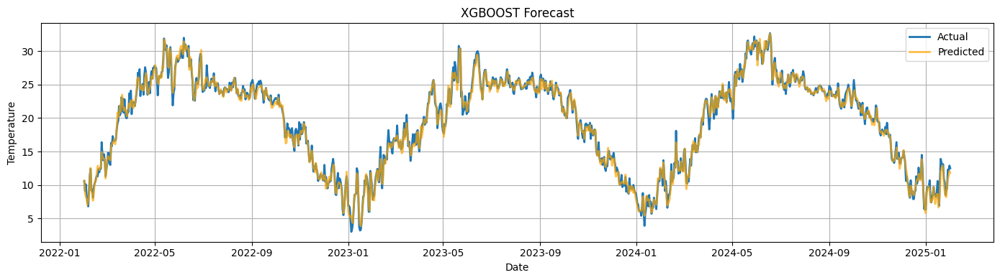

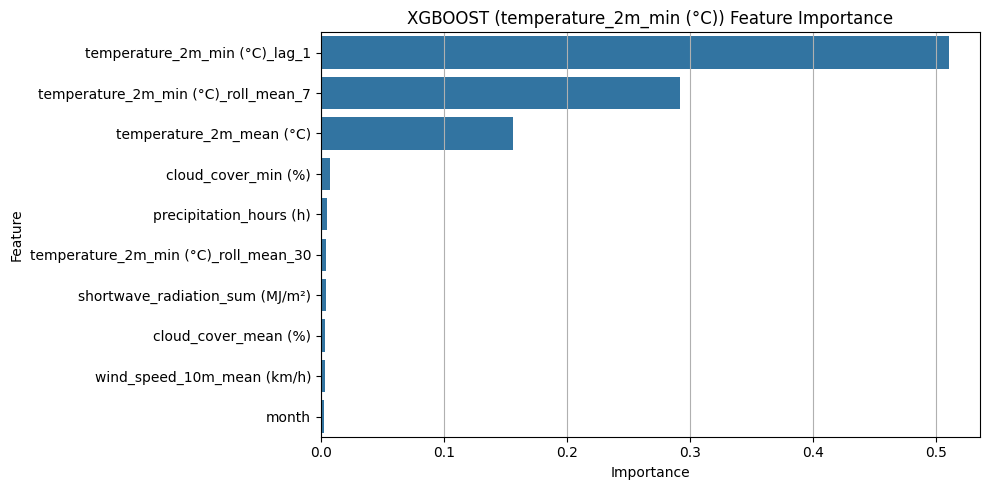


Training LIGHTGBM for temperature_2m_min (°C)...


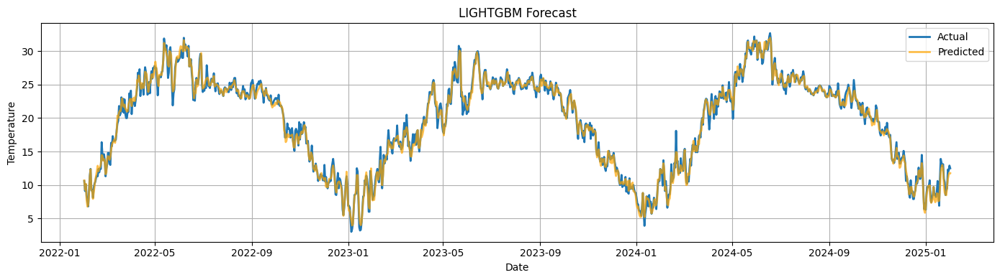

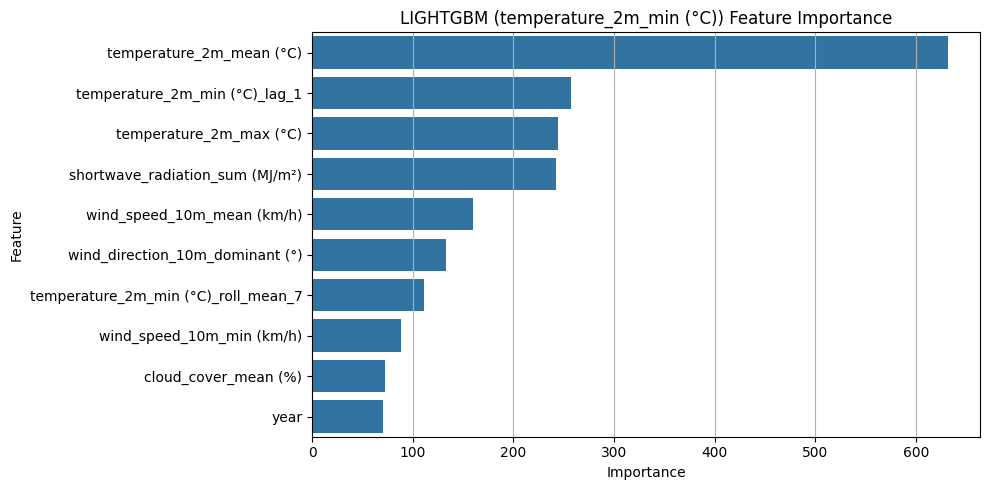


Training BAGGING Ensemble...

Training VOTING Ensemble...


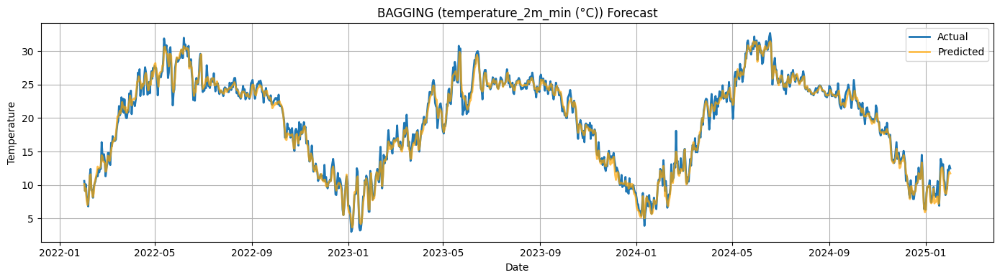

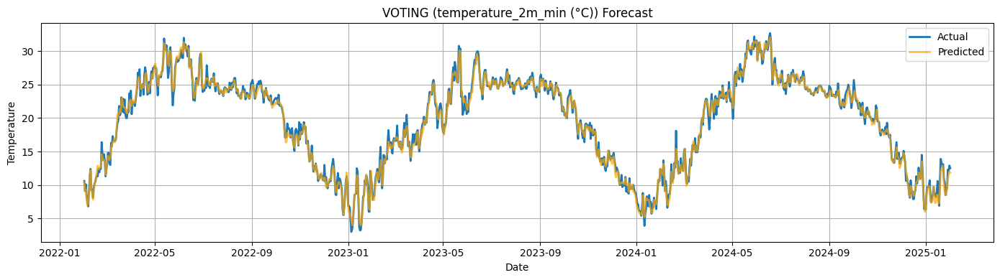


Training STACKED ENSEMBLE for temperature_2m_min (°C):


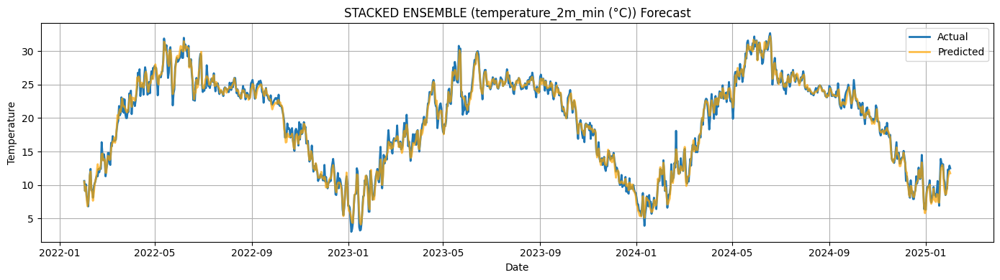


Performance for temperature_2m_min (°C)
              random_forest  xgboost  lightgbm  bagging  voting  \
RMSE                  0.774    0.719     0.733    0.775   0.709   
MAE                   0.601    0.560     0.571    0.603   0.554   
R²                    0.987    0.989     0.988    0.987   0.989   
Accuracy (%)         96.917   97.128    97.072   96.907  97.162   

              stacked_ensemble  
RMSE                     0.698  
MAE                      0.547  
R²                       0.989  
Accuracy (%)            97.196  

processing started for wind_speed_10m_mean (km/h)

Training RANDOM_FOREST for wind_speed_10m_mean (km/h)...


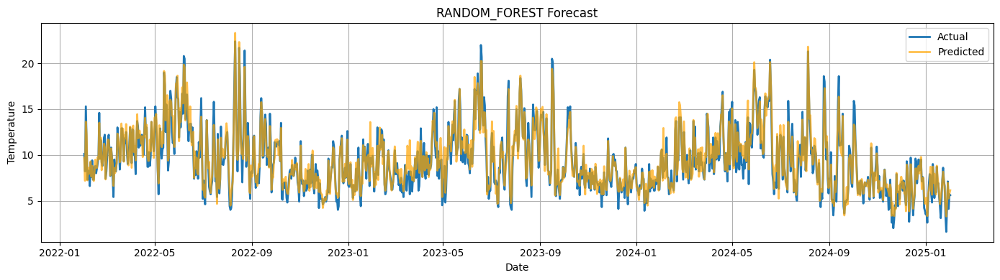

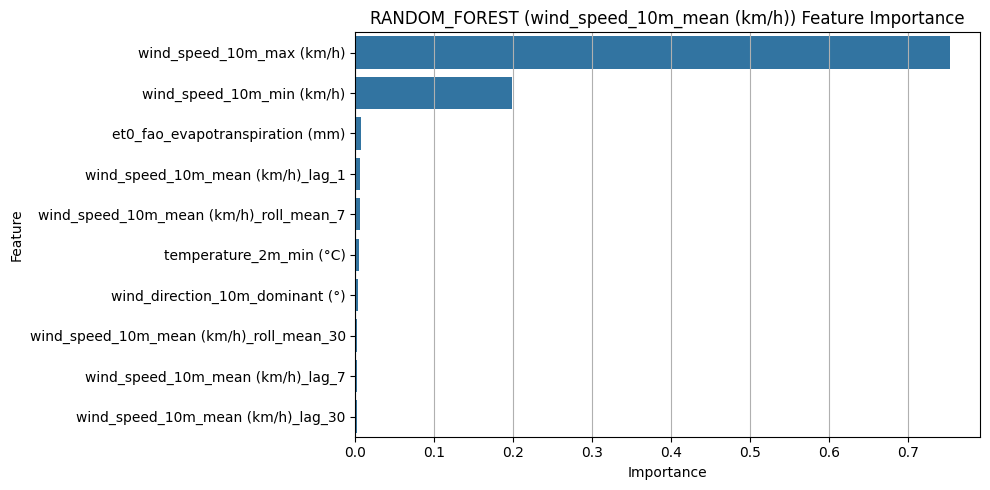


Training XGBOOST for wind_speed_10m_mean (km/h)...


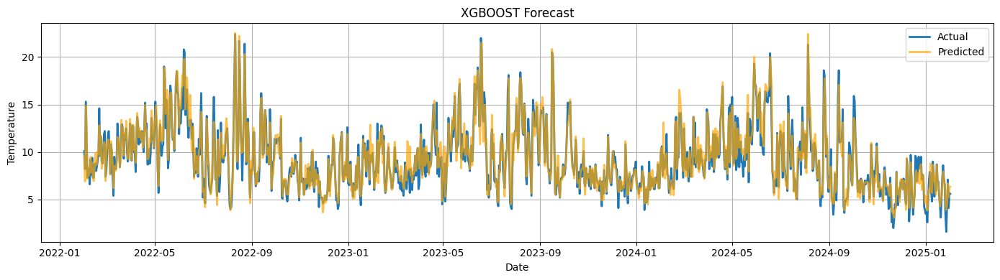

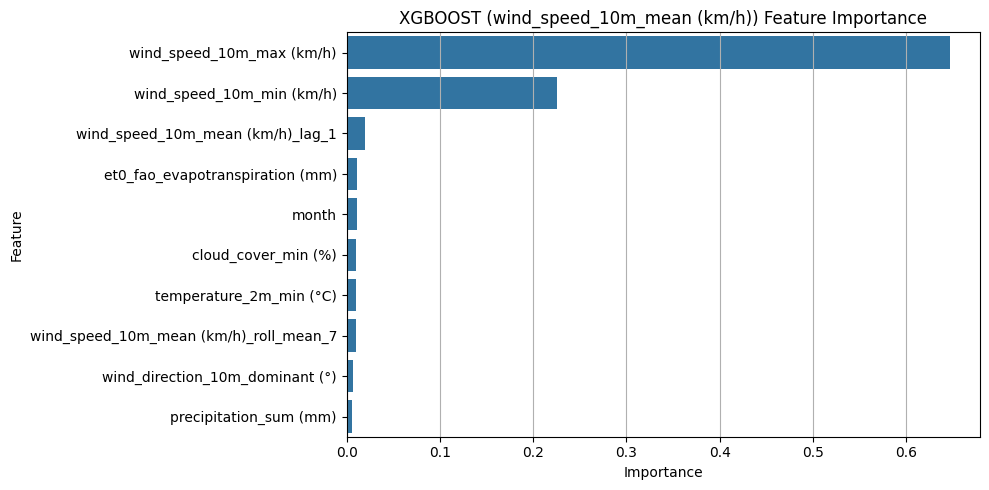


Training LIGHTGBM for wind_speed_10m_mean (km/h)...


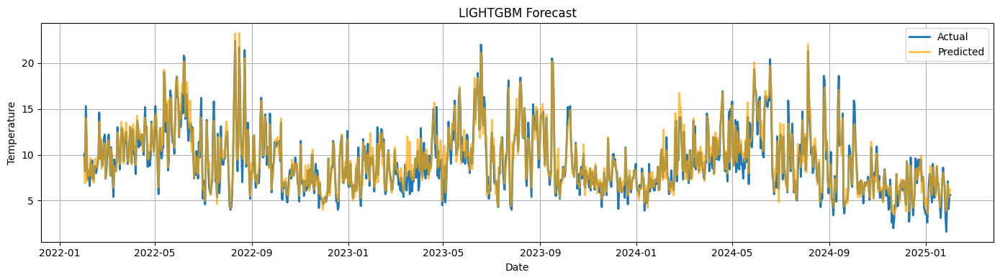

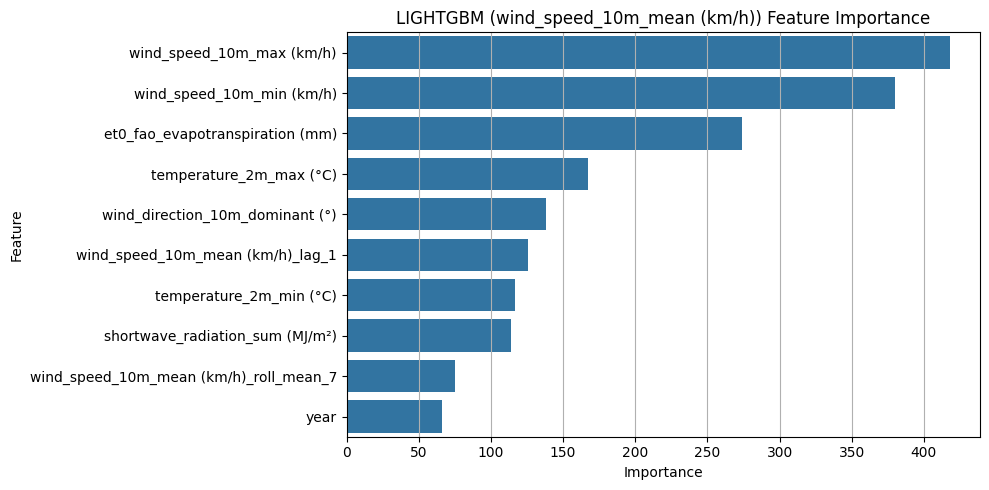


Training BAGGING Ensemble...

Training VOTING Ensemble...


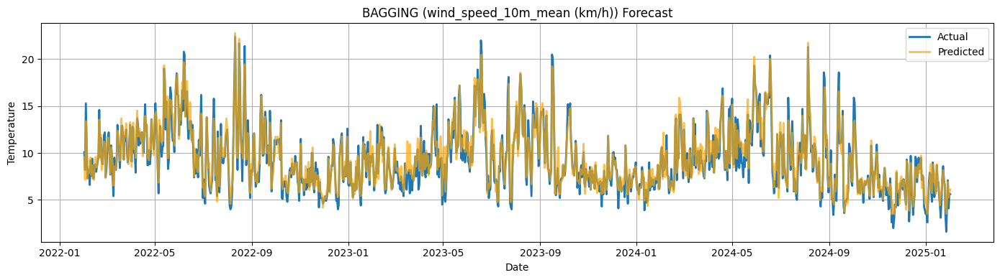

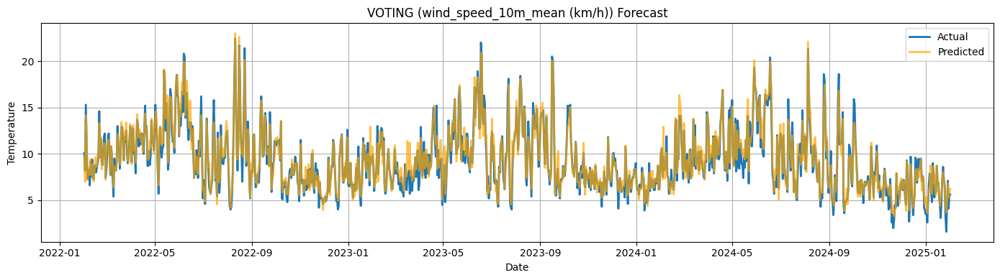


Training STACKED ENSEMBLE for wind_speed_10m_mean (km/h):


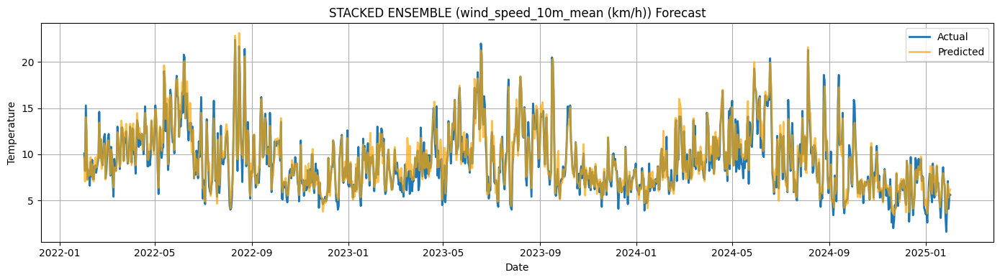


Performance for wind_speed_10m_mean (km/h)
              random_forest  xgboost  lightgbm  bagging  voting  \
RMSE                  1.047    0.987     0.994    1.033   0.983   
MAE                   0.768    0.734     0.730    0.761   0.719   
R²                    0.906    0.917     0.915    0.909   0.917   
Accuracy (%)         91.785   92.151    92.195   91.865  92.312   

              stacked_ensemble  
RMSE                     0.963  
MAE                      0.709  
R²                       0.921  
Accuracy (%)            92.421  

processing started for cloud_cover_max (%)

Training RANDOM_FOREST for cloud_cover_max (%)...


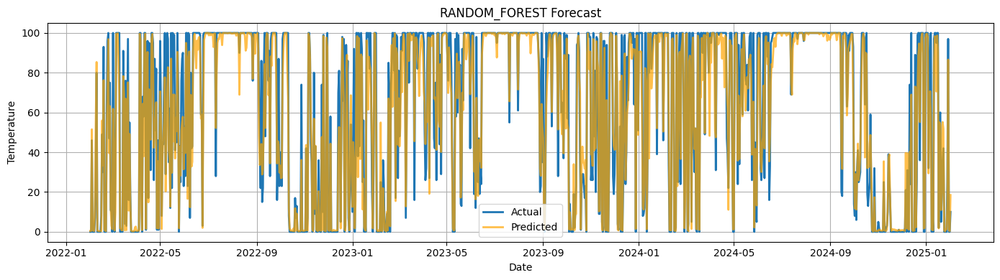

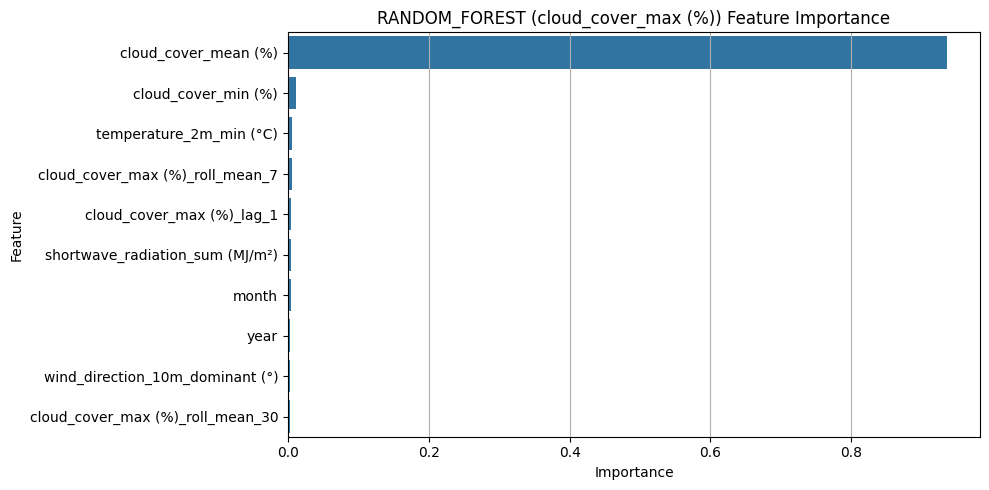


Training XGBOOST for cloud_cover_max (%)...


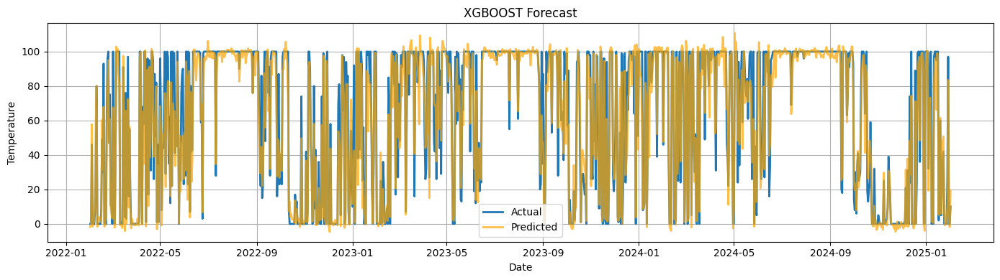

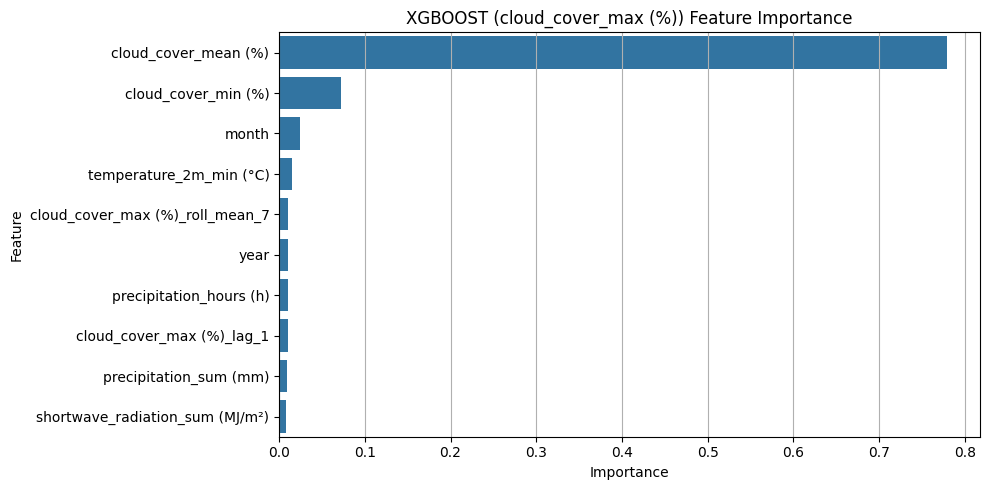


Training LIGHTGBM for cloud_cover_max (%)...


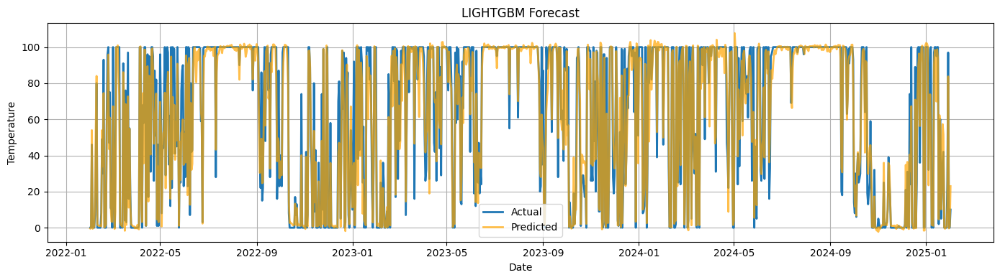

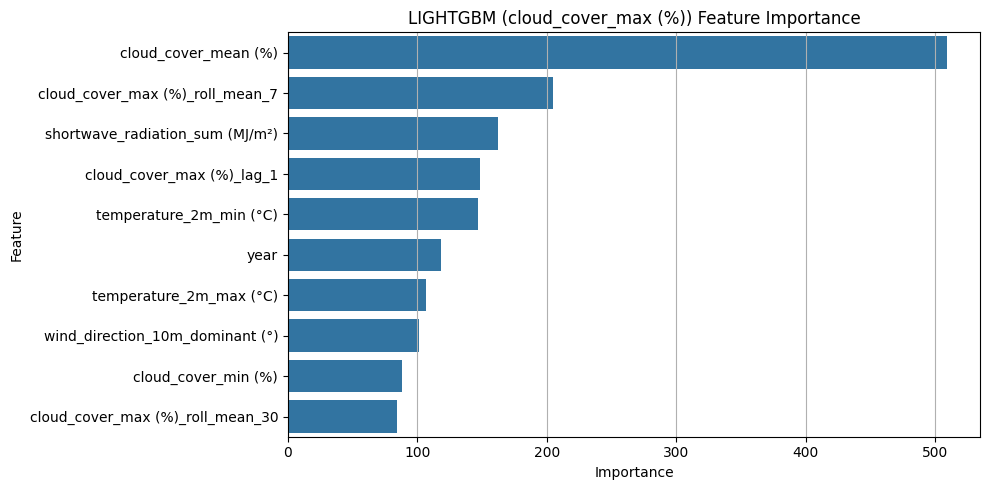


Training BAGGING Ensemble...

Training VOTING Ensemble...


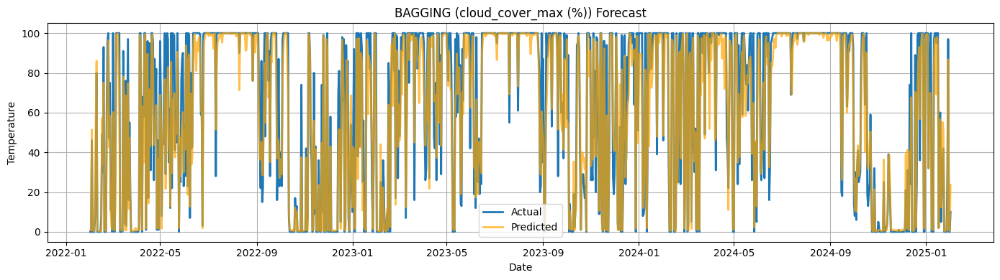

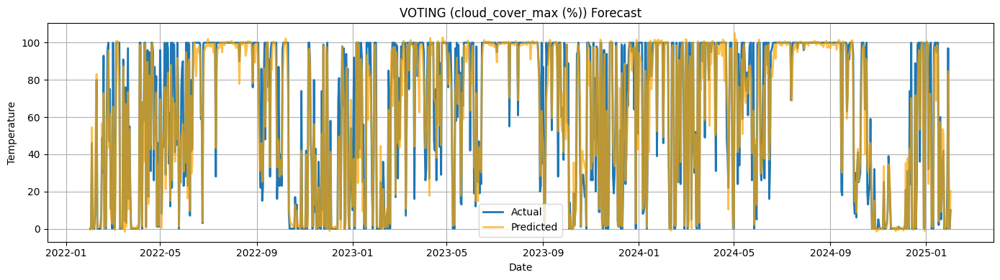


Training STACKED ENSEMBLE for cloud_cover_max (%):


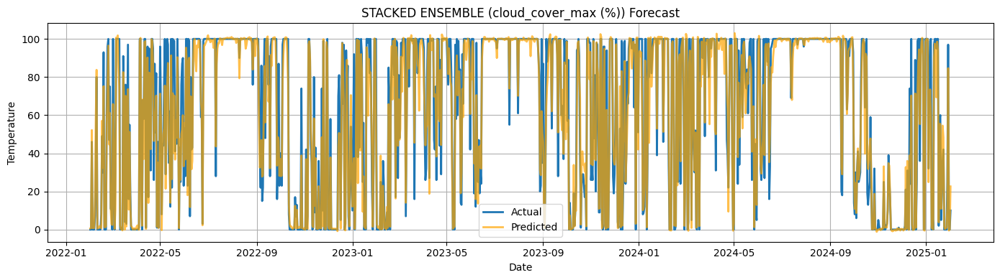


Performance for cloud_cover_max (%)
              random_forest  xgboost  lightgbm  bagging  voting  \
RMSE                 11.739   11.295    11.124   11.728  11.150   
MAE                   6.941    6.953     6.639    6.999   6.617   
R²                    0.918    0.924     0.926    0.918   0.926   
Accuracy (%)         89.357   89.339    89.820   89.268  89.854   

              stacked_ensemble  
RMSE                    11.051  
MAE                      6.461  
R²                       0.927  
Accuracy (%)            90.093  

processing started for cloud_cover_min (%)

Training RANDOM_FOREST for cloud_cover_min (%)...


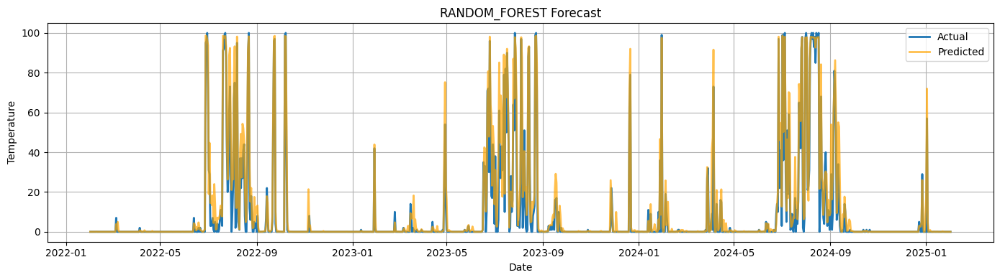

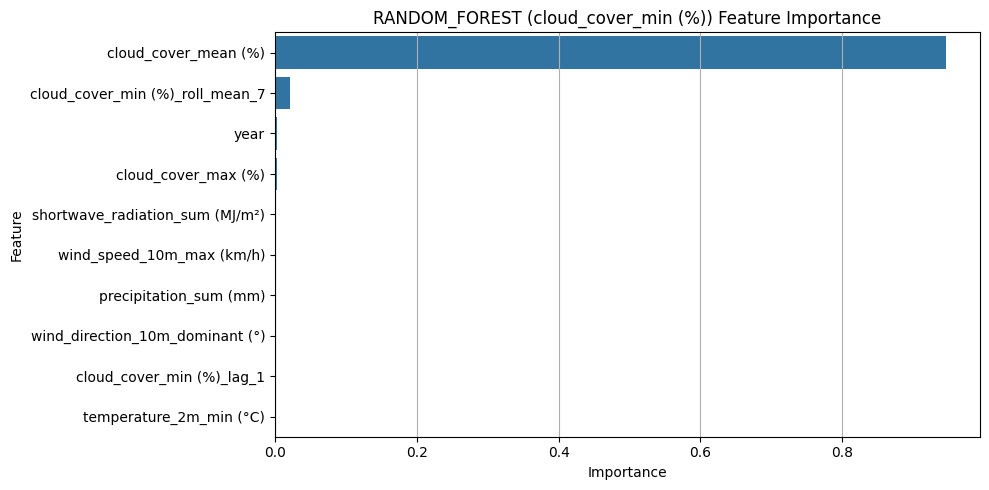


Training XGBOOST for cloud_cover_min (%)...


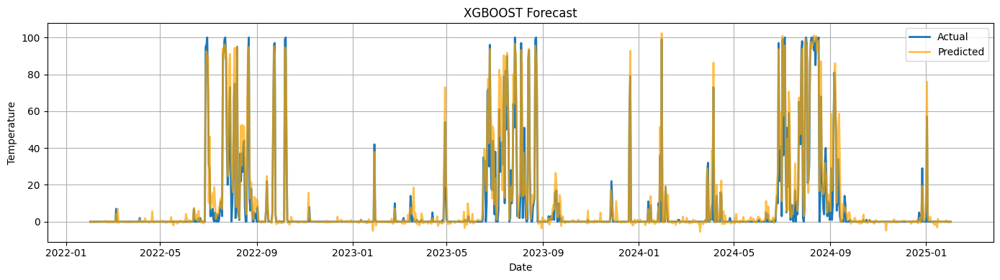

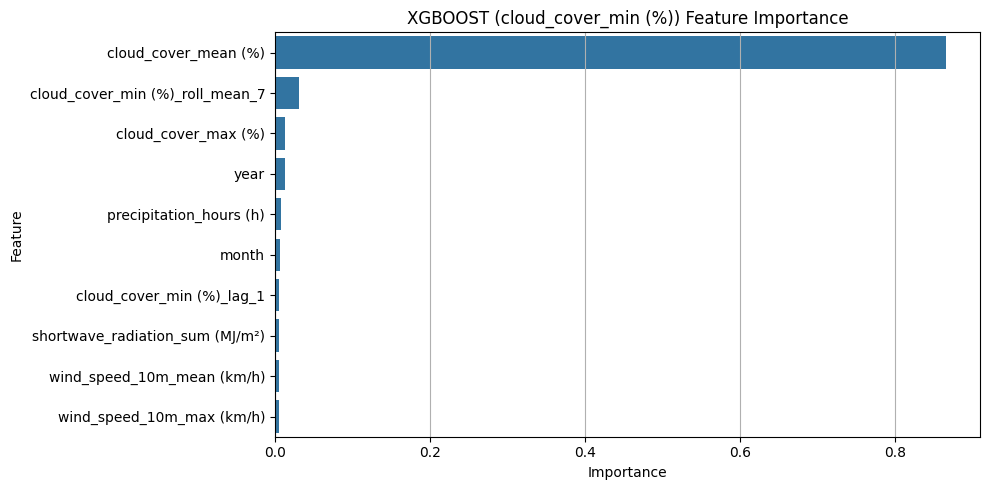


Training LIGHTGBM for cloud_cover_min (%)...


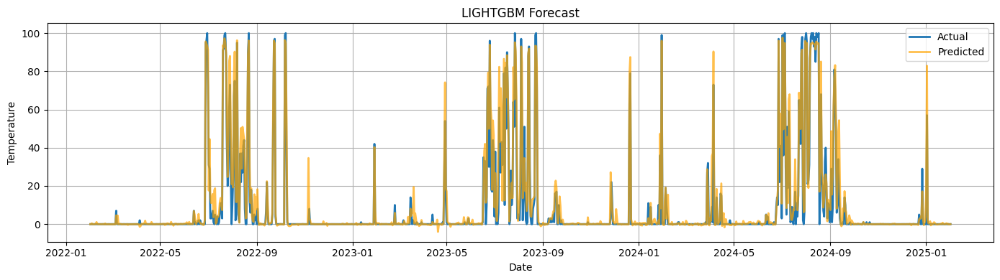

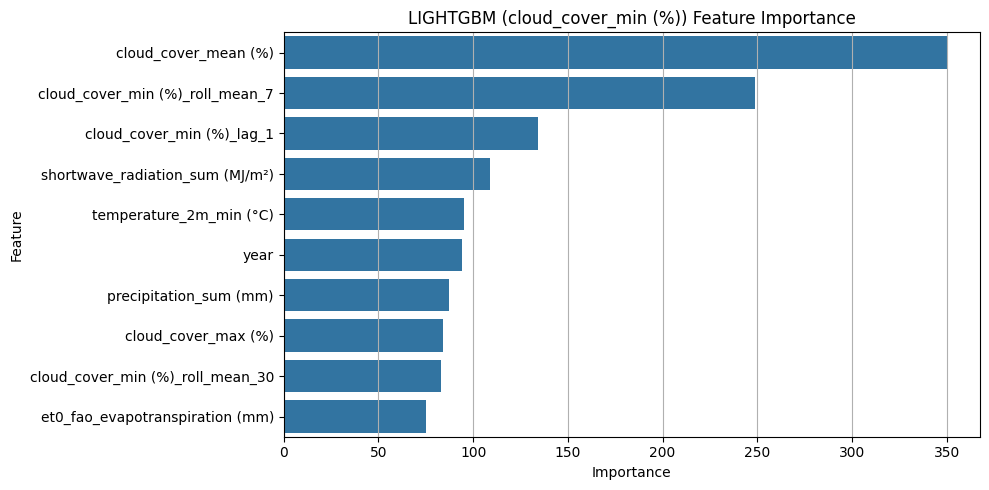


Training BAGGING Ensemble...

Training VOTING Ensemble...


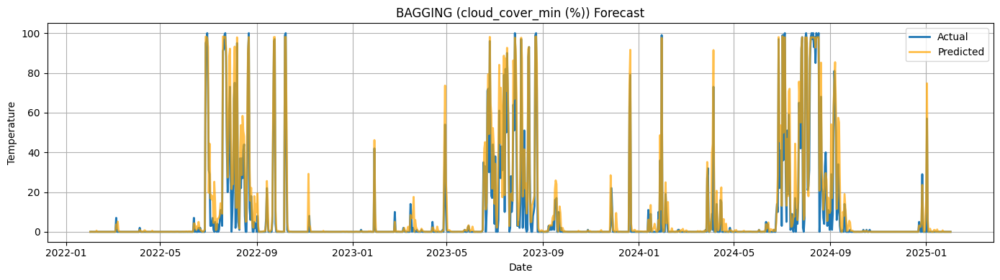

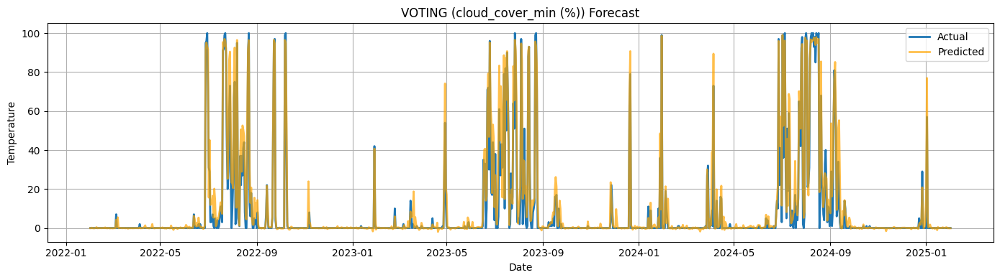


Training STACKED ENSEMBLE for cloud_cover_min (%):


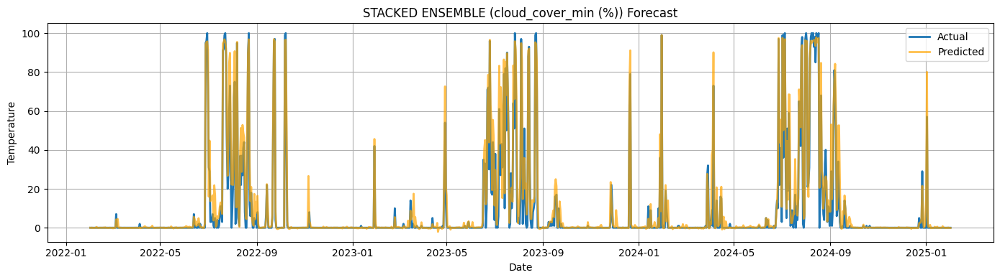


Performance for cloud_cover_min (%)
              random_forest  xgboost  lightgbm  bagging  voting  \
RMSE                  6.623    6.619     6.322    6.937   6.392   
MAE                   2.720    2.979     2.655    2.884   2.701   
R²                    0.913    0.913     0.921    0.904   0.919   
Accuracy (%)         67.825   64.761    68.601   65.890  68.054   

              stacked_ensemble  
RMSE                     6.420  
MAE                      2.692  
R²                       0.918  
Accuracy (%)            68.159  

ALL TARGETS COMPLETED

Results for temperature_2m_max (°C)
              random_forest  xgboost  lightgbm  bagging  voting  \
RMSE                  0.723    0.727     0.708    0.722   0.688   
MAE                   0.552    0.552     0.533    0.551   0.517   
R²                    0.987    0.987     0.987    0.987   0.988   
Accuracy (%)         98.211   98.210    98.273   98.213  98.325   

              stacked_ensemble  
RMSE                     0.672  


In [25]:
def load_weather_data(filepath):
    df = pd.read_csv(filepath, index_col=0)
    df.index = pd.to_datetime(df.index, dayfirst=True)
    df = df.asfreq('D')  # daily frequency
    df = df.sort_index()
    return df

def create_features(df, target, lags=[1, 7, 30], windows=[7, 30]):
    df_feat = df.copy()
    for lag in lags:
        df_feat[f'{target}_lag_{lag}'] = df_feat[target].shift(lag)
    for win in windows:
        df_feat[f'{target}_roll_mean_{win}'] = df_feat[target].rolling(win).mean()
    df_feat['day'] = df_feat.index.day
    df_feat['month'] = df_feat.index.month
    df_feat['year'] = df_feat.index.year
    return df_feat.dropna()

def train_test_split_time_series(df, target, train_years=22, test_years=3):
    start_date = df.index.min()
    end_date = df.index.max()

    train_end_date = start_date + pd.DateOffset(years=train_years)
    test_start_date = train_end_date + pd.DateOffset(days=1)
    test_end_date = test_start_date + pd.DateOffset(years=test_years)

    # Split the dataset based on the dates
    df_train = df[(df.index >= start_date) & (df.index <= train_end_date)]
    df_test = df[(df.index >= test_start_date) & (df.index <= test_end_date)]

    # Split features and target for both train and test sets
    X_train = df_train.drop(columns=[target])
    X_test = df_test.drop(columns=[target])
    y_train = df_train[target]
    y_test = df_test[target]

    return X_train, X_test, y_train, y_test, df_test.index

def stacking_predictions(models, meta_model, X_train, y_train, X_test, cv=5, random_state=42):
    X_train = np.asarray(X_train)
    X_test  = np.asarray(X_test)
    y_train = np.asarray(y_train)

    n_train, n_test = X_train.shape[0], X_test.shape[0]
    n_models = len(models)

    # placeholders for stacked features
    S_train = np.zeros((n_train, n_models))
    S_test  = np.zeros((n_test,  n_models))

    kf = KFold(n_splits=cv, shuffle=True, random_state=random_state)

    # for each base model, create OOF train preds and averaged test preds
    for i, model in enumerate(models):
        S_test_i = np.zeros((n_test, cv))

        for fold, (train_idx, val_idx) in enumerate(kf.split(X_train)):
            X_tr, X_val = X_train[train_idx], X_train[val_idx]
            y_tr, y_val = y_train[train_idx], y_train[val_idx]

            model.fit(X_tr, y_tr)

            S_train[val_idx, i] = model.predict(X_val)
            S_test_i[:, fold] = model.predict(X_test)

        S_test[:, i] = S_test_i.mean(axis=1)

    # now train the meta‑model on stacked train set
    meta_model.fit(S_train, y_train)
    # predict on stacked test set
    y_meta_pred = meta_model.predict(S_test)

    return y_meta_pred


def evaluate_model(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mean_actual = np.mean(y_true)
    return {
        'RMSE': np.sqrt(mean_squared_error(y_true, y_pred)),
        'MAE': mae,
        'R²': r2_score(y_true, y_pred),
        'Accuracy (%)': 100 * (1 - mae / mean_actual)
    }

def plot_predictions(dates, y_true, y_pred, model_name):
    plt.figure(figsize=(14, 4))
    plt.plot(dates, y_true, label='Actual', linewidth=2)
    plt.plot(dates, y_pred, label='Predicted', linewidth=2, color='orange', alpha=0.7)
    plt.title(f'{model_name} Forecast')
    plt.xlabel('Date')
    plt.ylabel('Temperature')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def plot_feature_importance(model, feature_names, model_name):
    importances = model.feature_importances_
    feat_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
    feat_df = feat_df.sort_values(by='Importance', ascending=False)

    plt.figure(figsize=(10, 5))
    sns.barplot(data=feat_df.head(10), x='Importance', y='Feature')
    plt.title(f'{model_name} Feature Importance')
    plt.tight_layout()
    plt.grid(axis='x')
    plt.show()

def train_and_evaluate(df, target, model_type):
    df_feat = create_features(df, target)
    X_train, X_test, y_train, y_test, test_dates = train_test_split_time_series(df_feat, target)

    if model_type == 'random_forest':
        model = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)
    elif model_type == 'xgboost':
        model = XGBRegressor(n_estimators=100, max_depth=5, random_state=42)
    elif model_type == 'lightgbm':
        model = LGBMRegressor(n_estimators=100, max_depth=5, random_state=42, verbose=-1)
    else:
        raise ValueError("Invalid model type")

    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    metrics = evaluate_model(y_test, y_pred)
    plot_predictions(test_dates, y_test, y_pred, model_type.upper())
    return model, metrics, X_train.columns

def train_ensemble_models(models, X_train, y_train):
    ensembles = {}

    # Bagging ensemble (using Random Forest as base)
    ensembles['bagging'] = BaggingRegressor(estimator=models['random_forest'], n_estimators=10, random_state=42)

    # Voting ensemble
    ensembles['voting'] = VotingRegressor(estimators=[
        ('rf', models['random_forest']),
        ('xgb', models['xgboost']),
        ('lgb', models['lightgbm'])
    ])

    for name, ensemble_model in ensembles.items():
        print(f"\nTraining {name.upper()} Ensemble...")
        ensemble_model.fit(X_train, y_train)

    return ensembles

target_columns = [
    "temperature_2m_max (°C)",
    "temperature_2m_min (°C)",
    "wind_speed_10m_mean (km/h)",
    "cloud_cover_max (%)",
    "cloud_cover_min (%)"
]

# PIPELINE 
filepath = r"write your file path here"
df = load_weather_data(filepath)

all_results = {}
for target in target_columns:
    print(f"\n{'='*60}")
    print(f"processing started for {target}")
    print(f"{'='*60}")
    
    model_results = {}
    models = {}
    features = {}

    # Train base models
    for model_type in ['random_forest', 'xgboost', 'lightgbm']:
        print(f"\nTraining {model_type.upper()} for {target}...")
        model, metrics, feature_names = train_and_evaluate(df, target, model_type)
        model_results[model_type] = metrics
        models[model_type] = model
        features[model_type] = feature_names
        plot_feature_importance(model, feature_names, f"{model_type.upper()} ({target})")

    # Prepare features for ensemble models
    df_feat = create_features(df, target)
    X_train, X_test, y_train, y_test, test_dates = train_test_split_time_series(df_feat, target)

    # Train & evaluate additional ensembles
    ensemble_models = train_ensemble_models(models, X_train, y_train)

    for name, ensemble_model in ensemble_models.items():
        y_pred = ensemble_model.predict(X_test)
        metrics = evaluate_model(y_test, y_pred)
        model_results[name] = metrics
        plot_predictions(test_dates, y_test, y_pred, f"{name.upper()} ({target})")

    # Train & evaluate stacked ensemble
    print(f"\nTraining STACKED ENSEMBLE for {target}:")
    meta_model = Ridge(alpha=1.0)
    y_stack = stacking_predictions(list(models.values()), meta_model, X_train, y_train, X_test)
    stacked_metrics = evaluate_model(y_test, y_stack)
    model_results['stacked_ensemble'] = stacked_metrics
    plot_predictions(test_dates, y_test, y_stack, f'STACKED ENSEMBLE ({target})')

    # Save and display results
    print(f"\nPerformance for {target}")
    perf_df = pd.DataFrame(model_results)
    print(perf_df.round(3))
    all_results[target] = perf_df.round(3)

# printing the comparision between models 
print(f"\n{'='*60}")
print("ALL TARGETS COMPLETED")
print(f"{'='*60}")

for target, perf_df in all_results.items():
    print(f"\nResults for {target}")
    print(perf_df)